In [6]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.dates as mdates
import matplotlib.lines as mlines
import numpy as np

import seaborn as sns

import pandas as pd

def get_top_makes(inp_data, inp_head_makes):
    top_makes=inp_data.groupby(['make']).count().reset_index().sort_values(by='bsns', ascending=False).head(inp_head_makes)[['make','bsns']]
    top_makes.columns=['make','cnt']
    return top_makes
def get_top_models(inp_data, inp_head_models):
    top_models=inp_data.groupby(['model']).count().reset_index().sort_values(by='bsns', ascending=False)[['model','bsns']]
    top_models=top_models.where(top_models['bsns']>inp_head_models).dropna()
    top_models.columns=['model','cnt']
    return top_models
def get_top_cities(inp_data, inp_head_cities):
    top_cities=data.groupby(['city']).count().reset_index().sort_values(by='bsns', ascending=False).head(inp_head_cities)[['city','bsns']]
    top_cities.columns=['city','cnt']
    return top_cities

data = pd.read_csv('WriteLines-cars3.txt', sep=";", header=None)
data.columns = ["allStrs", "bsns", "year", "make", "stars", "trips", "price", "href"]
data['trips']=data['trips'].str.replace('trips','')
data['trips']=data['trips'].str.replace('trip','')
data['trips']=data['trips'].str.replace('New listing','0')
data['trips']=data['trips'].str.replace('none','0')
data['price']=data['price'].str.replace('$','')

data['trips']=pd.to_numeric(data['trips'])
data['price']=pd.to_numeric(data['price'])
data['year']=pd.to_numeric(data['year'])
data['stars']=pd.to_numeric(data['stars'])
data['allStrs']=pd.to_numeric(data['allStrs'])
data['bsns']=pd.to_numeric(data['bsns'])

#data['price']=data['price'].str.replace('$','')


new = data['href'].str.split('/', n = 9, expand = True) 
  
data['vtype']= new[5] 
data['city']= new[6] 
data['make']=new[7]
data['model']=new[8]

data['money']=data.trips*data.price

t2=data.drop(['href',], axis=1)
t2=t2[t2['year']>=2000]
pd.set_option('display.max_rows', t2.shape[0]+1)
#t2['trips']=pd.to_numeric(t2['trips'])
t2['money']=t2['trips']*t2['price']
t2.sort_values('money', ascending = False).head(15)

,allStrs,bsns,year,make,stars,trips,price,vtype,city,model,money
600,0,1,2017,ferrari,5,73,799,car-rental,beverly-hills-ca,488-gtb,58327
45,1,0,2014,porsche,5,319,139,car-rental,emeryville-ca,boxster,44341
374,1,0,2014,porsche,5,210,199,car-rental,fremont-ca,911,41790
178,1,0,2006,porsche,5,136,209,car-rental,hillsborough-ca,911,28424
8,1,1,2017,tesla,5,287,98,car-rental,san-francisco-ca,model-3,28126
574,1,0,2017,chevrolet,5,211,109,car-rental,los-angeles-ca,corvette,22999
5,1,0,2013,porsche,5,110,189,car-rental,san-francisco-ca,911,20790
35,0,1,2016,porsche,5,127,159,car-rental,emeryville-ca,boxster,20193
10,1,1,2017,porsche,5,96,198,car-rental,burlingame-ca,911,19008
1317,0,0,2019,mclaren,5,22,799,car-rental,los-angeles-ca,570s,17578


In [7]:
import plotly.graph_objects as go
import plotly.express as px
top_models = get_top_models(data,15)
dd=data.loc[ data['model'].isin(top_models.model) ]
dd


fig = go.Figure(data=[go.Scatter3d(x=dd.price,y=dd.trips,z=dd.model,mode='markers',
    marker=dict(size=dd.money/500,color=dd.price, colorscale='Viridis', opacity=0.3))])
fig.show()

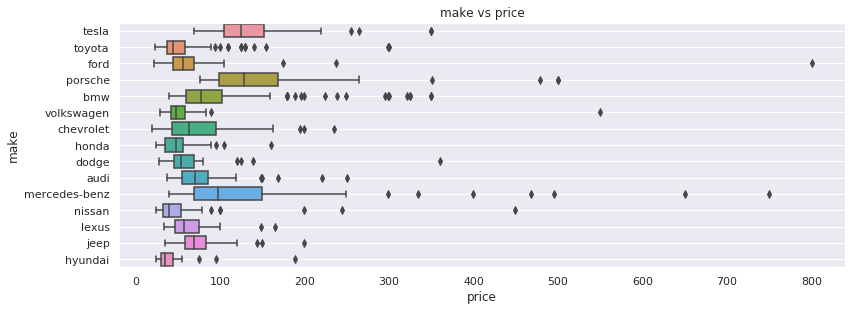

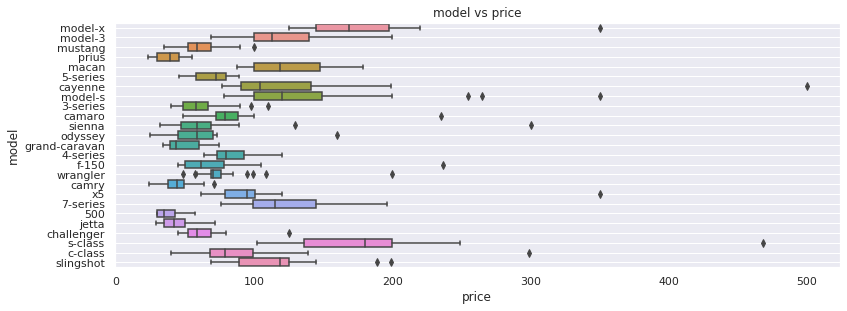

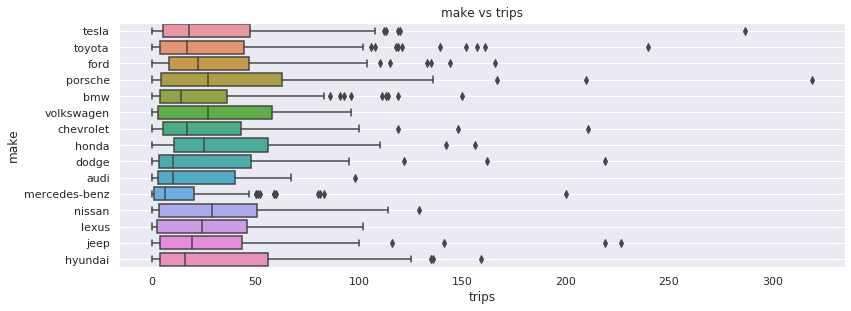

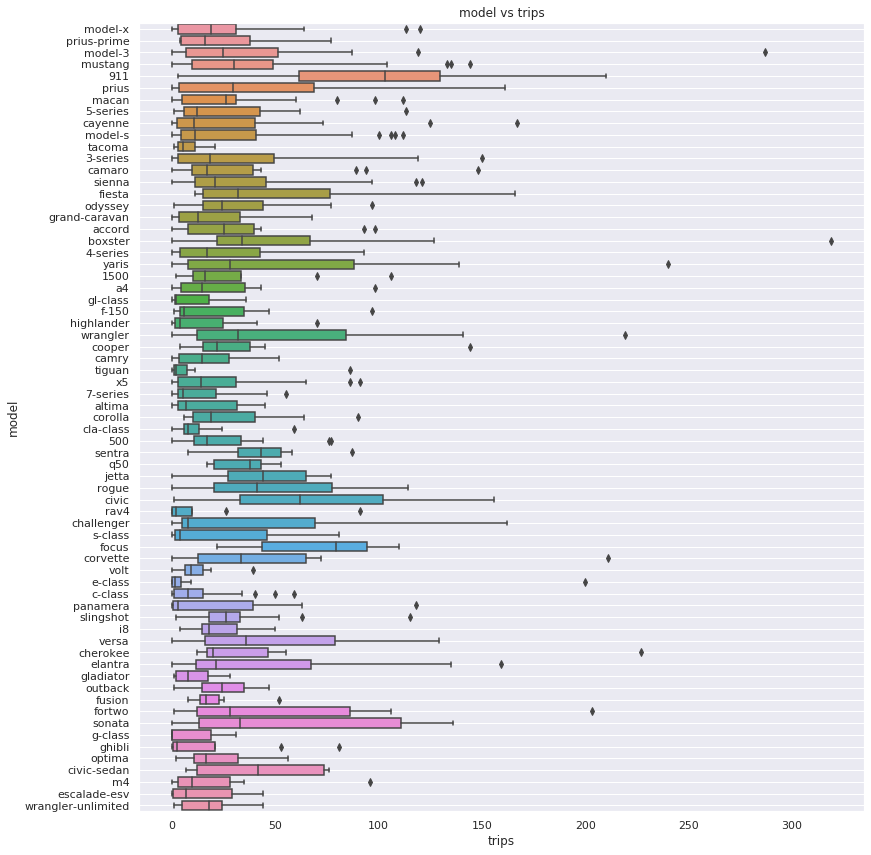

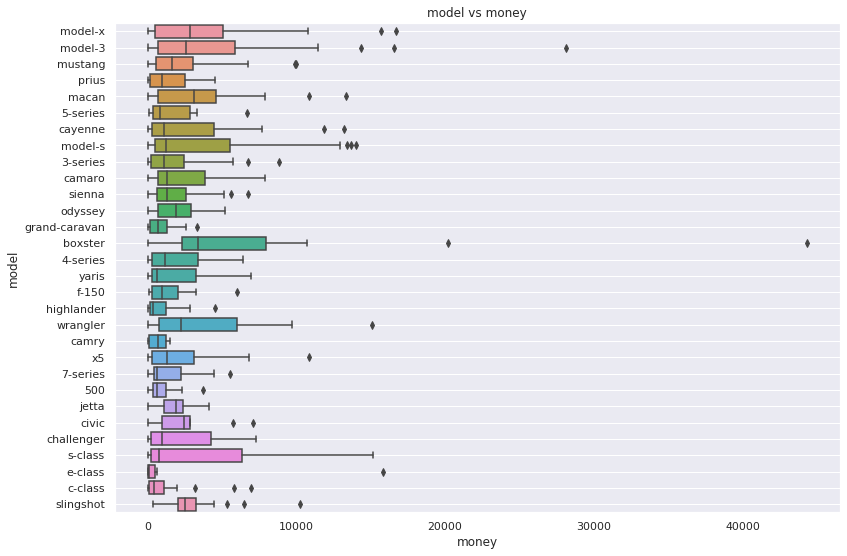

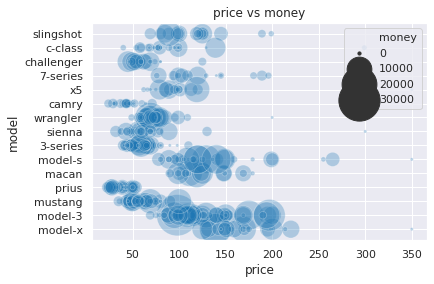

In [11]:
def do_box(inp_data, ttl, sz, ix, iy):
    fig=plt.figure(figsize=sz)
    sns.set_style("dark")
    #sns.set(rc={'figure.figsize':sz})
    ax = sns.boxplot(data=dd,x=ix,y=iy, orient="h")
    ax.yaxis.grid(True)
    ax.set_title(ttl)
    fig.show()
    
def do_scatter(inp_data, ttl, fsz, ssz, ix, iy, iss, alph, ih=None):
    fig=plt.figure(figsize=fsz)
    sns.set_context("notebook")
    #sns.set_style("dark")
    
    ax = sns.scatterplot(data=inp_data, x=ix, y=iy, size=iss, sizes=ssz, alpha=alph, hue=ih)
    ax.yaxis.grid(True)
    ax.xaxis.grid(True)
    ax.grid(b=True, which='major', color='w', linewidth=1.0)
    ax.grid(b=True, which='minor', color='w', linewidth=0.5)
    ax.set_title(ttl)
    plt.grid(True)

top_makes = get_top_makes(data,15)
top_models = get_top_models(data,5)
top_cities = get_top_cities(data,15)

dd=data.loc[ data['make'].isin(top_makes.make) ][['make','price']]
do_box(data,"make vs price", (13,4.5), 'price','make')

dd=data.loc[ data['model'].isin(top_models.head(25).model) ][['model','price']]
do_box(data,"model vs price", (13,4.5), 'price','model')

dd=data.loc[ data['make'].isin(top_makes.make) ][['make','trips']]
do_box(data,"make vs trips", (13,4.5), 'trips','make')

dd=data.loc[ data['model'].isin(top_models.model) ][['model','trips']]
do_box(data,"model vs trips", (13,14.5), 'trips','model')

dd=data.loc[ data['model'].isin(top_models.head(30).model) ][['model','money']]
do_box(data,"model vs money", (13,9), 'money','model')

dd=data.loc[ data['model'].isin(top_models.head(15).model) ][['model','money','price']]
do_scatter(inp_data=dd, ttl='price vs money', fsz=(6,4), ssz=(10, 1700), ix='price', iy='model', alph=0.3, iss='money')

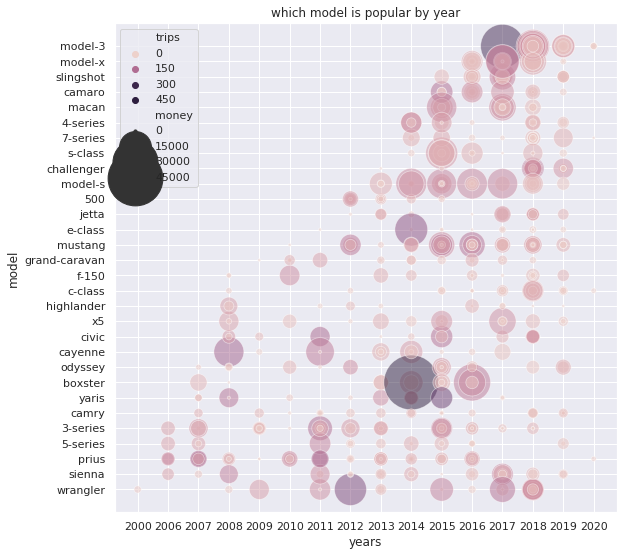

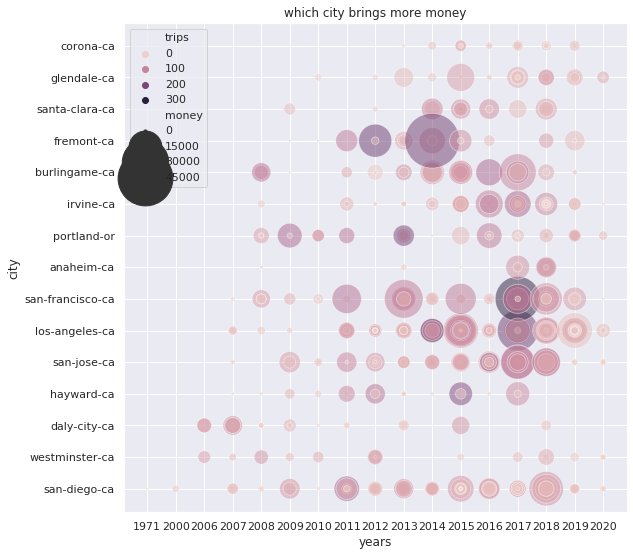

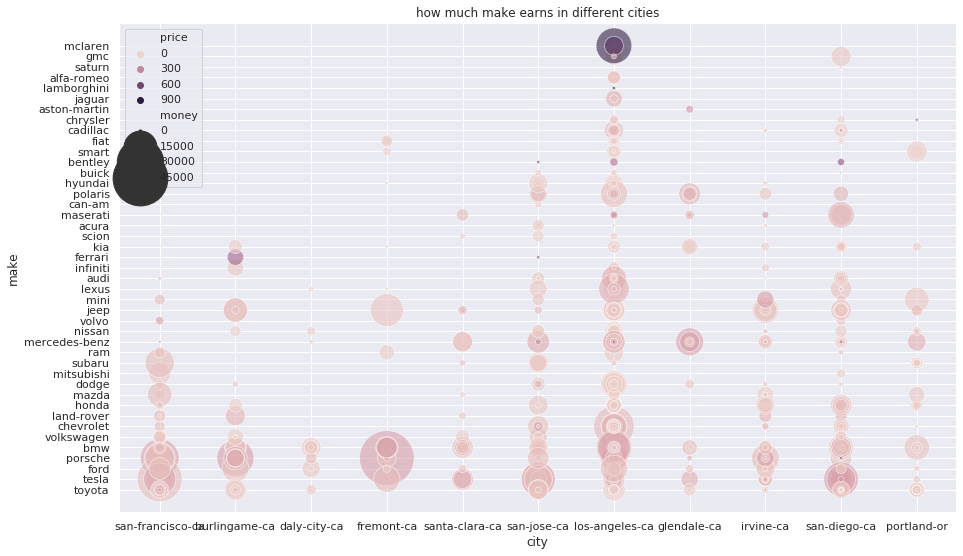

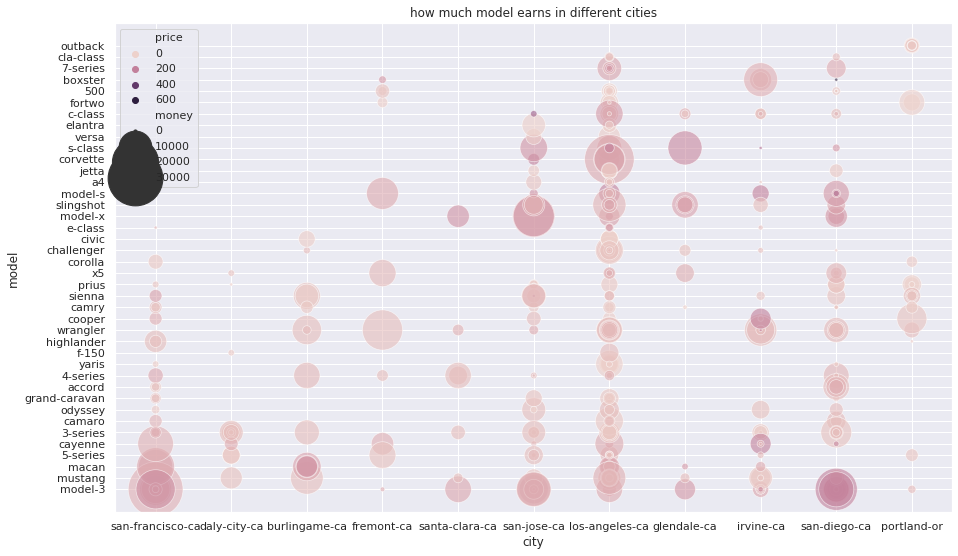

In [13]:
dd=data.loc[ data['model'].isin(top_models.head(30).model) ][['model','money','trips','year']]
dd['years']=dd['year'].astype(str)
do_scatter(inp_data=dd.sort_values('year'), ttl='which model is popular by year', fsz=(9,9), ssz=(10, 3000), ix='years', iy='model', iss='money', ih='trips', alph=0.5)

dd=data.loc[ data['city'].isin(top_cities.head(30).city) ][['city','money','trips','year']]
dd['years']=dd['year'].astype(str)
do_scatter(inp_data=dd.sort_values('year'), ttl='which city brings more money', fsz=(9,9), ssz=(10, 3000), ix='years', iy='city', iss='money', ih='trips', alph=0.5)

dd=data.loc[ data['city'].isin(top_cities.head(11).city) ][['city','make','price','money']]
do_scatter(inp_data=dd, ttl='how much make earns in different cities', fsz=(15,9), ssz=(10, 3000), ix='city', iy='make', iss='money', ih='price', alph=0.6)

dd=data.loc[ (data['city'].isin(top_cities.head(11).city)) & (data['model'].isin(top_models.head(40).model)) ][['city','model','price','money']]
do_scatter(inp_data=dd, ttl='how much model earns in different cities', fsz=(15,9), ssz=(10, 3000), ix='city', iy='model', iss='money', ih='price', alph=0.6)

In [2]:
t2.sort_values('trips', ascending = False).head(15)

,allStrs,bsns,year,make,stars,trips,price,vtype,city,model,money
45,1,0,2014,porsche,5,319,139,car-rental,emeryville-ca,boxster,44341
8,1,1,2017,tesla,5,287,98,car-rental,san-francisco-ca,model-3,28126
480,1,0,2015,toyota,5,240,29,car-rental,los-angeles-ca,yaris,6960
487,1,0,2014,jeep,5,227,35,suv-rental,los-angeles-ca,cherokee,7945
375,1,0,2012,jeep,5,219,69,suv-rental,fremont-ca,wrangler,15111
537,1,0,2017,dodge,5,219,45,suv-rental,los-angeles-ca,durango,9855
574,1,0,2017,chevrolet,5,211,109,car-rental,los-angeles-ca,corvette,22999
374,1,0,2014,porsche,5,210,199,car-rental,fremont-ca,911,41790
1145,1,0,2013,smart,5,203,30,car-rental,portland-or,fortwo,6090
1226,1,0,2014,mercedes-benz,5,200,79,car-rental,seattle-wa,e-class,15800


In [3]:
t2[['trips']].sum()

trips    42955
dtype: int64

In [4]:
t2[['trips']].mean()

trips    29.954672
dtype: float64

In [5]:
df_m = t2.groupby(['year'])['trips'].mean()

df_m2 = t2.groupby(['year'])['price'].mean()
df_m3 = t2.groupby(['year'])['price'].count()
df_m4 = t2.groupby(['year'])['money'].sum()
df_m3=df_m3.to_frame()

df_m = df_m.rename('avg_trips')
df_m2 = df_m2.rename('avg_price')
df_m3 = df_m3.rename(columns={'price':'vehicles_count'})
df_m4 = df_m4.rename('ttl_money')
df_m5 = df_m*df_m2
df_m5 = df_m5.rename('avg_income_per_car')
ax = pd.concat([df_m, df_m2, df_m3, df_m4, df_m5], axis=1)
#ax
t2.head()

,allStrs,bsns,year,make,stars,trips,price,vtype,city,model,money
0,1,1,2018,tesla,5,64,169,suv-rental,pacifica-ca,model-x,10816
1,1,1,2017,toyota,5,42,55,car-rental,san-francisco-ca,prius-prime,2310
2,1,1,2018,tesla,5,87,109,car-rental,san-francisco-ca,model-3,9483
3,1,1,2018,ford,5,39,80,car-rental,san-francisco-ca,mustang,3120
4,1,1,2019,tesla,5,70,108,car-rental,san-francisco-ca,model-3,7560


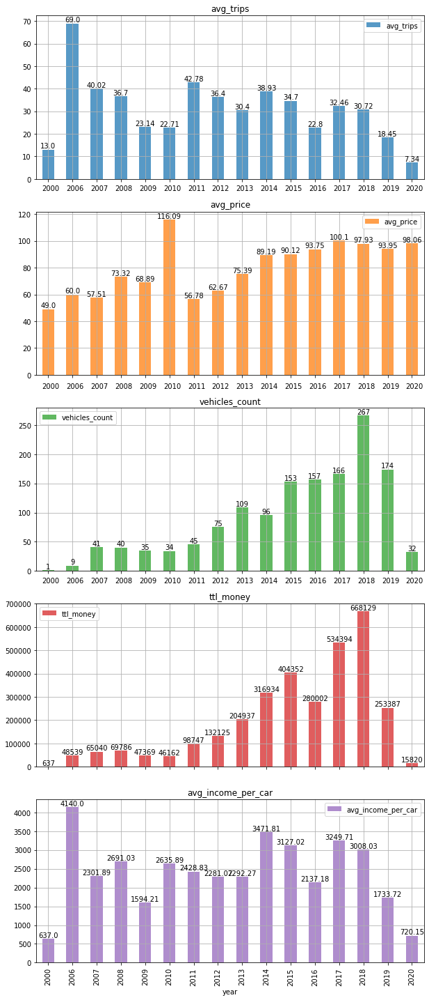

In [6]:
ax = pd.concat([df_m, df_m2, df_m3, df_m4, df_m5], axis=1)

fig_y = ax.plot.bar( figsize=(10,25),rot=90, subplots=True, alpha=0.75, grid=True)
#for a in fig_y:
#    for k in a.get_xticklabels():
#        k.set_visible(True)
#plt.xlabel("")
#plt.show()

ax=ax.reset_index()
#print(type(ax))
#print(ax)
labels=ax['year']
#print(labels)

def putd(i, df, figure, loc_labels):
    rects = figure[i].patches
    for rect, label in zip(rects, loc_labels):
        #print(rect.get_height(), rect.get_x(), label)
        fig_y[i].text(rect.get_x()+rect.get_width()/2, rect.get_height(), round(rect.get_height(),2), ha='center', va='bottom')
        if i<3:
            if i==0:k=0
            if i==1:k=-5
            if i==2:k=-15
            if i==3:k=25
            #if i==4:k=-15
            fig_y[i].text(rect.get_x(), -5+k, label)


#print('len ax',len(ax))

for i in range(0, 5):
    #print(i)
    putd(i, ax, fig_y, labels)
        # Make some labels.
#labels = ["label%d" % i for i in range(len(rects))]
#for rect, label in zip(rects, labels):
#    height = rect.get_height()
#    fig_y[0].text(rect.get_x() + rect.get_width() / 2, height + 5, label,
#            ha='center', va='bottom')
#    print(label)

In [7]:
df_g = t2.groupby(['make'])['trips'].mean()
df_g2 = t2.groupby(['make'])['price'].mean()
#df_g.head()

df_g3 = t2.groupby(['make'])['price'].count()
df_g4 = t2.groupby(['make'])['money'].sum()

df_g3=df_g3.to_frame()
df_g3=df_g3.rename(columns={'price':'cnt'})

ax2 = pd.concat([df_g, df_g2, df_g3, df_g4], axis=1)
ax2['avg_income']=ax2['trips']*ax2['price']
ax2['trips_return']=ax2['price']/ax2['trips']
ax2['competitivness']=ax2['trips']/ax2['cnt']
ax2=ax2.reset_index()
ax2.head(15)

,make,trips,price,cnt,money,avg_income,trips_return,competitivness
0,acura,21.100000,68.100000,10,10380,1436.910000,3.227488,2.110000
1,alfa-romeo,20.600000,91.400000,5,8739,1882.840000,4.436893,4.120000
2,aston-martin,3.000000,230.000000,1,690,690.000000,76.666667,3.000000
3,audi,22.794118,84.852941,34,64085,1934.147924,3.722581,0.670415
4,bentley,2.750000,463.000000,4,3787,1273.250000,168.363636,0.687500
5,bmw,24.871345,97.081871,171,362706,2414.556718,3.903362,0.145446
6,buick,6.250000,40.500000,4,983,253.125000,6.480000,1.562500
7,cadillac,15.722222,102.166667,18,25401,1606.287037,6.498233,0.873457
8,can-am,5.500000,72.000000,2,539,396.000000,13.090909,2.750000
9,chevrolet,31.569231,76.338462,65,155882,2409.946509,2.418129,0.485680


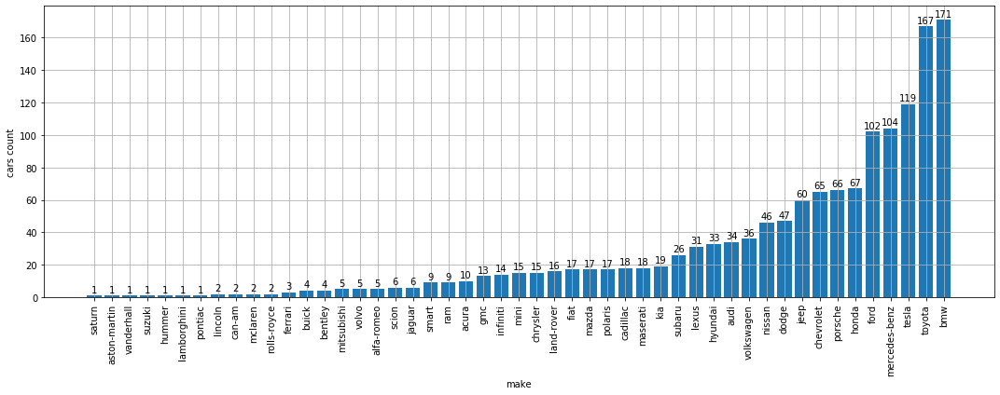

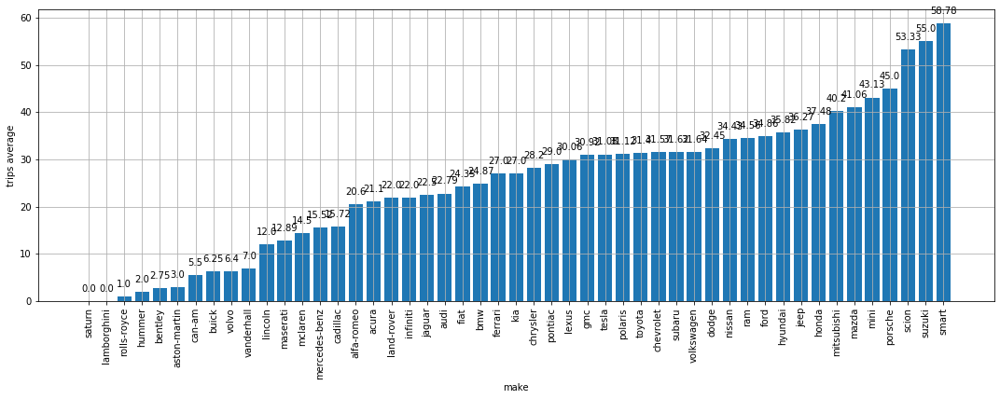

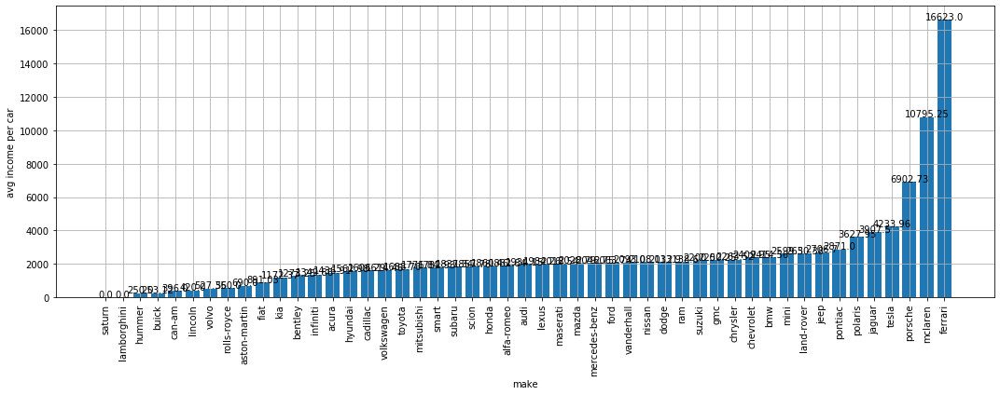

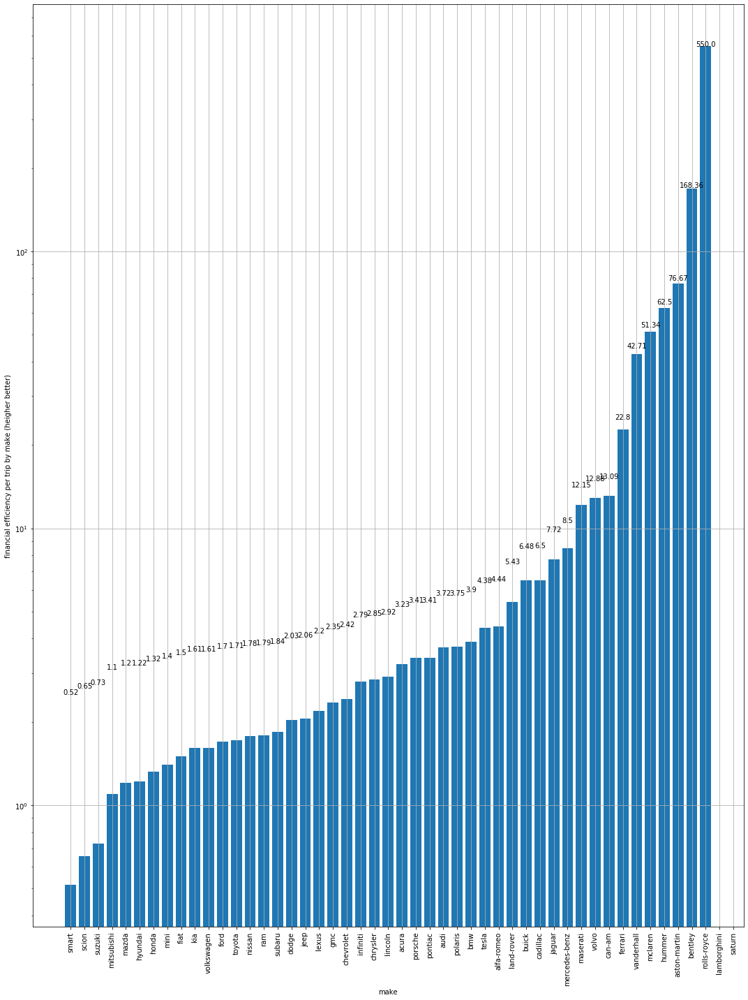

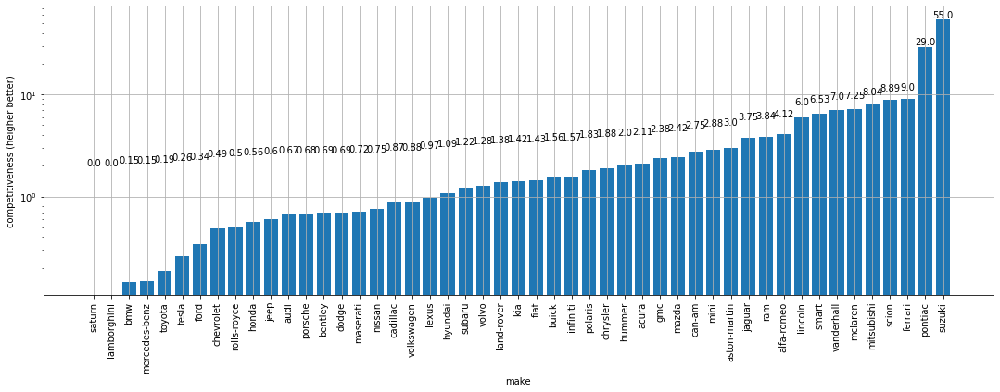

In [14]:
def drw(x, y, lbl, yy=6):
    plt.figure(figsize=(15, yy))

    line = plt.bar(x,y)
    plt.xlabel('make')
    plt.ylabel(lbl)
    plt.xticks(rotation=90)
    plt.grid()
    plt.tight_layout()
    #plt.colormap('Paired')

    for i in range(len(y)): 
        plt.annotate(str(round(y[i],2)), xy=( x[i] , y[i]+2), ha='center') 
    #if ylim:
    #    plt.ylim(0, ylim)
    if lbl in ['financial efficiency per trip by make (heigher better)','competitiveness (heigher better)']:
        plt.yscale("log")
    plt.show()

ax2 = ax2.sort_values(by=['cnt'])
x = ax2['make']
y = ax2['cnt']
drw(x,y, 'cars count')

ax2 = ax2.sort_values(by=['trips'])
x = ax2['make']
y = ax2['trips']
drw(x,y, 'trips average')

ax2 = ax2.sort_values(by=['avg_income'])
x = ax2['make']
y = ax2['avg_income']
drw(x,y, 'avg income per car')
  
ax2 = ax2.sort_values(by=['trips_return'])
x = ax2['make']
y = ax2['trips_return']
drw(x,y, 'financial efficiency per trip by make (heigher better)', yy=20)


ax2 = ax2.sort_values(by=['competitivness'])
x = ax2['make']
y = ax2['competitivness']
drw(x,y, 'competitiveness (heigher better)')

<class 'pandas.core.frame.DataFrame'> (30, 2)


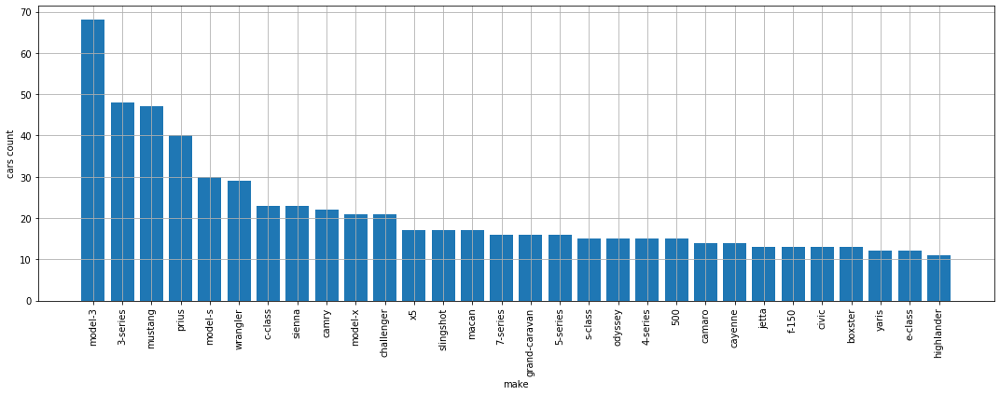

In [41]:
aaa=t2.groupby(['model']).count()
aaa = aaa.reset_index()
aaa=aaa.rename(columns={'price':'cnt'})
aaa = aaa[['model','cnt']]
aaa=aaa.sort_values('cnt', ascending=False).head(30)
print(type(aaa), aaa.shape)
x = aaa['model']
y = aaa['cnt']
#drw(x, y, 'cars count')
plt.figure(figsize=(15, 6))

line = plt.bar(x,y)
plt.xlabel('make')
plt.ylabel('cars count')
plt.xticks(rotation=90)
plt.grid()
plt.tight_layout()

Text(0.5, 1, 'total amount of money acumulated brand per year')

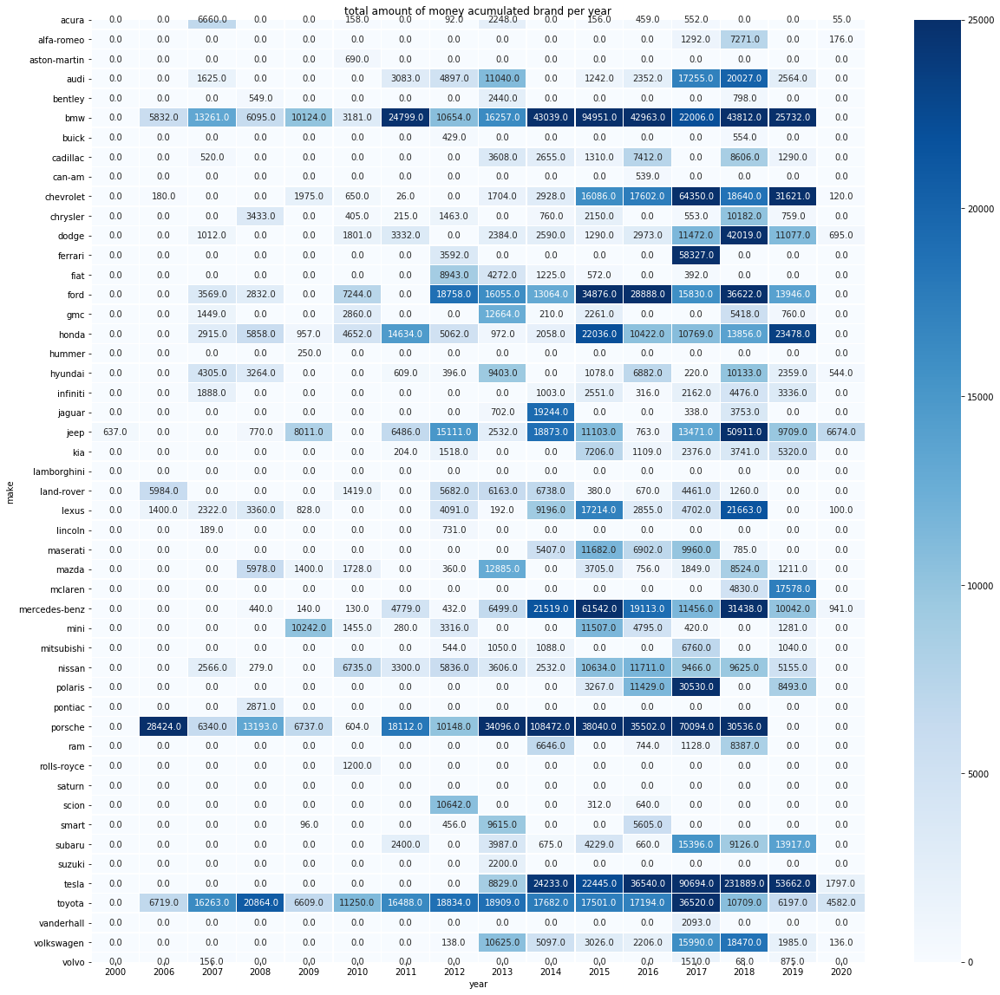

In [11]:
money_acumulated_per_brand = t2.pivot_table(
                        index='make', 
                        columns='year', 
                        values='money', 
                        aggfunc=sum).fillna(0).applymap(float)
plt.figure(figsize = (20,20))
sns.heatmap(money_acumulated_per_brand, annot=True, fmt=".1f", linewidths=.5, vmin=0, vmax=25000, cmap="Blues")
plt.title('total amount of money acumulated brand per year')

Text(0.5, 1, 'total trips by make per year')

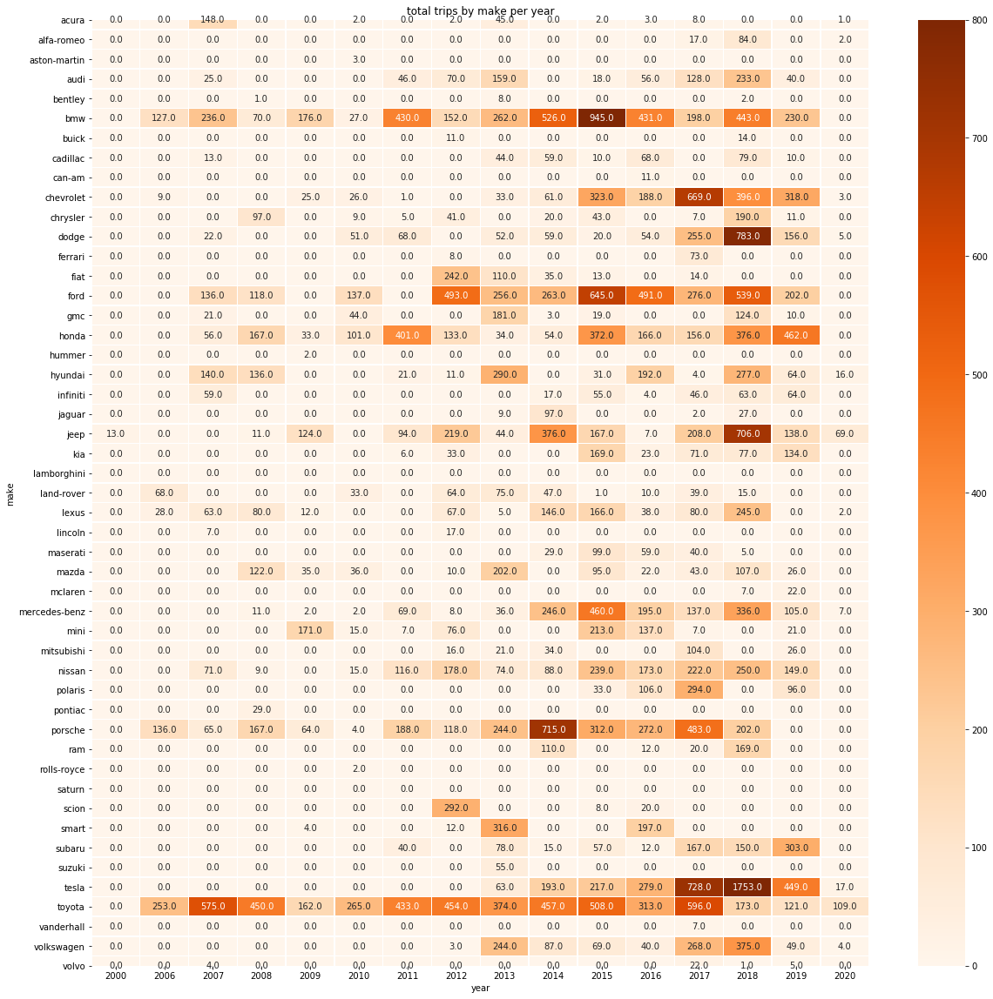

In [12]:
total_trips_by_make = t2.pivot_table(
                        index='make', 
                        columns='year', 
                        values='trips', 
                        aggfunc=sum).fillna(0).applymap(float)
plt.figure(figsize = (20,20))
sns.heatmap(total_trips_by_make, annot=True, fmt=".1f", linewidths=.5, vmin=0, vmax=800, 
            cmap="Oranges")
plt.title('total trips by make per year')

Text(0.5, 1, 'cars by brand count by year')

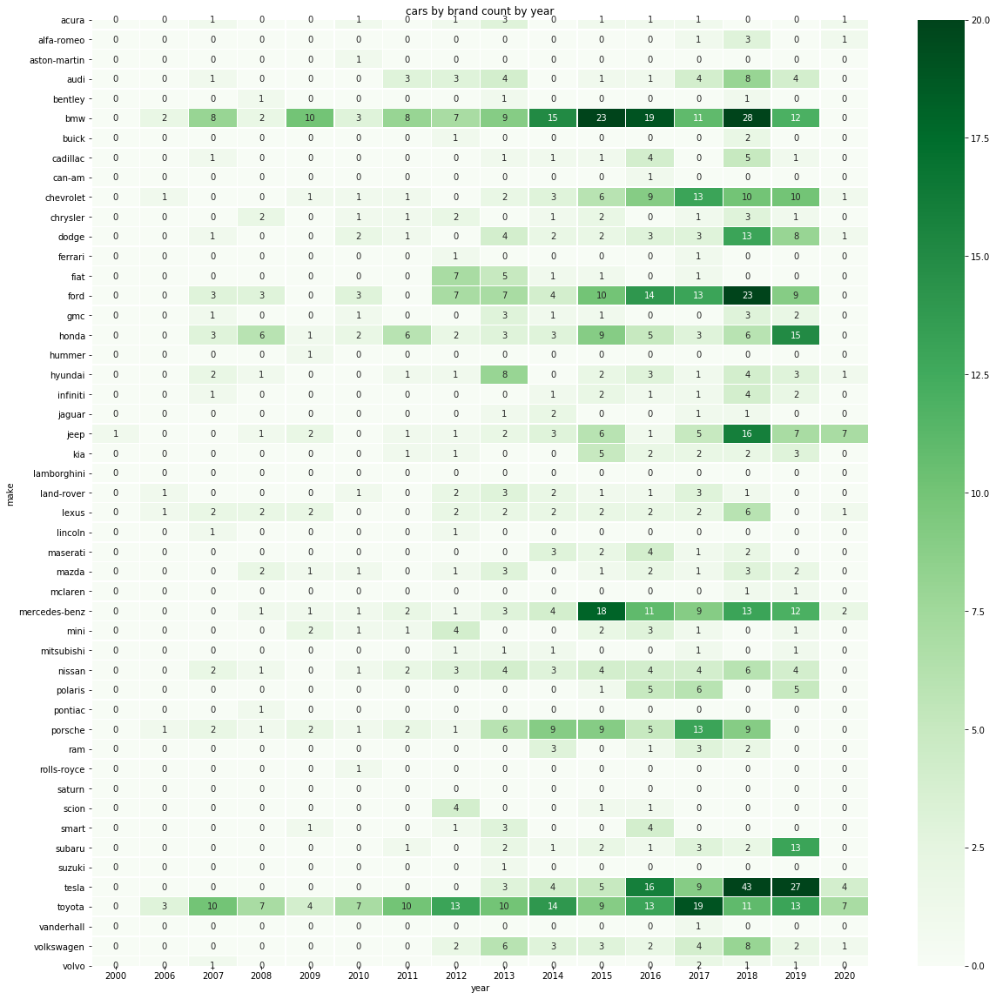

In [13]:
cars_by_brand = t2.pivot_table(
                        index='make', 
                        columns='year', 
                        values='money', 
                        aggfunc=np.count_nonzero).fillna(0).applymap(float)
plt.figure(figsize = (20,20))
sns.heatmap(cars_by_brand, cmap="Greens", annot=True, linewidths=.5, vmax=20)
plt.title('cars by brand count by year')

Text(0.5, 1, 'average rental price by brand')

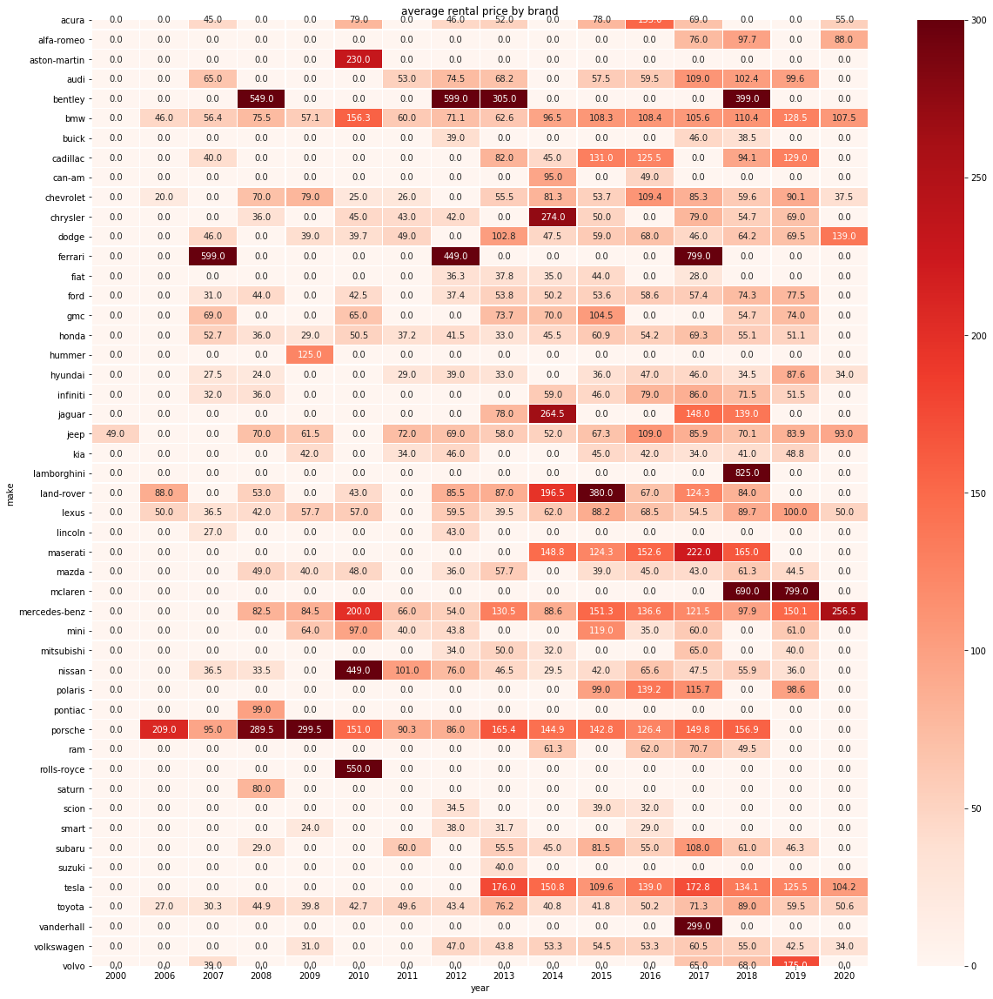

In [14]:
average_price_per_brand = t2.pivot_table(
                        index='make', 
                        columns='year', 
                        values='price', 
                        aggfunc=np.mean).fillna(0).applymap(float)
plt.figure(figsize = (20,20))
sns.heatmap(average_price_per_brand, cmap="Reds", annot=True, fmt=".1f", linewidths=.5, vmax=300)
plt.title('average rental price by brand')

Text(0.5, 1, 'average yearly income per make')

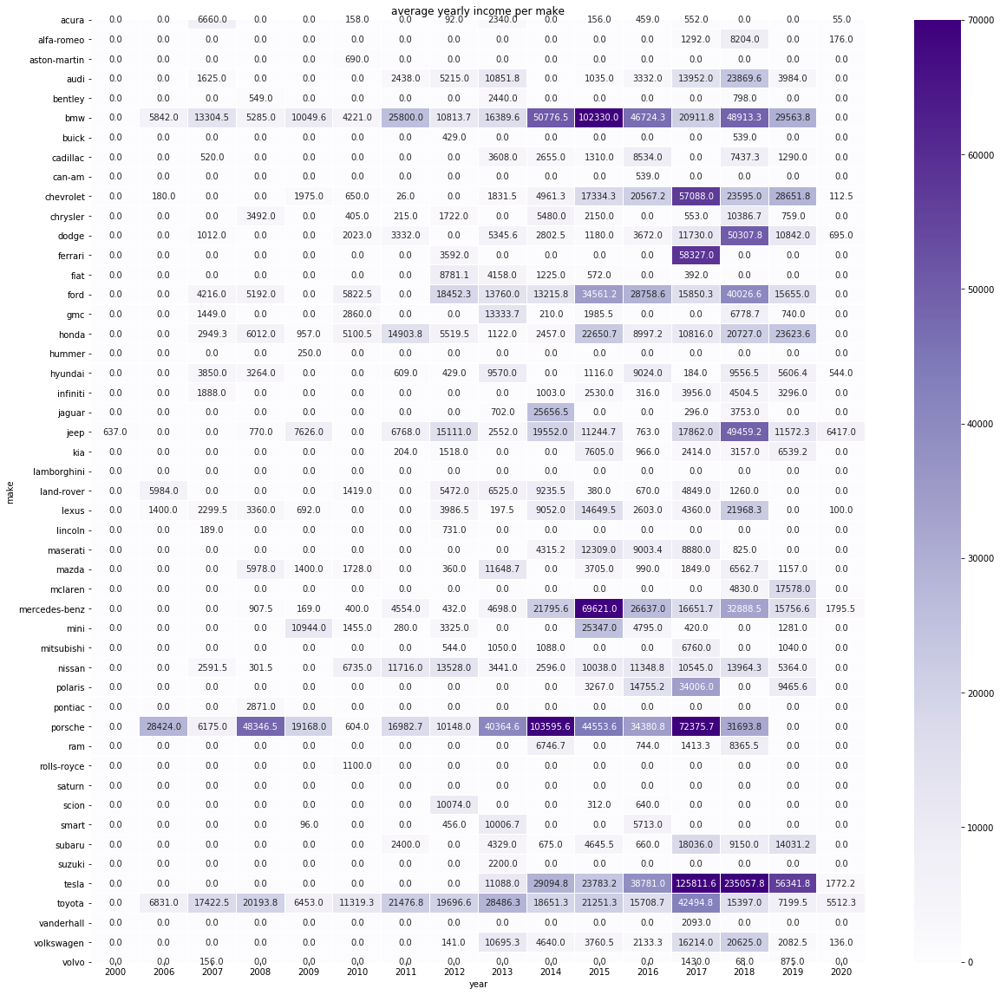

In [15]:
average_income_per_brand=average_price_per_brand * total_trips_by_make

plt.figure(figsize = (20,20))
sns.heatmap(average_income_per_brand, cmap="Purples", annot=True, fmt=".1f", 
            linewidths=.1, vmax=70000)
plt.title('average yearly income per make')


Text(0.5, 1, 'mainstream prices heatmap')

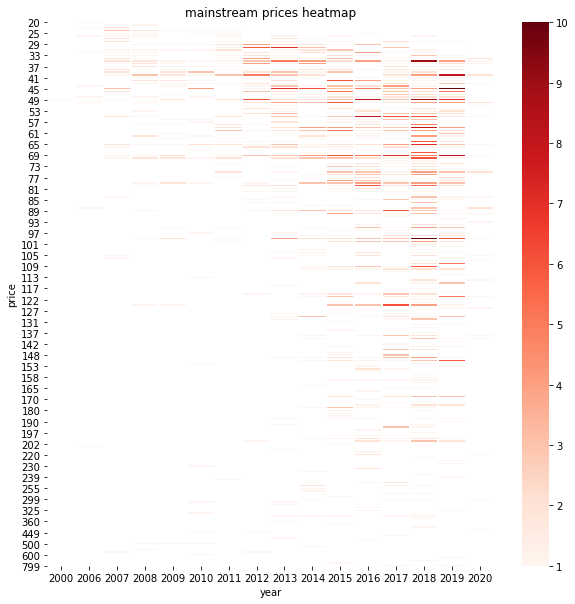

In [16]:
t3_pivot_avgp = t2.pivot_table(
                        index='price', 
                        columns='year', 
                        values='make', 
                        aggfunc=np.count_nonzero)
plt.figure(figsize = (10,10))
sns.heatmap(t3_pivot_avgp, cmap="Reds", linewidths=.5, vmax=10)
plt.title('mainstream prices heatmap')

In [17]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 10)

In [18]:
print(t2.shape)
data = t2.copy()
categorical_columns = [c for c in data.columns if data[c].dtype.name == 'object']
numerical_columns   = [c for c in data.columns if data[c].dtype.name != 'object']
print(categorical_columns)
print(numerical_columns)
print(data.shape)
data.head()

(1434, 11)
['make', 'vtype', 'city', 'model']
['allStrs', 'bsns', 'year', 'stars', 'trips', 'price', 'money']
(1434, 11)


,allStrs,bsns,year,make,stars,...,price,vtype,city,model,money
0,1,1,2018,tesla,5,...,169,suv-rental,pacifica-ca,model-x,10816
1,1,1,2017,toyota,5,...,55,car-rental,san-francisco-ca,prius-prime,2310
2,1,1,2018,tesla,5,...,109,car-rental,san-francisco-ca,model-3,9483
3,1,1,2018,ford,5,...,80,car-rental,san-francisco-ca,mustang,3120
4,1,1,2019,tesla,5,...,108,car-rental,san-francisco-ca,model-3,7560


In [19]:
data[categorical_columns].describe()

,make,vtype,city,model
count,1434,1434,1434,1434
unique,49,5,207,335
top,bmw,car-rental,los-angeles-ca,model-3
freq,171,963,267,68


['tesla' 'toyota' 'ford' 'porsche' 'bmw' 'maserati' 'volkswagen'
 'chevrolet' 'land-rover' 'jaguar' 'honda' 'mazda' 'dodge' 'mitsubishi'
 'subaru' 'audi' 'ram' 'mercedes-benz' 'nissan' 'volvo' 'mini' 'lexus'
 'jeep' 'chrysler' 'fiat' 'infiniti' 'ferrari' 'gmc' 'kia' 'can-am'
 'acura' 'polaris' 'scion' 'hyundai' 'buick' 'bentley' 'alfa-romeo'
 'lincoln' 'smart' 'cadillac' 'aston-martin' 'lamborghini' 'suzuki'
 'rolls-royce' 'hummer' 'saturn' 'pontiac' 'mclaren' 'vanderhall']
['suv-rental' 'car-rental' 'truck-rental' 'minivan-rental' 'van-rental']
['pacifica-ca' 'san-francisco-ca' 'south-san-francisco-ca' 'burlingame-ca'
 'daly-city-ca' 'oakland-ca' 'alameda-ca' 'emeryville-ca' 'berkeley-ca'
 'hayward-ca' 'redwood-city-ca' 'san-mateo-ca' 'millbrae-ca' 'richmond-ca'
 'el-cerrito-ca' 'castro-valley-ca' 'san-leandro-ca' 'sausalito-ca'
 'hillsborough-ca' 'pleasanton-ca' 'novato-ca' 'danville-ca'
 'foster-city-ca' 'dublin-ca' 'menlo-park-ca' 'union-city-ca' 'newark-ca'
 'colma-ca' 'fremont-ca

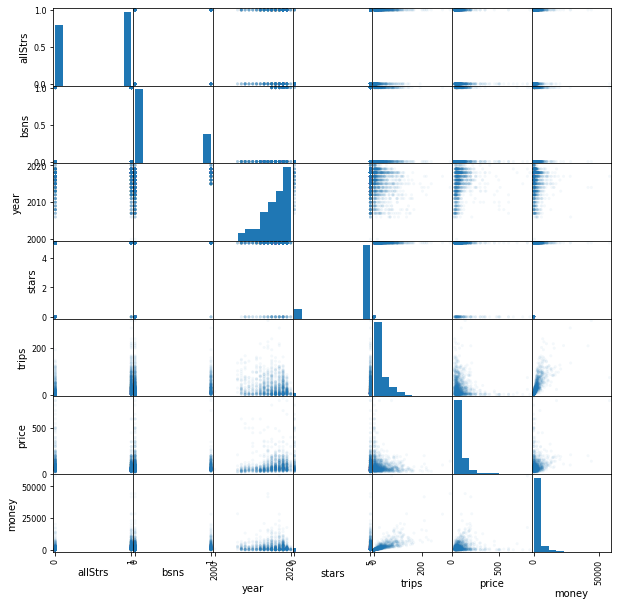

In [20]:
for c in categorical_columns:
    print(data[c].unique())
    
from pandas.plotting import scatter_matrix
scatter_matrix(data, alpha=0.05, figsize=(10, 10));

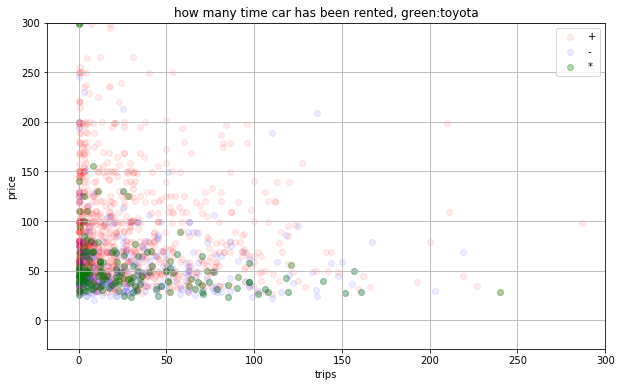

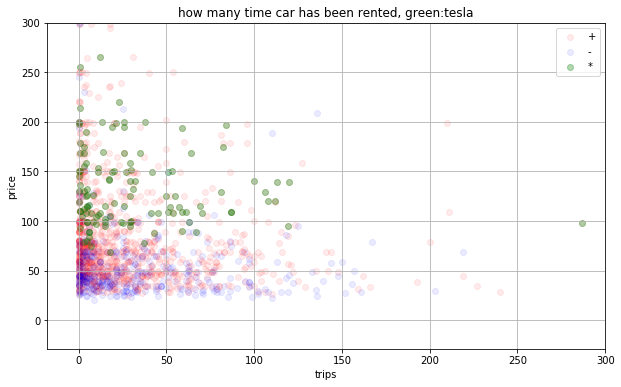

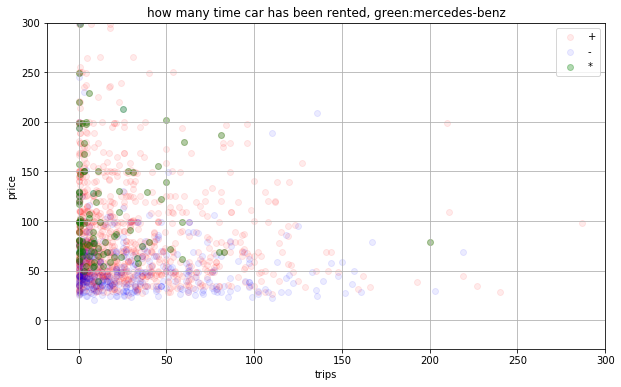

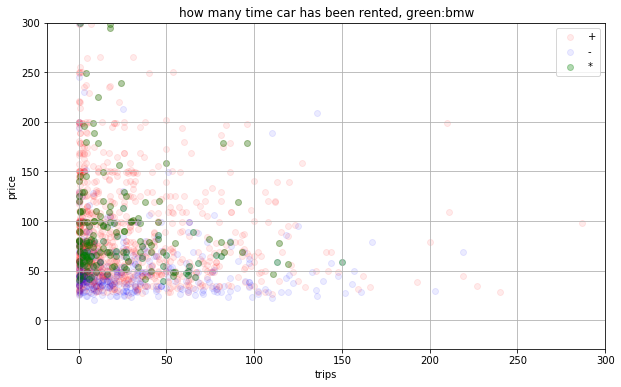

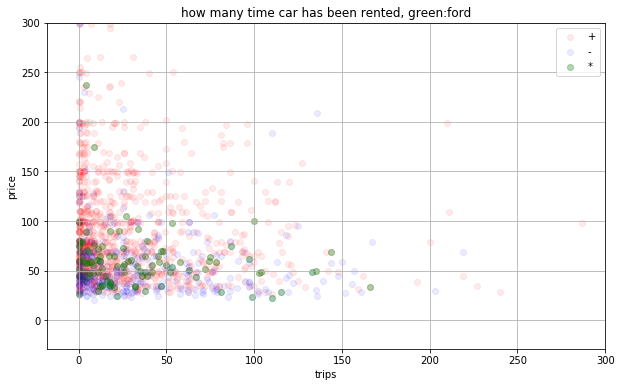

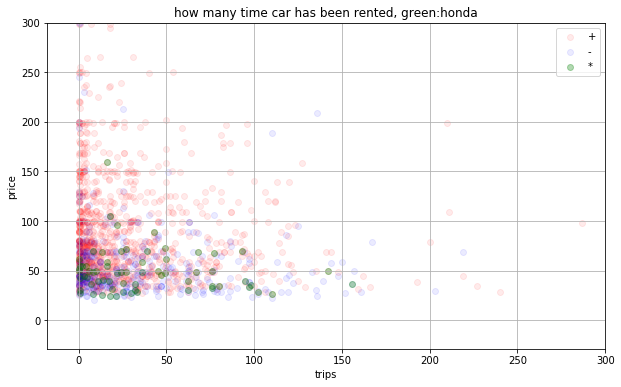

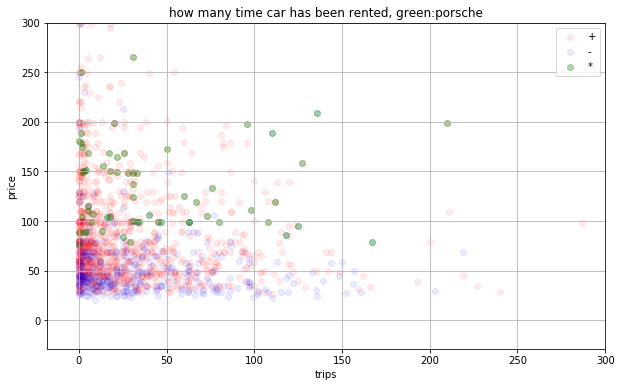

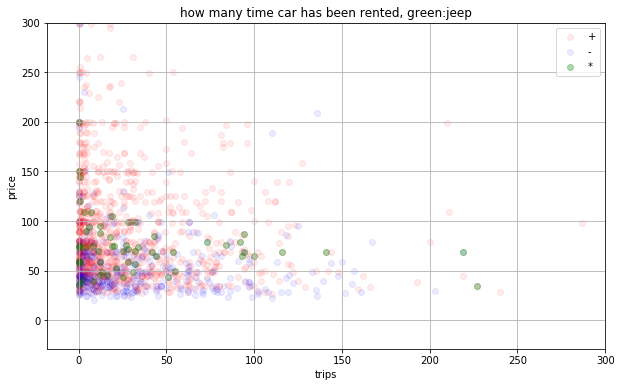

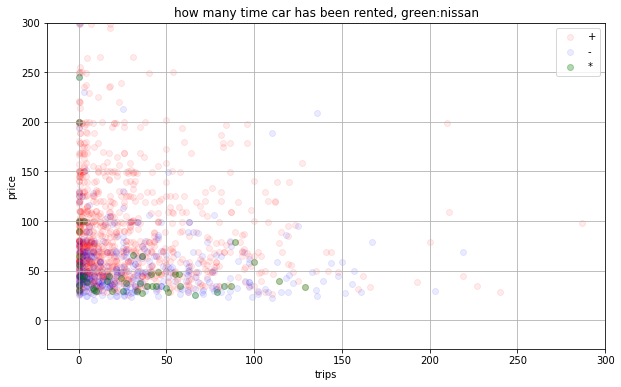

In [21]:
def segmented_chart(data,input_x, input_y, input_xmax, input_ymax, input_make):
    col1 = input_x
    col2 = input_y
    selection_col = 'year'
    threshold = 2013

    plt.figure(figsize=(10, 6))

    plt.scatter(data[col1][data[selection_col] >threshold],
                data[col2][data[selection_col] >threshold],
                alpha=0.08,
                color='red',
                label='+')

    plt.scatter(data[col1][data[selection_col] <=threshold],
                data[col2][data[selection_col] <=threshold],
                alpha=0.08,
                color='blue',
                label='-')

    plt.scatter(data[col1][data['make'] ==input_make],
                data[col2][data['make'] ==input_make],
                alpha=0.30,
                color='green',
                label='*')

    
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.legend(loc='best');
    plt.grid()
    plt.title('how many time car has been rented, green:'+input_make)
    plt.ylim(ymax=input_ymax)
    plt.xlim(xmax=input_ymax)
    
segmented_chart(data,'trips','price',175,300,'toyota')
segmented_chart(data,'trips','price',175,300,'tesla')
segmented_chart(data,'trips','price',175,300,'mercedes-benz')
segmented_chart(data,'trips','price',175,300,'bmw')
segmented_chart(data,'trips','price',175,300,'ford')
segmented_chart(data,'trips','price',175,300,'honda')
segmented_chart(data,'trips','price',175,300,'porsche')
segmented_chart(data,'trips','price',175,300,'jeep')
segmented_chart(data,'trips','price',175,300,'nissan')

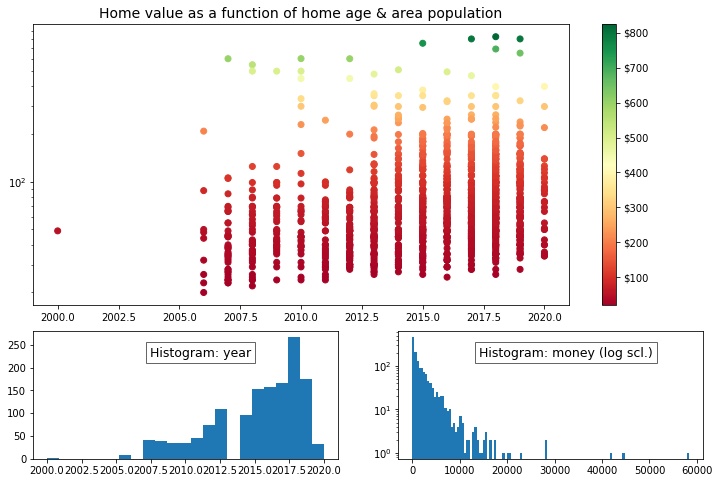

In [22]:
def add_titlebox(ax, text):
    ax.text(.55, .8, text,
    horizontalalignment='center',
    transform=ax.transAxes,
    bbox=dict(facecolor='white', alpha=0.6), fontsize=12.5)
    return ax
gridsize = (3, 2)
fig = plt.figure(figsize=(12, 8))
ax1 = plt.subplot2grid(gridsize, (0, 0), colspan=2, rowspan=2)
ax2 = plt.subplot2grid(gridsize, (2, 0))
ax3 = plt.subplot2grid(gridsize, (2, 1))
ax1.set_title('Home value as a function of home age & area population', fontsize=14)
sctr = ax1.scatter(x=data['year'], y=data['price'], c=data['price'], cmap='RdYlGn')
plt.colorbar(sctr, ax=ax1, format='$%d')
ax1.set_yscale('log')
ax2.hist(data['year'], bins='auto')
ax3.hist(data['money'], bins='auto', log=True)

add_titlebox(ax2, 'Histogram: year')
add_titlebox(ax3, 'Histogram: money (log scl.)')

In [39]:
data = t2.copy()
data[numerical_columns]=data[numerical_columns].astype(float)

# making boolean series for a team name 
filter1 = data["make"]=="bmw"
  
# making boolean series for age 
filter2 = data["make"]=="tesla"

top_makes=list(data.groupby(['make']).count().reset_index().sort_values(by='bsns', ascending=False).head(10)['make'])
print(top_makes)

top_models=data.loc[data['make'].isin(top_makes)].groupby(['model']).count().reset_index().sort_values(by='bsns', ascending=False)[['model','bsns']]
top_models=top_models.where(top_models['bsns']>6).dropna()
print(top_models)

data=data.loc[data['make'].isin(top_makes)].drop(['city','vtype'], axis=1)

categorical_columns = [c for c in data.columns if data[c].dtype.name == 'object']
data_describe = data.describe(include=[object])
nonbinary_columns = [c for c in categorical_columns if data_describe[c]['unique'] > 2]

#data=data.loc[(data['make'].isin(top_makes[:3])) & (data['model'].isin(top_models[:20]['model']))]
data

['bmw', 'toyota', 'tesla', 'mercedes-benz', 'ford', 'honda', 'porsche', 'chevrolet', 'jeep', 'dodge']
                  model  bsns
103             model-3  68.0
2              3-series  48.0
106             mustang  47.0
111               prius  40.0
104             model-s  30.0
140            wrangler  29.0
122              sienna  23.0
24              c-class  23.0
30                camry  22.0
105             model-x  21.0
34           challenger  21.0
98                macan  17.0
146                  x5  17.0
10             7-series  16.0
6              5-series  16.0
82        grand-caravan  16.0
107             odyssey  15.0
121             s-class  15.0
3              4-series  15.0
32              cayenne  14.0
29               camaro  14.0
38                civic  13.0
23              boxster  13.0
65                f-150  13.0
57              e-class  12.0
149               yaris  12.0
16               accord  11.0
85           highlander  11.0
41            cla-class  10.

,allStrs,bsns,year,make,stars,trips,price,model,money
0,1.0,1.0,2018.0,tesla,5.0,64.0,169.0,model-x,10816.0
1,1.0,1.0,2017.0,toyota,5.0,42.0,55.0,prius-prime,2310.0
2,1.0,1.0,2018.0,tesla,5.0,87.0,109.0,model-3,9483.0
3,1.0,1.0,2018.0,ford,5.0,39.0,80.0,mustang,3120.0
4,1.0,1.0,2019.0,tesla,5.0,70.0,108.0,model-3,7560.0
...,...,...,...,...,...,...,...,...,...
1428,1.0,0.0,2017.0,jeep,0.0,0.0,200.0,wrangler,0.0
1434,0.0,0.0,2017.0,toyota,5.0,12.0,59.0,tacoma,708.0
1435,0.0,0.0,2014.0,jeep,5.0,55.0,50.0,cherokee,2750.0
1437,1.0,0.0,2013.0,bmw,5.0,45.0,86.0,x5,3870.0


# nan nan


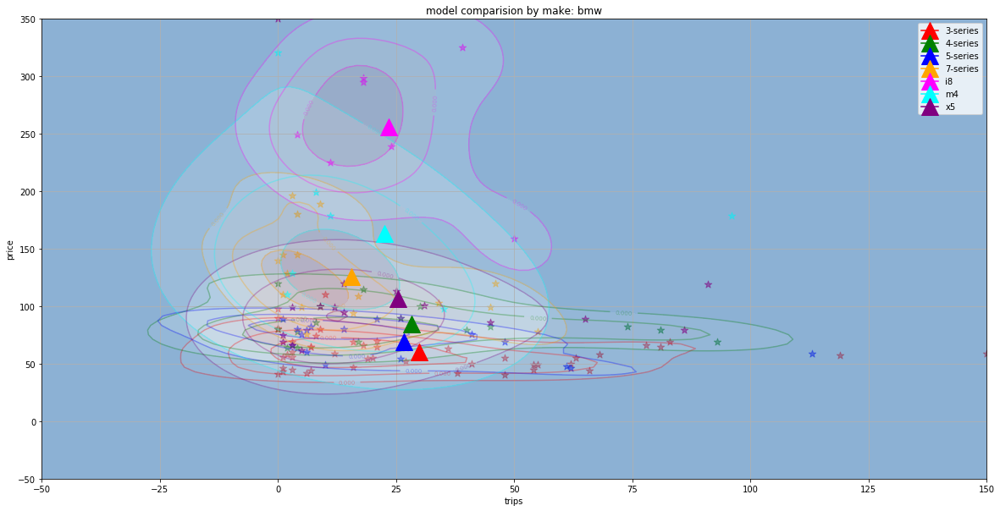

# 150.0 350.0


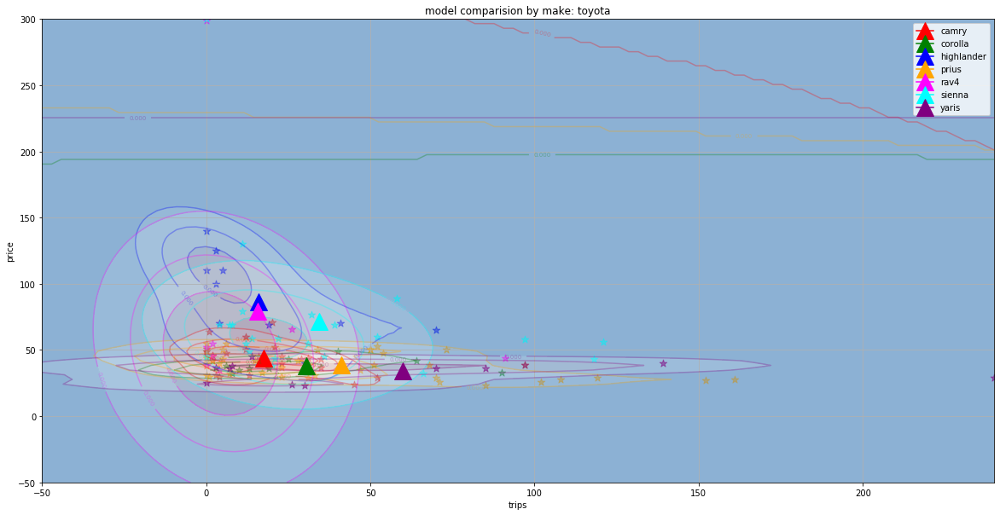

# 240.0 300.0


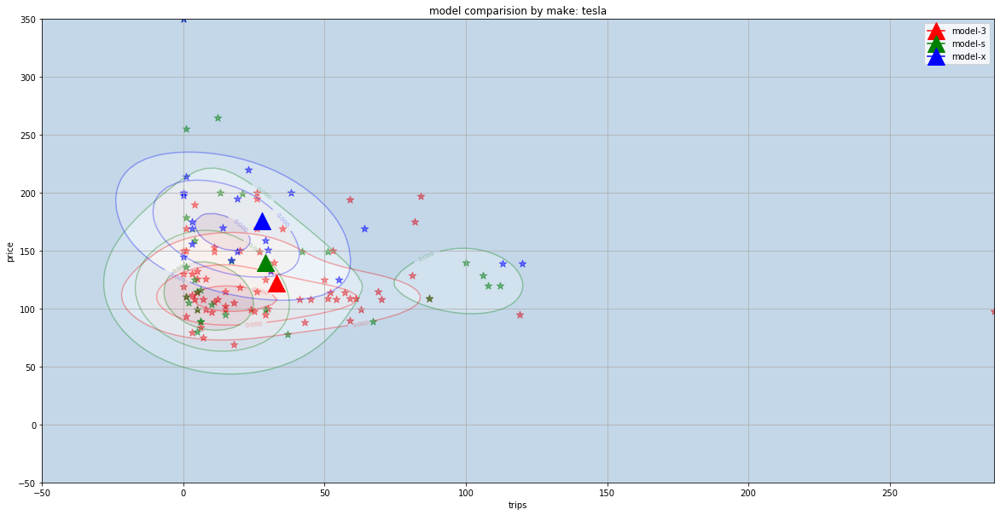

# 287.0 350.0


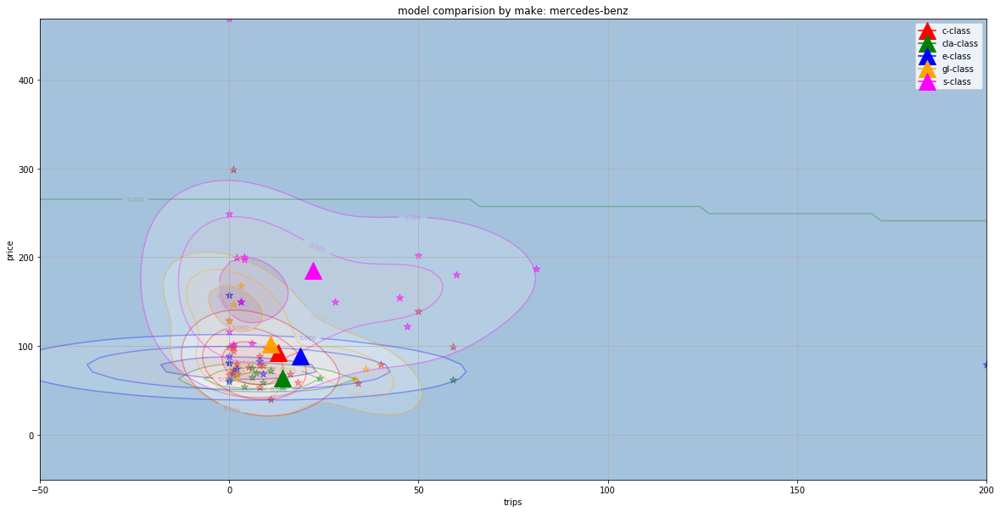

# 200.0 750.0


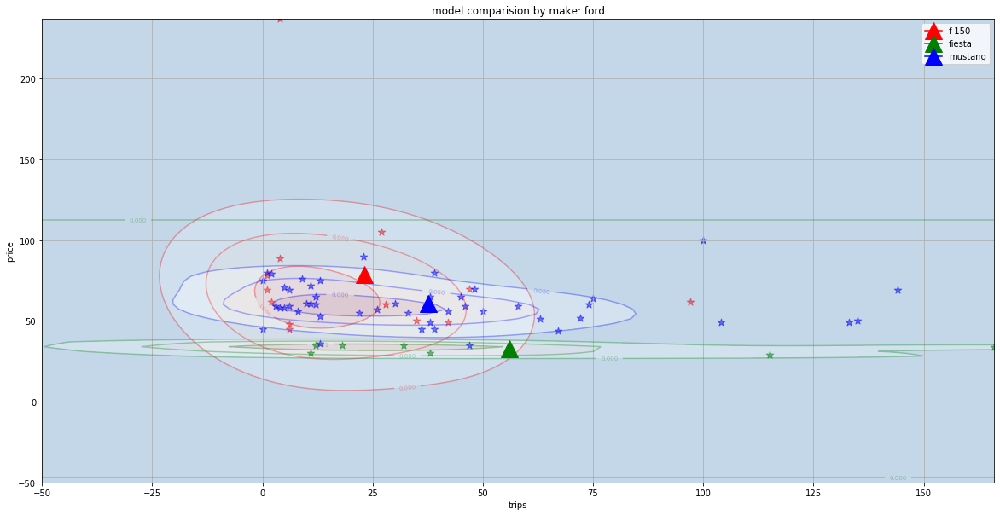

# 166.0 237.0


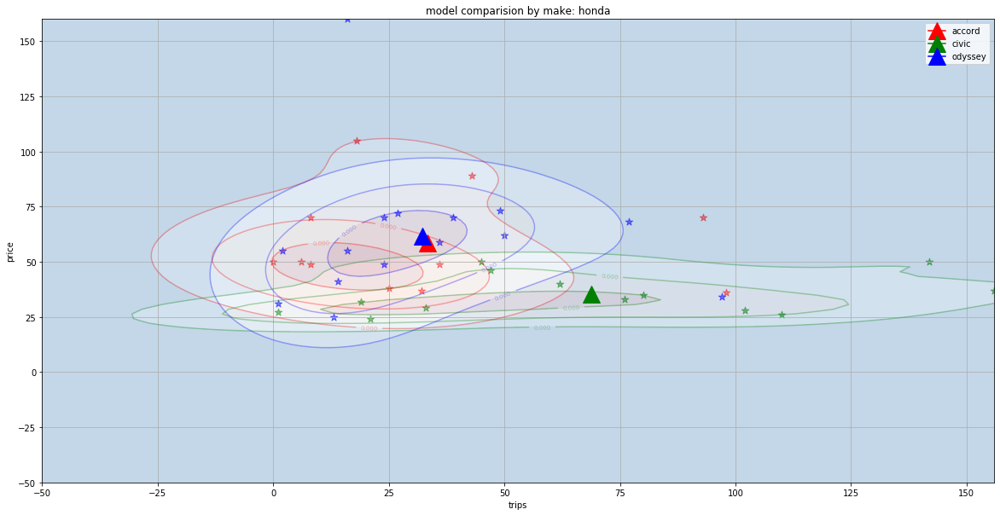

# 156.0 160.0


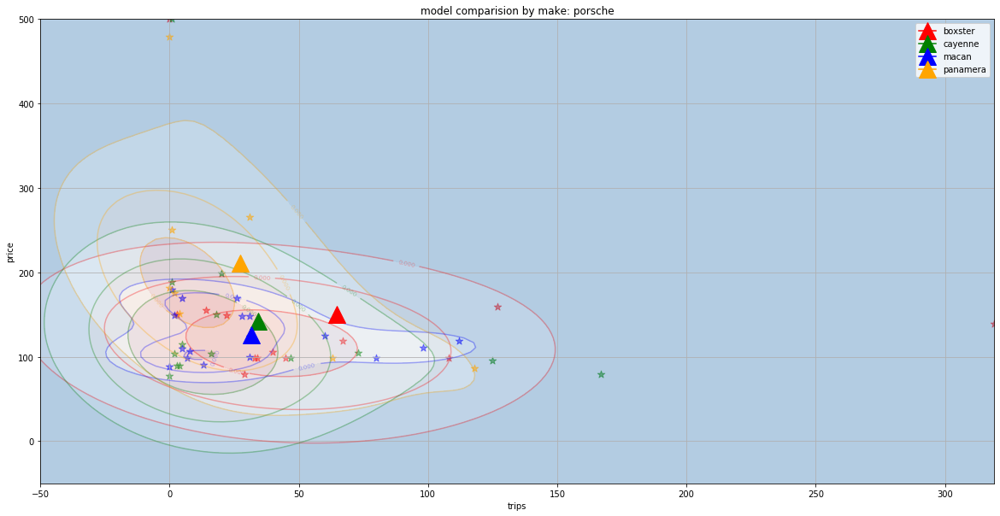

# 319.0 500.0


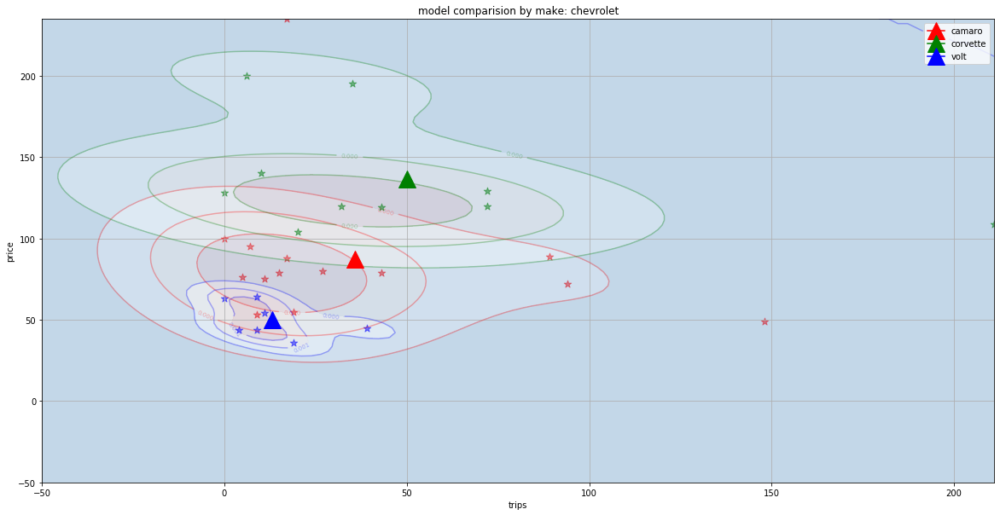

# 211.0 235.0


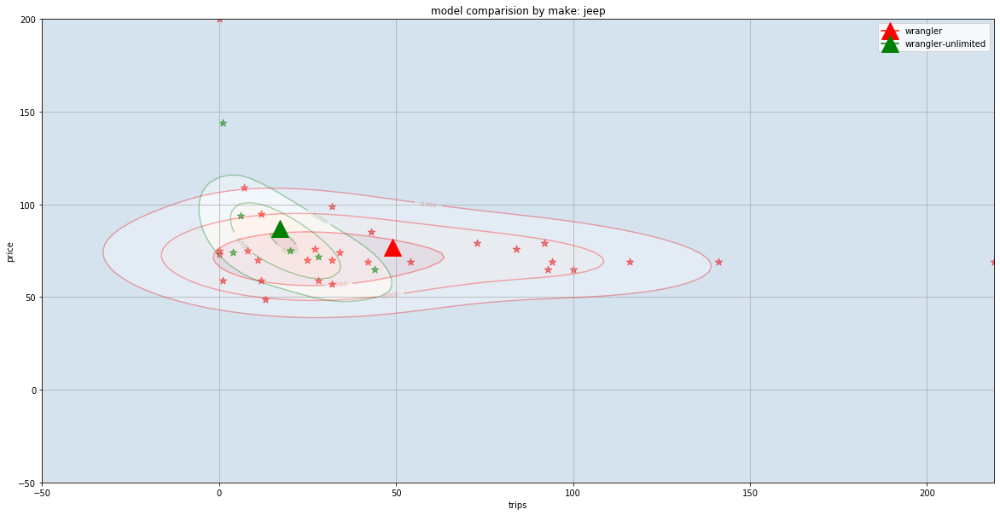

# 227.0 200.0


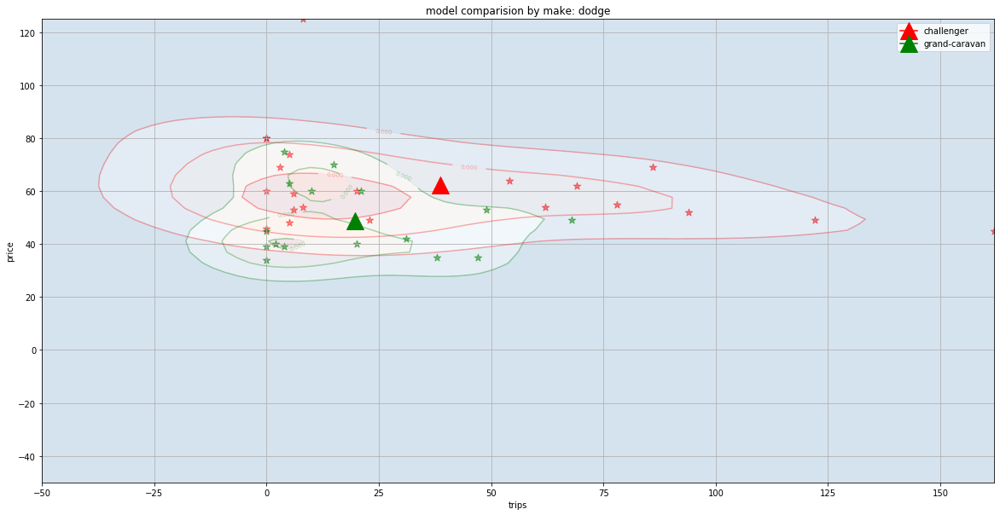

In [40]:
#https://stackoverflow.com/questions/33793701/pyplot-scatter-to-contour-plot
from scipy import stats
def density_estimation(inpx, inpy, xmax, ymax):
    X, Y = np.mgrid[-50:xmax:100j, -50:ymax:100j]                                                     
    positions = np.vstack([X.ravel(), Y.ravel()])                                                       
    values = np.vstack([inpx, inpy])                                                                        
    kernel = stats.gaussian_kde(values)                                                                 
    Z = np.reshape(kernel(positions).T, X.shape)
    return X, Y, Z

c=['red','green','blue','orange','magenta','cyan','purple']

def plot_density(ix, iy, idd, xmax, ymax, label, max_items):
    fig, ax = plt.subplots(figsize=(20, 10))
    z=idd.groupby(['model']).count().reset_index()
    z['cnt'] = z['bsns']
    z=z[['model','cnt']]
    filter2 = z['cnt']>max_items
    z=z.where(filter2).dropna()
    
    maxx, maxy=0,0
    i=0
    for rec in z.model: 
        #print(rec)
        sel = idd.loc[idd['model']==rec]
        #print(idd)
        #print('='*20)
        ix, iy = sel['trips'], sel['price']
        
        X, Y, Z = density_estimation(ix, iy, xmax, ymax)
        # Show density 
        #ax.imshow(n.rot90(Z), cmap=plt.cm.gist_earth_r, extent=[-50, 400, -50, 400])
        # Add contour lines
        CS=plt.contour(X, Y, Z, colors=c[i], alpha=0.3, levels=3)  
        plt.contourf(X, Y, Z, cmap="RdBu_r", alpha=0.1, levels=3)  
        
        #cntr2 = ax.tricontourf(X, Y, Z, levels=3, cmap="RdBu_r", alpha=0.3)
        ax.clabel(CS, inline=1, fontsize=7)
        
        ax.plot(ix.mean(),iy.mean(),color=c[i],marker='^', markersize=20, label=rec)
        
        ax.scatter(ix, iy, alpha=.5, color=c[i], marker='*', s=80)
        #ax.plot(ix, iy, 'k.', markersize=1)    
        i+=1
        if maxx<ix.max():maxx=ix.max()
        if maxy<iy.max():maxy=iy.max()
            
    
    ax.set_xlim([-50, maxx])                                                                           
    ax.set_ylim([-50, maxy])  
    plt.legend(loc='best')
    plt.xlabel('trips')
    plt.ylabel('price')
    plt.title('model comparision by make: '+label)
    plt.grid()
    plt.show()
    
for rec in top_makes:
    dd=data.loc[ data['make'].isin([rec]) ]
    #print(dd)
    print('#',x.max(), y.max())
    x, y = dd['trips'], dd['price']
    plot_density(x, y, dd, x.max(), y.max(), rec, max_items=6)

#dd=data.loc[data['make']=='tesla']
#x, y = dd['trips'], dd['price']
#plot_density(x, y)


model-3 red
model-s green
model-x blue


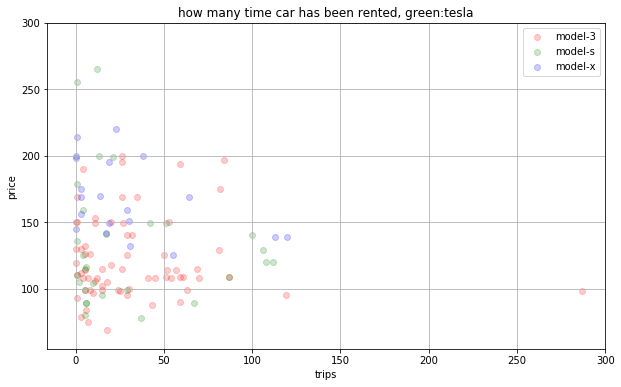

In [41]:
from matplotlib import colors as mcolors
colors = dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS)
k=list(mcolors.CSS4_COLORS)
k=['red','green','blue','yellow','magenta','cyan']

def s_ch2(data, inp_x, inp_y, inp_xmax, inp_ymax, inp_make):
    col1 = inp_x
    col2 = inp_y
    
    plt.figure(figsize=(10, 6))
    
    c=0
    for rec in data.loc[data['make']==inp_make].groupby(['model']).count().reset_index()['model']:
        plt.scatter(data.loc[data['model']==rec][col1], data.loc[data['model']==rec][col2], 
                    alpha=.2, color=k[c], label=rec)
        print(rec, k[c])
        c+=1
    
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.legend(loc='best');
    plt.grid()
    plt.title('how many time car has been rented, green:'+inp_make)
    plt.ylim(ymax=inp_ymax)
    plt.xlim(xmax=inp_ymax)

s_ch2(data, inp_x='trips', inp_y='price', inp_xmax=175, inp_ymax=300, inp_make='tesla')

In [42]:
#data_numerical = (data[numerical_columns] - data[numerical_columns].mean()) / data[numerical_columns].std()
data=data.loc[(data['make'].isin(top_makes[:3])) & (data['model'].isin(top_models[:20]['model']))]

mean = data[numerical_columns].mean()
std=data[numerical_columns].std()
print(mean)
print(std)
print('=')
for index, row in data.iterrows():
    for c in range(len(numerical_columns)):
        ccol = numerical_columns[c]
        rslt=(row[ccol]-mean[ccol])/std[ccol]
        print(ccol, row[ccol], row[ccol]/mean[ccol], rslt)
        data[ccol][index]=rslt
    print('=')

allStrs       0.541139
bsns          0.325949
year       2015.202532
stars         4.556962
trips        30.050633
price        93.240506
money      2524.145570
dtype: float64
allStrs       0.499095
bsns          0.469472
year          3.511902
stars         1.423136
trips        35.657684
price        54.306880
money      3412.599409
dtype: float64
=
allStrs 1.0 1.8479532163742691 0.9193855666258415
bsns 1.0 3.0679611650485437 1.435763554401106
year 2018.0 1.0013881822350361 0.7965679438474658
stars 5.0 1.097222222222222 0.3113110292971092
trips 64.0 2.129738837405223 0.9520911923973393
price 169.0 1.8125169698615258 1.3950257080567965
money 10816.0 4.2850143550267665 2.4297766705132187
=
allStrs 1.0 1.8479532163742691 0.9193855666258415
bsns 1.0 3.0679611650485437 1.435763554401106
year 2018.0 1.0013881822350361 0.7965679438474658
stars 5.0 1.097222222222222 0.3113110292971092
trips 87.0 2.8951137320977254 1.5971134506322258
price 109.0 1.1690198207982623 0.2901933177160754
money 948

/home/greed/anaconda3/envs/tensorflow_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/greed/anaconda3/envs/tensorflow_gpu/lib/python3.7/site-packages/IPython/core/interactiveshell.py:2878: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


 1.0 3.0679611650485437 1.435763554401106
year 2018.0 1.0013881822350361 0.7965679438474658
stars 5.0 1.097222222222222 0.3113110292971092
trips 69.0 2.2961246840775065 1.0923134224484015
price 115.0 1.2333695357045886 0.4006765567501475
money 7935.0 3.1436380276569333 1.5855521792943115
=
allStrs 0.0 0.0 -1.084240909607027
bsns 0.0 0.0 -0.6942894183254175
year 2018.0 1.0013881822350361 0.7965679438474658
stars 5.0 1.097222222222222 0.3113110292971092
trips 3.0 0.09983150800336985 -0.7586200142256204
price 130.0 1.3942438229704046 0.6768846543353277
money 390.0 0.15450772914759975 -0.6253724254424655
=
allStrs 1.0 1.8479532163742691 0.9193855666258415
bsns 1.0 3.0679611650485437 1.435763554401106
year 2015.0 0.9998994981187304 -0.057670077382648316
stars 5.0 1.097222222222222 0.3113110292971092
trips 18.0 0.598989048020219 -0.33795332407243367
price 66.0 0.70784686396959 -0.5016032286947747
money 1188.0 0.4706543134034577 -0.3915330835498283
=
allStrs 1.0 1.8479532163742691 0.919385566

=
allStrs 0.0 0.0 -1.084240909607027
bsns 1.0 3.0679611650485437 1.435763554401106
year 2019.0 1.0018844102738047 1.0813139509241705
stars 5.0 1.097222222222222 0.3113110292971092
trips 27.0 0.8984835720303286 -0.08555330998052155
price 149.0 1.5980179201737714 1.0267482446098894
money 4023.0 1.5938066522071637 0.4392119468582251
=
allStrs 1.0 1.8479532163742691 0.9193855666258415
bsns 0.0 0.0 -0.6942894183254175
year 2018.0 1.0013881822350361 0.7965679438474658
stars 5.0 1.097222222222222 0.3113110292971092
trips 59.0 1.9633529907329401 0.811868962346277
price 109.0 1.1690198207982623 0.2901933177160754
money 6431.0 2.547792836277472 1.1448324171307445
=
allStrs 0.0 0.0 -1.084240909607027
bsns 0.0 0.0 -0.6942894183254175
year 2011.0 0.997914585963656 -1.196654105689467
stars 5.0 1.097222222222222 0.3113110292971092
trips 12.0 0.3993260320134794 -0.5062200001337084
price 55.0 0.589872386641325 -0.7041558335905735
money 660.0 0.2614746185574765 -0.546253851117889
=
allStrs 1.0 1.8479532

year 2013.0 0.9989070420411932 -0.6271620915360577
stars 5.0 1.097222222222222 0.3113110292971092
trips 51.0 1.6971356360572873 0.5875133942645774
price 149.0 1.5980179201737714 1.0267482446098894
money 7599.0 3.0105236763913092 1.4870935090237272
=
allStrs 0.0 0.0 -1.084240909607027
bsns 0.0 0.0 -0.6942894183254175
year 2019.0 1.0018844102738047 1.0813139509241705
stars 5.0 1.097222222222222 0.3113110292971092
trips 1.0 0.03327716933445661 -0.8147089062460454
price 169.0 1.8125169698615258 1.3950257080567965
money 169.0 0.06695334929729323 -0.6901324436859152
=
allStrs 0.0 0.0 -1.084240909607027
bsns 0.0 0.0 -0.6942894183254175
year 2018.0 1.0013881822350361 0.7965679438474658
stars 0.0 0.0 -3.202056301341697
trips 0.0 0.0 -0.8427533522562578
price 41.0 0.4397230518598968 -0.9619500580034084
money 0.0 0.0 -0.739654810577965
=
allStrs 0.0 0.0 -1.084240909607027
bsns 0.0 0.0 -0.6942894183254175
year 2016.0 1.000395726157499 0.22707592969405635
stars 0.0 0.0 -3.202056301341697
trips 0.0 

allStrs 1.0 1.8479532163742691 0.9193855666258415
bsns 0.0 0.0 -0.6942894183254175
year 2018.0 1.0013881822350361 0.7965679438474658
stars 5.0 1.097222222222222 0.3113110292971092
trips 39.0 1.2978096040438079 0.2509800421420279
price 69.0 0.7400217214227531 -0.4463616091777386
money 2691.0 1.0661033311184382 0.04889364685698097
=
allStrs 0.0 0.0 -1.084240909607027
bsns 0.0 0.0 -0.6942894183254175
year 2013.0 0.9989070420411932 -0.6271620915360577
stars 5.0 1.097222222222222 0.3113110292971092
trips 26.0 0.8652064026958719 -0.113597755990734
price 54.0 0.5791474341569373 -0.7225697067629189
money 1404.0 0.5562278249313591 -0.32823822409016706
=
allStrs 1.0 1.8479532163742691 0.9193855666258415
bsns 1.0 3.0679611650485437 1.435763554401106
year 2019.0 1.0018844102738047 1.0813139509241705
stars 5.0 1.097222222222222 0.3113110292971092
trips 29.0 0.9650379106992418 -0.029464417960096637
price 43.0 0.46117295682867226 -0.9251223116587177
money 1247.0 0.4940285596078382 -0.3742442099011245

In [43]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 20)
data

,allStrs,bsns,year,make,stars,trips,price,model,money
0,0.919386,1.435764,0.796568,tesla,0.311311,0.952091,1.395026,model-x,2.429777
2,0.919386,1.435764,0.796568,tesla,0.311311,1.597113,0.290193,model-3,2.039165
4,0.919386,1.435764,1.081314,tesla,0.311311,1.120358,0.271779,model-3,1.475665
6,0.919386,1.435764,0.227076,toyota,0.311311,1.204491,-0.796225,prius,0.329911
8,0.919386,1.435764,0.511822,tesla,0.311311,7.206003,0.087641,model-3,7.502156
...,...,...,...,...,...,...,...,...,...
1407,0.919386,-0.694289,-0.627162,bmw,0.311311,-0.646442,-0.906708,3-series,-0.649401
1413,0.919386,-0.694289,0.511822,tesla,-3.202056,-0.842753,4.727937,model-x,-0.739655
1421,-1.084241,-0.694289,0.227076,tesla,0.311311,-0.814709,2.223650,model-x,-0.676946
1427,0.919386,1.435764,0.511822,bmw,0.311311,1.709291,0.474332,x5,2.433586


In [44]:
#data_nonbinary = pd.get_dummies(data['vtype'])
data_nonbinary = pd.get_dummies(data[nonbinary_columns])
print(data_nonbinary)
data[nonbinary_columns]
data_nonbinary

      make_bmw  make_tesla  make_toyota  model_3-series  model_4-series  \
0            0           1            0               0               0   
2            0           1            0               0               0   
4            0           1            0               0               0   
6            0           0            1               0               0   
8            0           1            0               0               0   
...        ...         ...          ...             ...             ...   
1407         1           0            0               1               0   
1413         0           1            0               0               0   
1421         0           1            0               0               0   
1427         1           0            0               0               0   
1437         1           0            0               0               0   

      model_5-series  model_7-series  model_camry  model_model-3  \
0                  0           

,make_bmw,make_tesla,make_toyota,model_3-series,model_4-series,model_5-series,model_7-series,model_camry,model_model-3,model_model-s,model_model-x,model_prius,model_sienna,model_x5
0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
2,0,1,0,0,0,0,0,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0,0,1,0,0,0,0,0
6,0,0,1,0,0,0,0,0,0,0,0,1,0,0
8,0,1,0,0,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1407,1,0,0,1,0,0,0,0,0,0,0,0,0,0
1413,0,1,0,0,0,0,0,0,0,0,1,0,0,0
1421,0,1,0,0,0,0,0,0,0,0,1,0,0,0
1427,1,0,0,0,0,0,0,0,0,0,0,0,0,1


In [45]:
new_data = pd.concat([data,data_nonbinary], axis=1).drop(nonbinary_columns, axis=1)

In [46]:
y=new_data['price']
X=new_data.drop(['price','money'], axis=1)
X

,allStrs,bsns,year,stars,trips,make_bmw,make_tesla,make_toyota,model_3-series,model_4-series,model_5-series,model_7-series,model_camry,model_model-3,model_model-s,model_model-x,model_prius,model_sienna,model_x5
0,0.919386,1.435764,0.796568,0.311311,0.952091,0,1,0,0,0,0,0,0,0,0,1,0,0,0
2,0.919386,1.435764,0.796568,0.311311,1.597113,0,1,0,0,0,0,0,0,1,0,0,0,0,0
4,0.919386,1.435764,1.081314,0.311311,1.120358,0,1,0,0,0,0,0,0,1,0,0,0,0,0
6,0.919386,1.435764,0.227076,0.311311,1.204491,0,0,1,0,0,0,0,0,0,0,0,1,0,0
8,0.919386,1.435764,0.511822,0.311311,7.206003,0,1,0,0,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1407,0.919386,-0.694289,-0.627162,0.311311,-0.646442,1,0,0,1,0,0,0,0,0,0,0,0,0,0
1413,0.919386,-0.694289,0.511822,-3.202056,-0.842753,0,1,0,0,0,0,0,0,0,0,1,0,0,0
1421,-1.084241,-0.694289,0.227076,0.311311,-0.814709,0,1,0,0,0,0,0,0,0,0,1,0,0,0
1427,0.919386,1.435764,0.511822,0.311311,1.709291,1,0,0,0,0,0,0,0,0,0,0,0,0,1


In [47]:
import numpy as np
import keras
k = 4
num_val_samples = len(X) // k 
all_scores = []


Using TensorFlow backend.


In [131]:
from keras import models
from keras import layers
def build_model(X_train, inp_lr=0.01, mult=1):
    model = models.Sequential()
    model.add(layers.Dense(20*mult, activation='relu', input_shape=(X_train.shape[1],)))
    #model.add(layers.Dropout(0.5))
    model.add(layers.Dense(10*mult, activation='relu'))
    #model.add(layers.Dropout(0.5))
    model.add(layers.Dense(5*mult, activation='relu'))
    model.add(layers.Dense(1))
    
    RMS = keras.optimizers.RMSprop(lr=inp_lr, rho=0.9)
    ADAGrad = keras.optimizers.Adagrad(lr=inp_lr, epsilon=1e-08, decay=0.0)
    
    model.compile(optimizer=ADAGrad, loss='mse', metrics=['mae'])
    model.summary()
    return model

In [60]:
#p = {'lr': (0.5, 10, 10),
#               'first_neuron':[8,16,32,64],
#               'hidden_layers': [1,2, 3, 4,5,6],
#               'batch_size': [16,32,64,128],
#               'epochs': [100,200,300],
#               'dropout': (0, 0.70, 10),
#               'weight_regulizer': [None],
#               'emb_output_dims': [None],
#               'optimizer': ['Adam', 'Nadam', 'RMSprop'],
#               'losses': [binary_crossentropy],
#               'activation': [relu,elu],
#               'last_activation': [sigmoid]}
num_epochs = 100

hhistory=[]
all_scores_hist=[]
for ext_lr in [0.1, 0.03, 0.01, 0.003, 0.001, 0.0003, 0.0001]:
    for mult in range(1,10):
        for i in range(k):
            print('processing fold #', i)
            val_data = X[i * num_val_samples: (i + 1) * num_val_samples]
            val_targets = y[i * num_val_samples: (i + 1) * num_val_samples]

            partial_train_data = np.concatenate(
                [X[:i * num_val_samples], 
                 X[(i + 1) * num_val_samples:]], 
                axis=0)
            partial_train_targets = np.concatenate(
                [y[:i * num_val_samples], 
                 y[(i + 1) * num_val_samples:]], 
                axis=0)

            model = build_model(X, mult=mult, inp_lr=ext_lr) 

            #tbCallBack = keras.callbacks.TensorBoard(log_dir='./GraphCars'+str(i), 
            #            histogram_freq=0, write_graph=True, write_images=True)
            
            tbCallBack = keras.callbacks.TensorBoard(
                log_dir='./GraphCarsLL'+"_"+str(ext_lr)+"_"+str(i)+"_"+str(mult), 
                        histogram_freq=0, write_graph=True, write_images=True)

            hist = model.fit(partial_train_data, partial_train_targets,
                  epochs=num_epochs, batch_size=1, verbose=0, callbacks=[tbCallBack])

            hhistory.append(hist)
            #print(type(hist.history['loss']), hist.history['loss'])
            val_mse, val_mae = model.evaluate(val_data, val_targets, verbose=1)
            print('#'*10, val_mse, val_mae)
            all_scores.append(val_mae)
            dic_el={'hist':hist, 'lr':ext_lr, 'i':i, 'mult':mult, 
                                    'min_loss':min(hist.history['loss']),  
                                    'min_mean_absolute_error':min(hist.history['mean_absolute_error']),
                                    'val_mse':val_mse, 'val_mae':val_mae}
            print(dic_el)
            all_scores_hist.append(dic_el)
            

processing fold # 0
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_41 (Dense)             (None, 20)                400       
_________________________________________________________________
dense_42 (Dense)             (None, 10)                210       
_________________________________________________________________
dense_43 (Dense)             (None, 5)                 55        
_________________________________________________________________
dense_44 (Dense)             (None, 1)                 6         
Total params: 671
Trainable params: 671
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
237/237 [==============================] - 1s 2ms/step - loss: 0.8461 - mean_absolute_error: 0.5823
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.5174 - mean_absolute_error: 0.4353
Epoch 3/100
237/237 [===========

Epoch 27/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3451 - mean_absolute_error: 0.3495
Epoch 28/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3443 - mean_absolute_error: 0.3487
Epoch 29/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3448 - mean_absolute_error: 0.3467
Epoch 30/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3443 - mean_absolute_error: 0.3460
Epoch 31/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3429 - mean_absolute_error: 0.3464
Epoch 32/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3417 - mean_absolute_error: 0.3427
Epoch 33/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3442 - mean_absolute_error: 0.3491
Epoch 34/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3432 - mean_absolute_error: 0.3444
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3423 - mean_absolu

Epoch 61/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1201 - mean_absolute_error: 0.2315
Epoch 62/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1168 - mean_absolute_error: 0.2201
Epoch 63/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1169 - mean_absolute_error: 0.2251
Epoch 64/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1192 - mean_absolute_error: 0.2317
Epoch 65/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1175 - mean_absolute_error: 0.2271
Epoch 66/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1168 - mean_absolute_error: 0.2263
Epoch 67/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1162 - mean_absolute_error: 0.2237
Epoch 68/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1163 - mean_absolute_error: 0.2243
Epoch 69/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1164 - mean_absolu

237/237 [==============================] - 0s 2ms/step - loss: 0.3941 - mean_absolute_error: 0.3620
Epoch 95/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3942 - mean_absolute_error: 0.3646
Epoch 96/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3943 - mean_absolute_error: 0.3642
Epoch 97/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3941 - mean_absolute_error: 0.3637
Epoch 98/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3941 - mean_absolute_error: 0.3632
Epoch 99/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3941 - mean_absolute_error: 0.3627
Epoch 100/100
79/79 [==============================] - 0s 2ms/step
########## 0.8549170690246776 0.5790305416795272
{'hist': <keras.callbacks.History object at 0x7fa84806b9d0>, 'lr': 0.1, 'i': 3, 'mult': 1, 'min_loss': 0.3940733673645772, 'min_mean_absolute_error': 0.3619911724442168, 'val_mse': 0.8549170690246776, 'val_mae': 0.57903

237/237 [==============================] - 0s 2ms/step - loss: 0.1802 - mean_absolute_error: 0.2900
Epoch 17/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1752 - mean_absolute_error: 0.2797
Epoch 18/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1719 - mean_absolute_error: 0.2827
Epoch 19/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1716 - mean_absolute_error: 0.2746
Epoch 20/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1693 - mean_absolute_error: 0.2754
Epoch 21/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1736 - mean_absolute_error: 0.2767
Epoch 22/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1673 - mean_absolute_error: 0.2694
Epoch 23/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1628 - mean_absolute_error: 0.2615
Epoch 24/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1612 - mean_absolute_error: 0.2

237/237 [==============================] - 0s 2ms/step - loss: 0.1137 - mean_absolute_error: 0.2134
Epoch 50/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1119 - mean_absolute_error: 0.2128
Epoch 51/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1125 - mean_absolute_error: 0.2105
Epoch 52/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1129 - mean_absolute_error: 0.2124
Epoch 53/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1052 - mean_absolute_error: 0.2067
Epoch 54/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1135 - mean_absolute_error: 0.2121
Epoch 55/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1050 - mean_absolute_error: 0.2054
Epoch 56/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1059 - mean_absolute_error: 0.2074
Epoch 57/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1035 - mean_absolute_error: 0.2

237/237 [==============================] - 0s 2ms/step - loss: 0.0809 - mean_absolute_error: 0.1783
Epoch 83/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0790 - mean_absolute_error: 0.1751
Epoch 84/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0784 - mean_absolute_error: 0.1766
Epoch 85/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0779 - mean_absolute_error: 0.1742
Epoch 86/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0790 - mean_absolute_error: 0.1743
Epoch 87/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0782 - mean_absolute_error: 0.1739
Epoch 88/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0779 - mean_absolute_error: 0.1701
Epoch 89/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0770 - mean_absolute_error: 0.1697
Epoch 90/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0785 - mean_absolute_error: 0.1

237/237 [==============================] - 0s 2ms/step - loss: 0.3163 - mean_absolute_error: 0.3558
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3215 - mean_absolute_error: 0.3541
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2940 - mean_absolute_error: 0.3479
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2785 - mean_absolute_error: 0.3367
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2726 - mean_absolute_error: 0.3398
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2427 - mean_absolute_error: 0.3147
Epoch 10/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2315 - mean_absolute_error: 0.3090
Epoch 11/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2357 - mean_absolute_error: 0.3218
Epoch 12/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2255 - mean_absolute_error: 0.3098
E

237/237 [==============================] - 0s 2ms/step - loss: 0.1179 - mean_absolute_error: 0.2184
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1165 - mean_absolute_error: 0.2179
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1159 - mean_absolute_error: 0.2213
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1135 - mean_absolute_error: 0.2149
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1116 - mean_absolute_error: 0.2164
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1087 - mean_absolute_error: 0.2087
Epoch 43/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1141 - mean_absolute_error: 0.2199
Epoch 44/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1109 - mean_absolute_error: 0.2150
Epoch 45/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1031 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6446 - mean_absolute_error: 0.5584
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3992 - mean_absolute_error: 0.3923
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3443 - mean_absolute_error: 0.3591
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3075 - mean_absolute_error: 0.3417
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3040 - mean_absolute_error: 0.3400
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2934 - mean_absolute_error: 0.3372
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2735 - mean_absolute_error: 0.3321
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2533 - mean_absolute_error: 0.3116
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2431 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1932 - mean_absolute_error: 0.2691
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2100 - mean_absolute_error: 0.2730
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1948 - mean_absolute_error: 0.2598
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1816 - mean_absolute_error: 0.2643
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1858 - mean_absolute_error: 0.2643
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1852 - mean_absolute_error: 0.2577
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1854 - mean_absolute_error: 0.2521
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1866 - mean_absolute_error: 0.2625
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1786 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9713 - mean_absolute_error: 0.5788
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4530 - mean_absolute_error: 0.4140
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3496 - mean_absolute_error: 0.3817
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3117 - mean_absolute_error: 0.3542
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2880 - mean_absolute_error: 0.3399
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2668 - mean_absolute_error: 0.3344
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2589 - mean_absolute_error: 0.3334
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2533 - mean_absolute_error: 0.3398
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2339 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1342 - mean_absolute_error: 0.2343
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1335 - mean_absolute_error: 0.2344
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1310 - mean_absolute_error: 0.2284
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1294 - mean_absolute_error: 0.2247
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1320 - mean_absolute_error: 0.2309
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1214 - mean_absolute_error: 0.2277
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1242 - mean_absolute_error: 0.2204
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1241 - mean_absolute_error: 0.2245
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1235 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6243 - mean_absolute_error: 0.5320
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3967 - mean_absolute_error: 0.4044
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3338 - mean_absolute_error: 0.3617
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3258 - mean_absolute_error: 0.3616
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3126 - mean_absolute_error: 0.3536
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2760 - mean_absolute_error: 0.3354
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2547 - mean_absolute_error: 0.3246
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2515 - mean_absolute_error: 0.3283
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2379 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1865 - mean_absolute_error: 0.2571
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1721 - mean_absolute_error: 0.2436
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1648 - mean_absolute_error: 0.2397
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1607 - mean_absolute_error: 0.2443
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1643 - mean_absolute_error: 0.2378
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1577 - mean_absolute_error: 0.2355
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1593 - mean_absolute_error: 0.2362
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1595 - mean_absolute_error: 0.2371
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1502 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7971 - mean_absolute_error: 0.5668
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4017 - mean_absolute_error: 0.4128
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3741 - mean_absolute_error: 0.3948
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3381 - mean_absolute_error: 0.3707
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2860 - mean_absolute_error: 0.3425
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2867 - mean_absolute_error: 0.3532
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2435 - mean_absolute_error: 0.3260
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2144 - mean_absolute_error: 0.3166
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2062 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1132 - mean_absolute_error: 0.2150
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1160 - mean_absolute_error: 0.2076
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1174 - mean_absolute_error: 0.2083
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1094 - mean_absolute_error: 0.2084
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1033 - mean_absolute_error: 0.2017
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1040 - mean_absolute_error: 0.2007
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1029 - mean_absolute_error: 0.2000
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1029 - mean_absolute_error: 0.1992
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.0986 - mean_absolute_error: 0.1

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6925 - mean_absolute_error: 0.5457
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4231 - mean_absolute_error: 0.3988
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3326 - mean_absolute_error: 0.3734
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2985 - mean_absolute_error: 0.3449
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2911 - mean_absolute_error: 0.3388
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2895 - mean_absolute_error: 0.3337
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2564 - mean_absolute_error: 0.3217
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2503 - mean_absolute_error: 0.3141
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2304 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1725 - mean_absolute_error: 0.2556
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1761 - mean_absolute_error: 0.2547
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1728 - mean_absolute_error: 0.2509
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1738 - mean_absolute_error: 0.2524
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1644 - mean_absolute_error: 0.2510
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1642 - mean_absolute_error: 0.2474
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1591 - mean_absolute_error: 0.2415
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1640 - mean_absolute_error: 0.2437
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1569 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7658 - mean_absolute_error: 0.5735
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4028 - mean_absolute_error: 0.4114
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3928 - mean_absolute_error: 0.3750
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3389 - mean_absolute_error: 0.3666
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2885 - mean_absolute_error: 0.3447
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2805 - mean_absolute_error: 0.3484
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2323 - mean_absolute_error: 0.3266
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2723 - mean_absolute_error: 0.3418
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2483 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1403 - mean_absolute_error: 0.2283
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1259 - mean_absolute_error: 0.2189
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1202 - mean_absolute_error: 0.2099
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1207 - mean_absolute_error: 0.2171
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1110 - mean_absolute_error: 0.2146
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1134 - mean_absolute_error: 0.2073
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1069 - mean_absolute_error: 0.2051
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1010 - mean_absolute_error: 0.2042
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1151 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6421 - mean_absolute_error: 0.5659
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3679 - mean_absolute_error: 0.3972
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3292 - mean_absolute_error: 0.3560
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3158 - mean_absolute_error: 0.3474
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2767 - mean_absolute_error: 0.3414
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3060 - mean_absolute_error: 0.3457
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2660 - mean_absolute_error: 0.3209
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2590 - mean_absolute_error: 0.3243
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2254 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1806 - mean_absolute_error: 0.2519
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1694 - mean_absolute_error: 0.2442
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1758 - mean_absolute_error: 0.2497
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1874 - mean_absolute_error: 0.2532
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1717 - mean_absolute_error: 0.2479
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1639 - mean_absolute_error: 0.2447
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1658 - mean_absolute_error: 0.2421
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1602 - mean_absolute_error: 0.2368
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1522 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 1.2110 - mean_absolute_error: 0.6310
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4212 - mean_absolute_error: 0.4065
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3850 - mean_absolute_error: 0.3926
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3093 - mean_absolute_error: 0.3575
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2968 - mean_absolute_error: 0.3587
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2911 - mean_absolute_error: 0.3300
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2741 - mean_absolute_error: 0.3452
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2444 - mean_absolute_error: 0.3340
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2438 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1318 - mean_absolute_error: 0.2216
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1365 - mean_absolute_error: 0.2271
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1338 - mean_absolute_error: 0.2227
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1282 - mean_absolute_error: 0.2173
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1323 - mean_absolute_error: 0.2164
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1260 - mean_absolute_error: 0.2163
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1236 - mean_absolute_error: 0.2135
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1222 - mean_absolute_error: 0.2083
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1179 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 1.1730 - mean_absolute_error: 0.5825
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3868 - mean_absolute_error: 0.3913
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3613 - mean_absolute_error: 0.3704
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3176 - mean_absolute_error: 0.3571
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2883 - mean_absolute_error: 0.3435
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3078 - mean_absolute_error: 0.3557
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2775 - mean_absolute_error: 0.3466
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2620 - mean_absolute_error: 0.3219
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2766 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1918 - mean_absolute_error: 0.2597
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1838 - mean_absolute_error: 0.2550
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1921 - mean_absolute_error: 0.2585
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1794 - mean_absolute_error: 0.2558
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1807 - mean_absolute_error: 0.2520
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1717 - mean_absolute_error: 0.2517
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1740 - mean_absolute_error: 0.2451
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1741 - mean_absolute_error: 0.2500
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1672 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 3.8931 - mean_absolute_error: 0.7674
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4408 - mean_absolute_error: 0.4147
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4170 - mean_absolute_error: 0.4204
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3077 - mean_absolute_error: 0.3484
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3250 - mean_absolute_error: 0.3617
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2678 - mean_absolute_error: 0.3442
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2251 - mean_absolute_error: 0.3223
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2050 - mean_absolute_error: 0.3075
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1900 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1452 - mean_absolute_error: 0.2246
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1370 - mean_absolute_error: 0.2238
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1421 - mean_absolute_error: 0.2242
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1350 - mean_absolute_error: 0.2167
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1328 - mean_absolute_error: 0.2169
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1273 - mean_absolute_error: 0.2205
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1332 - mean_absolute_error: 0.2194
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1264 - mean_absolute_error: 0.2142
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1273 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 18.2408 - mean_absolute_error: 0.8627
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4135 - mean_absolute_error: 0.4278
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3569 - mean_absolute_error: 0.3742
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3336 - mean_absolute_error: 0.3645
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2815 - mean_absolute_error: 0.3296
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2766 - mean_absolute_error: 0.3318
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2695 - mean_absolute_error: 0.3163
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2332 - mean_absolute_error: 0.3023
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2288 - mean_absolute_error

237/237 [==============================] - 0s 2ms/step - loss: 0.1812 - mean_absolute_error: 0.2595
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1804 - mean_absolute_error: 0.2544
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1809 - mean_absolute_error: 0.2580
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1751 - mean_absolute_error: 0.2517
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1763 - mean_absolute_error: 0.2503
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1709 - mean_absolute_error: 0.2487
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1689 - mean_absolute_error: 0.2471
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1632 - mean_absolute_error: 0.2478
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1648 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 2.5967 - mean_absolute_error: 0.6267
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4117 - mean_absolute_error: 0.4022
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3579 - mean_absolute_error: 0.3794
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3327 - mean_absolute_error: 0.3530
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3085 - mean_absolute_error: 0.3501
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2876 - mean_absolute_error: 0.3435
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2995 - mean_absolute_error: 0.3490
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2412 - mean_absolute_error: 0.3225
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2601 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1477 - mean_absolute_error: 0.2315
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1450 - mean_absolute_error: 0.2287
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1442 - mean_absolute_error: 0.2287
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1461 - mean_absolute_error: 0.2211
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1419 - mean_absolute_error: 0.2269
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1394 - mean_absolute_error: 0.2248
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1420 - mean_absolute_error: 0.2221
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1408 - mean_absolute_error: 0.2223
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1340 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 2.2776 - mean_absolute_error: 0.7118
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4078 - mean_absolute_error: 0.3994
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3678 - mean_absolute_error: 0.3800
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3303 - mean_absolute_error: 0.3596
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2890 - mean_absolute_error: 0.3361
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2769 - mean_absolute_error: 0.3388
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2435 - mean_absolute_error: 0.3076
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2187 - mean_absolute_error: 0.2964
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2138 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.4892 - mean_absolute_error: 0.3868
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4868 - mean_absolute_error: 0.3848
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4859 - mean_absolute_error: 0.3855
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4867 - mean_absolute_error: 0.3843
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4820 - mean_absolute_error: 0.3812
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4847 - mean_absolute_error: 0.3847
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4838 - mean_absolute_error: 0.3838
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4824 - mean_absolute_error: 0.3848
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4822 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6632 - mean_absolute_error: 0.5401
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.5231 - mean_absolute_error: 0.4294
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4714 - mean_absolute_error: 0.4008
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4459 - mean_absolute_error: 0.3932
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4277 - mean_absolute_error: 0.3837
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4137 - mean_absolute_error: 0.3800
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4029 - mean_absolute_error: 0.3757
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3964 - mean_absolute_error: 0.3792
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3914 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1822 - mean_absolute_error: 0.2841
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1795 - mean_absolute_error: 0.2827
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1799 - mean_absolute_error: 0.2813
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1777 - mean_absolute_error: 0.2806
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1743 - mean_absolute_error: 0.2773
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1743 - mean_absolute_error: 0.2793
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1721 - mean_absolute_error: 0.2756
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1700 - mean_absolute_error: 0.2741
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1693 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6565 - mean_absolute_error: 0.5955
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4299 - mean_absolute_error: 0.4402
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3636 - mean_absolute_error: 0.3963
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3296 - mean_absolute_error: 0.3589
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3112 - mean_absolute_error: 0.3492
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3031 - mean_absolute_error: 0.3486
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2889 - mean_absolute_error: 0.3369
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2796 - mean_absolute_error: 0.3344
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2703 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1858 - mean_absolute_error: 0.2702
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1841 - mean_absolute_error: 0.2667
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1796 - mean_absolute_error: 0.2668
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1804 - mean_absolute_error: 0.2640
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1760 - mean_absolute_error: 0.2653
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1757 - mean_absolute_error: 0.2606
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1724 - mean_absolute_error: 0.2611
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1725 - mean_absolute_error: 0.2584
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1694 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6372 - mean_absolute_error: 0.5137
Epoch 2/100
237/237 [==============================] - 0s 2ms/step - loss: 0.4179 - mean_absolute_error: 0.3965
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3641 - mean_absolute_error: 0.3726
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3338 - mean_absolute_error: 0.3551
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3146 - mean_absolute_error: 0.3391
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2973 - mean_absolute_error: 0.3416
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2908 - mean_absolute_error: 0.3277
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2781 - mean_absolute_error: 0.3312
Epoch 9/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2680 - mean_absolute_error:

237/237 [==============================] - 0s 2ms/step - loss: 0.1532 - mean_absolute_error: 0.2412
Epoch 35/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1483 - mean_absolute_error: 0.2416
Epoch 36/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1496 - mean_absolute_error: 0.2374
Epoch 37/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1460 - mean_absolute_error: 0.2357
Epoch 38/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1443 - mean_absolute_error: 0.2327
Epoch 39/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1414 - mean_absolute_error: 0.2326
Epoch 40/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1385 - mean_absolute_error: 0.2320
Epoch 41/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1372 - mean_absolute_error: 0.2312
Epoch 42/100
237/237 [==============================] - 0s 2ms/step - loss: 0.1327 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5278 - mean_absolute_error: 0.4871
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3669 - mean_absolute_error: 0.3824
Epoch 3/100
237/237 [==============================] - 0s 2ms/step - loss: 0.3219 - mean_absolute_error: 0.3555
Epoch 4/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2808 - mean_absolute_error: 0.3331
Epoch 5/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2764 - mean_absolute_error: 0.3245
Epoch 6/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2571 - mean_absolute_error: 0.3225
Epoch 7/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2453 - mean_absolute_error: 0.3092
Epoch 8/100
237/237 [==============================] - 0s 2ms/step - loss: 0.2373 - mean_absolute_error: 0.3073
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2254 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1885 - mean_absolute_error: 0.2589
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1876 - mean_absolute_error: 0.2547
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1878 - mean_absolute_error: 0.2592
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1836 - mean_absolute_error: 0.2508
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1831 - mean_absolute_error: 0.2565
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1826 - mean_absolute_error: 0.2543
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1782 - mean_absolute_error: 0.2479
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1736 - mean_absolute_error: 0.2563
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1783 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4795 - mean_absolute_error: 0.4698
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3572 - mean_absolute_error: 0.3755
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3170 - mean_absolute_error: 0.3507
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2929 - mean_absolute_error: 0.3422
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2766 - mean_absolute_error: 0.3282
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2600 - mean_absolute_error: 0.3173
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2558 - mean_absolute_error: 0.3280
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2434 - mean_absolute_error: 0.3118
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2386 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1384 - mean_absolute_error: 0.2299
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1376 - mean_absolute_error: 0.2292
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1343 - mean_absolute_error: 0.2289
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1262 - mean_absolute_error: 0.2273
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1291 - mean_absolute_error: 0.2236
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1281 - mean_absolute_error: 0.2189
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1253 - mean_absolute_error: 0.2221
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1250 - mean_absolute_error: 0.2190
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1237 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5626 - mean_absolute_error: 0.5053
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3592 - mean_absolute_error: 0.3691
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3294 - mean_absolute_error: 0.3607
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2940 - mean_absolute_error: 0.3402
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2818 - mean_absolute_error: 0.3403
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2665 - mean_absolute_error: 0.3356
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2561 - mean_absolute_error: 0.3203
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2517 - mean_absolute_error: 0.3164
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2330 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1602 - mean_absolute_error: 0.2432
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1625 - mean_absolute_error: 0.2470
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1590 - mean_absolute_error: 0.2431
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1610 - mean_absolute_error: 0.2402
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1590 - mean_absolute_error: 0.2438
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1549 - mean_absolute_error: 0.2356
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1530 - mean_absolute_error: 0.2403
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1536 - mean_absolute_error: 0.2338
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1499 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5724 - mean_absolute_error: 0.5078
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3803 - mean_absolute_error: 0.4075
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3227 - mean_absolute_error: 0.3585
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3020 - mean_absolute_error: 0.3448
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2788 - mean_absolute_error: 0.3276
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2622 - mean_absolute_error: 0.3303
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2428 - mean_absolute_error: 0.3197
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2307 - mean_absolute_error: 0.3181
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2279 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1335 - mean_absolute_error: 0.2242
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1310 - mean_absolute_error: 0.2219
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1275 - mean_absolute_error: 0.2226
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1272 - mean_absolute_error: 0.2221
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1257 - mean_absolute_error: 0.2144
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1227 - mean_absolute_error: 0.2144
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1215 - mean_absolute_error: 0.2154
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1223 - mean_absolute_error: 0.2099
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1138 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5373 - mean_absolute_error: 0.4892
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3557 - mean_absolute_error: 0.3648
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3183 - mean_absolute_error: 0.3347
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2978 - mean_absolute_error: 0.3374
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2798 - mean_absolute_error: 0.3208
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2643 - mean_absolute_error: 0.3154
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2505 - mean_absolute_error: 0.3081
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2397 - mean_absolute_error: 0.2995
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2356 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1694 - mean_absolute_error: 0.2478
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1654 - mean_absolute_error: 0.2465
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1599 - mean_absolute_error: 0.2410
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1579 - mean_absolute_error: 0.2405
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1601 - mean_absolute_error: 0.2419
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1593 - mean_absolute_error: 0.2435
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1567 - mean_absolute_error: 0.2398
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1500 - mean_absolute_error: 0.2320
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1521 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5853 - mean_absolute_error: 0.5116
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3712 - mean_absolute_error: 0.3814
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3283 - mean_absolute_error: 0.3604
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2970 - mean_absolute_error: 0.3429
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2860 - mean_absolute_error: 0.3336
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2659 - mean_absolute_error: 0.3308
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2425 - mean_absolute_error: 0.3222
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2322 - mean_absolute_error: 0.3131
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2289 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1306 - mean_absolute_error: 0.2213
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1270 - mean_absolute_error: 0.2112
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1260 - mean_absolute_error: 0.2190
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1276 - mean_absolute_error: 0.2165
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1225 - mean_absolute_error: 0.2101
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1202 - mean_absolute_error: 0.2094
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1166 - mean_absolute_error: 0.2073
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1157 - mean_absolute_error: 0.2070
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1142 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5354 - mean_absolute_error: 0.4821
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3713 - mean_absolute_error: 0.3650
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3271 - mean_absolute_error: 0.3442
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3024 - mean_absolute_error: 0.3341
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2884 - mean_absolute_error: 0.3245
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2731 - mean_absolute_error: 0.3237
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2588 - mean_absolute_error: 0.3085
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2410 - mean_absolute_error: 0.2963
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2343 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1604 - mean_absolute_error: 0.2379
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1578 - mean_absolute_error: 0.2319
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1526 - mean_absolute_error: 0.2334
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1484 - mean_absolute_error: 0.2253
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1525 - mean_absolute_error: 0.2304
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1487 - mean_absolute_error: 0.2263
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1433 - mean_absolute_error: 0.2252
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1454 - mean_absolute_error: 0.2244
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1403 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6214 - mean_absolute_error: 0.5176
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3728 - mean_absolute_error: 0.3981
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3240 - mean_absolute_error: 0.3622
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2903 - mean_absolute_error: 0.3403
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2687 - mean_absolute_error: 0.3282
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2507 - mean_absolute_error: 0.3194
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2415 - mean_absolute_error: 0.3229
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2285 - mean_absolute_error: 0.3156
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2099 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1245 - mean_absolute_error: 0.2215
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1212 - mean_absolute_error: 0.2220
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1174 - mean_absolute_error: 0.2177
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1189 - mean_absolute_error: 0.2153
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1186 - mean_absolute_error: 0.2175
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1151 - mean_absolute_error: 0.2141
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1137 - mean_absolute_error: 0.2122
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1122 - mean_absolute_error: 0.2101
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1109 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5630 - mean_absolute_error: 0.4985
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3671 - mean_absolute_error: 0.3674
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3117 - mean_absolute_error: 0.3460
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2882 - mean_absolute_error: 0.3288
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2685 - mean_absolute_error: 0.3142
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2538 - mean_absolute_error: 0.3105
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2419 - mean_absolute_error: 0.3014
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2277 - mean_absolute_error: 0.2967
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2275 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1742 - mean_absolute_error: 0.2480
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1714 - mean_absolute_error: 0.2451
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1703 - mean_absolute_error: 0.2470
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1634 - mean_absolute_error: 0.2413
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1643 - mean_absolute_error: 0.2390
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1594 - mean_absolute_error: 0.2372
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1580 - mean_absolute_error: 0.2312
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1569 - mean_absolute_error: 0.2327
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1594 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5676 - mean_absolute_error: 0.5179
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3744 - mean_absolute_error: 0.3802
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3223 - mean_absolute_error: 0.3545
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3129 - mean_absolute_error: 0.3538
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2879 - mean_absolute_error: 0.3284
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2718 - mean_absolute_error: 0.3268
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2558 - mean_absolute_error: 0.3233
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2368 - mean_absolute_error: 0.3232
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2322 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1202 - mean_absolute_error: 0.2102
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1231 - mean_absolute_error: 0.2122
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1168 - mean_absolute_error: 0.2065
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1175 - mean_absolute_error: 0.2067
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1156 - mean_absolute_error: 0.2043
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1119 - mean_absolute_error: 0.2034
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1127 - mean_absolute_error: 0.2040
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1093 - mean_absolute_error: 0.1990
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1091 - mean_absolute_error: 0.1

Epoch 1/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5416 - mean_absolute_error: 0.4810
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3684 - mean_absolute_error: 0.3677
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3120 - mean_absolute_error: 0.3498
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2922 - mean_absolute_error: 0.3315
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2638 - mean_absolute_error: 0.3268
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2619 - mean_absolute_error: 0.3114
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2483 - mean_absolute_error: 0.3028
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2323 - mean_absolute_error: 0.3012
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2301 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1705 - mean_absolute_error: 0.2469
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1694 - mean_absolute_error: 0.2445
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1667 - mean_absolute_error: 0.2451
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1670 - mean_absolute_error: 0.2421
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1660 - mean_absolute_error: 0.2408
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1613 - mean_absolute_error: 0.2404
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1598 - mean_absolute_error: 0.2379
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1585 - mean_absolute_error: 0.2360
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1585 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5806 - mean_absolute_error: 0.5044
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3523 - mean_absolute_error: 0.3820
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3299 - mean_absolute_error: 0.3628
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2975 - mean_absolute_error: 0.3516
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2780 - mean_absolute_error: 0.3315
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2686 - mean_absolute_error: 0.3318
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2497 - mean_absolute_error: 0.3197
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2360 - mean_absolute_error: 0.3103
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2347 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1176 - mean_absolute_error: 0.2113
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1224 - mean_absolute_error: 0.2100
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1185 - mean_absolute_error: 0.2099
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1126 - mean_absolute_error: 0.2032
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1135 - mean_absolute_error: 0.2055
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1133 - mean_absolute_error: 0.2001
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1081 - mean_absolute_error: 0.1967
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1063 - mean_absolute_error: 0.1963
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1028 - mean_absolute_error: 0.1

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5774 - mean_absolute_error: 0.4739
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3880 - mean_absolute_error: 0.3848
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3039 - mean_absolute_error: 0.3470
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2724 - mean_absolute_error: 0.3257
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2630 - mean_absolute_error: 0.3163
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2397 - mean_absolute_error: 0.3157
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2332 - mean_absolute_error: 0.3032
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2066 - mean_absolute_error: 0.2899
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2115 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1670 - mean_absolute_error: 0.2485
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1675 - mean_absolute_error: 0.2521
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1656 - mean_absolute_error: 0.2411
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1603 - mean_absolute_error: 0.2449
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1619 - mean_absolute_error: 0.2469
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1546 - mean_absolute_error: 0.2332
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1565 - mean_absolute_error: 0.2357
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1562 - mean_absolute_error: 0.2360
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1502 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.6023 - mean_absolute_error: 0.5155
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3669 - mean_absolute_error: 0.4034
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3338 - mean_absolute_error: 0.3572
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2817 - mean_absolute_error: 0.3320
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2783 - mean_absolute_error: 0.3362
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2580 - mean_absolute_error: 0.3217
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2334 - mean_absolute_error: 0.3094
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2217 - mean_absolute_error: 0.3100
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2149 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1134 - mean_absolute_error: 0.2091
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1178 - mean_absolute_error: 0.2036
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1129 - mean_absolute_error: 0.1983
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1139 - mean_absolute_error: 0.2021
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1122 - mean_absolute_error: 0.1975
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1065 - mean_absolute_error: 0.1969
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1071 - mean_absolute_error: 0.1982
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1033 - mean_absolute_error: 0.1956
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1011 - mean_absolute_error: 0.1

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.6089 - mean_absolute_error: 0.4911
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3499 - mean_absolute_error: 0.3769
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3141 - mean_absolute_error: 0.3631
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2973 - mean_absolute_error: 0.3306
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2630 - mean_absolute_error: 0.3284
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2575 - mean_absolute_error: 0.3121
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2429 - mean_absolute_error: 0.3131
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2181 - mean_absolute_error: 0.2991
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2164 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.3407 - mean_absolute_error: 0.3632
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3392 - mean_absolute_error: 0.3613
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3380 - mean_absolute_error: 0.3573
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3351 - mean_absolute_error: 0.3569
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3338 - mean_absolute_error: 0.3566
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3306 - mean_absolute_error: 0.3571
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3304 - mean_absolute_error: 0.3559
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3279 - mean_absolute_error: 0.3539
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3267 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7628 - mean_absolute_error: 0.6317
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.5553 - mean_absolute_error: 0.5021
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4772 - mean_absolute_error: 0.4400
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.4452 - mean_absolute_error: 0.4174
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.4266 - mean_absolute_error: 0.4088
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.4129 - mean_absolute_error: 0.3994
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4043 - mean_absolute_error: 0.3936
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3960 - mean_absolute_error: 0.3904
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3901 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.3253 - mean_absolute_error: 0.3457
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3229 - mean_absolute_error: 0.3438
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3200 - mean_absolute_error: 0.3436
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3180 - mean_absolute_error: 0.3408
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3158 - mean_absolute_error: 0.3441
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3134 - mean_absolute_error: 0.3366
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3126 - mean_absolute_error: 0.3421
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3109 - mean_absolute_error: 0.3389
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3089 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7504 - mean_absolute_error: 0.6163
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5429 - mean_absolute_error: 0.5096
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4739 - mean_absolute_error: 0.4676
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4294 - mean_absolute_error: 0.4446
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3986 - mean_absolute_error: 0.4185
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3767 - mean_absolute_error: 0.4030
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3604 - mean_absolute_error: 0.3944
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3480 - mean_absolute_error: 0.3848
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3370 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2652 - mean_absolute_error: 0.3233
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2637 - mean_absolute_error: 0.3196
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2616 - mean_absolute_error: 0.3191
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2588 - mean_absolute_error: 0.3207
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2566 - mean_absolute_error: 0.3199
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2547 - mean_absolute_error: 0.3180
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2534 - mean_absolute_error: 0.3171
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2508 - mean_absolute_error: 0.3152
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2490 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5800 - mean_absolute_error: 0.5137
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4361 - mean_absolute_error: 0.4240
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3921 - mean_absolute_error: 0.4044
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3585 - mean_absolute_error: 0.3809
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3396 - mean_absolute_error: 0.3646
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3231 - mean_absolute_error: 0.3553
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3103 - mean_absolute_error: 0.3493
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2995 - mean_absolute_error: 0.3365
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2907 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.3179 - mean_absolute_error: 0.3268
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3155 - mean_absolute_error: 0.3217
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3120 - mean_absolute_error: 0.3210
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3085 - mean_absolute_error: 0.3201
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3049 - mean_absolute_error: 0.3182
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3037 - mean_absolute_error: 0.3182
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2996 - mean_absolute_error: 0.3151
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2967 - mean_absolute_error: 0.3126
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2943 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5670 - mean_absolute_error: 0.5265
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3932 - mean_absolute_error: 0.4071
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3541 - mean_absolute_error: 0.3790
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3220 - mean_absolute_error: 0.3659
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2990 - mean_absolute_error: 0.3358
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2871 - mean_absolute_error: 0.3395
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2757 - mean_absolute_error: 0.3272
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2656 - mean_absolute_error: 0.3234
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2595 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2547 - mean_absolute_error: 0.3068
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2503 - mean_absolute_error: 0.3081
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2485 - mean_absolute_error: 0.3047
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2461 - mean_absolute_error: 0.3042
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2418 - mean_absolute_error: 0.3047
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2428 - mean_absolute_error: 0.3029
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2390 - mean_absolute_error: 0.3021
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2366 - mean_absolute_error: 0.2997
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2333 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5103 - mean_absolute_error: 0.4908
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3901 - mean_absolute_error: 0.4118
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3523 - mean_absolute_error: 0.3939
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3287 - mean_absolute_error: 0.3696
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3058 - mean_absolute_error: 0.3464
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2976 - mean_absolute_error: 0.3514
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2862 - mean_absolute_error: 0.3438
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2755 - mean_absolute_error: 0.3331
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2714 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.1724 - mean_absolute_error: 0.2610
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1679 - mean_absolute_error: 0.2582
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1648 - mean_absolute_error: 0.2564
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1648 - mean_absolute_error: 0.2568
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1625 - mean_absolute_error: 0.2558
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1586 - mean_absolute_error: 0.2538
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1593 - mean_absolute_error: 0.2516
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1578 - mean_absolute_error: 0.2522
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1539 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.6312 - mean_absolute_error: 0.5324
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4243 - mean_absolute_error: 0.4333
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3726 - mean_absolute_error: 0.3813
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3485 - mean_absolute_error: 0.3649
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3299 - mean_absolute_error: 0.3519
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3148 - mean_absolute_error: 0.3464
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2997 - mean_absolute_error: 0.3302
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2912 - mean_absolute_error: 0.3226
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2842 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.2025 - mean_absolute_error: 0.2755
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2015 - mean_absolute_error: 0.2770
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1980 - mean_absolute_error: 0.2744
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1986 - mean_absolute_error: 0.2772
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1956 - mean_absolute_error: 0.2725
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1962 - mean_absolute_error: 0.2733
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1937 - mean_absolute_error: 0.2685
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1921 - mean_absolute_error: 0.2633
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1922 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.6153 - mean_absolute_error: 0.5096
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3983 - mean_absolute_error: 0.4038
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3527 - mean_absolute_error: 0.3705
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3025 - mean_absolute_error: 0.3483
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2897 - mean_absolute_error: 0.3520
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2688 - mean_absolute_error: 0.3359
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2558 - mean_absolute_error: 0.3309
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2412 - mean_absolute_error: 0.3153
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2372 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1599 - mean_absolute_error: 0.2484
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1567 - mean_absolute_error: 0.2456
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1539 - mean_absolute_error: 0.2457
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1542 - mean_absolute_error: 0.2452
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1519 - mean_absolute_error: 0.2396
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1512 - mean_absolute_error: 0.2435
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1458 - mean_absolute_error: 0.2393
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1479 - mean_absolute_error: 0.2381
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1461 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5494 - mean_absolute_error: 0.4831
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3840 - mean_absolute_error: 0.3892
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3243 - mean_absolute_error: 0.3619
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2915 - mean_absolute_error: 0.3349
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2786 - mean_absolute_error: 0.3349
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2632 - mean_absolute_error: 0.3067
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2548 - mean_absolute_error: 0.3135
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2480 - mean_absolute_error: 0.3036
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2390 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.2075 - mean_absolute_error: 0.2744
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2048 - mean_absolute_error: 0.2755
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2025 - mean_absolute_error: 0.2717
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2013 - mean_absolute_error: 0.2685
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2013 - mean_absolute_error: 0.2693
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1989 - mean_absolute_error: 0.2705
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1968 - mean_absolute_error: 0.2692
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1960 - mean_absolute_error: 0.2689
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1963 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5484 - mean_absolute_error: 0.4818
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3573 - mean_absolute_error: 0.3682
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3188 - mean_absolute_error: 0.3565
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2965 - mean_absolute_error: 0.3405
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2775 - mean_absolute_error: 0.3306
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2669 - mean_absolute_error: 0.3246
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2557 - mean_absolute_error: 0.3173
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2482 - mean_absolute_error: 0.3143
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2404 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1589 - mean_absolute_error: 0.2472
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1557 - mean_absolute_error: 0.2433
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1546 - mean_absolute_error: 0.2433
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1516 - mean_absolute_error: 0.2415
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1499 - mean_absolute_error: 0.2414
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1474 - mean_absolute_error: 0.2391
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1481 - mean_absolute_error: 0.2360
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1460 - mean_absolute_error: 0.2328
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1431 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.4773 - mean_absolute_error: 0.4415
Epoch 2/100
237/237 [==============================] - 1s 2ms/step - loss: 0.3266 - mean_absolute_error: 0.3442
Epoch 3/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2990 - mean_absolute_error: 0.3336
Epoch 4/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2803 - mean_absolute_error: 0.3140
Epoch 5/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2573 - mean_absolute_error: 0.3104
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2549 - mean_absolute_error: 0.3009
Epoch 7/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2377 - mean_absolute_error: 0.2980
Epoch 8/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2319 - mean_absolute_error: 0.2995
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2248 - mean_absolute_error:

237/237 [==============================] - 1s 2ms/step - loss: 0.1850 - mean_absolute_error: 0.2588
Epoch 35/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1822 - mean_absolute_error: 0.2537
Epoch 36/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1806 - mean_absolute_error: 0.2579
Epoch 37/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1798 - mean_absolute_error: 0.2558
Epoch 38/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1781 - mean_absolute_error: 0.2567
Epoch 39/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1774 - mean_absolute_error: 0.2524
Epoch 40/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1751 - mean_absolute_error: 0.2515
Epoch 41/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1750 - mean_absolute_error: 0.2477
Epoch 42/100
237/237 [==============================] - 1s 2ms/step - loss: 0.1755 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5320 - mean_absolute_error: 0.4838
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3818 - mean_absolute_error: 0.3852
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3240 - mean_absolute_error: 0.3486
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2943 - mean_absolute_error: 0.3406
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2820 - mean_absolute_error: 0.3348
Epoch 6/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2639 - mean_absolute_error: 0.3218
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2578 - mean_absolute_error: 0.3137
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2466 - mean_absolute_error: 0.3122
Epoch 9/100
237/237 [==============================] - 1s 2ms/step - loss: 0.2356 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.1511 - mean_absolute_error: 0.2349
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1492 - mean_absolute_error: 0.2373
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1503 - mean_absolute_error: 0.2367
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1455 - mean_absolute_error: 0.2356
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1470 - mean_absolute_error: 0.2361
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1443 - mean_absolute_error: 0.2329
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1403 - mean_absolute_error: 0.2240
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1427 - mean_absolute_error: 0.2343
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1404 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.4533 - mean_absolute_error: 0.4535
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3400 - mean_absolute_error: 0.3695
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3053 - mean_absolute_error: 0.3580
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2787 - mean_absolute_error: 0.3217
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2627 - mean_absolute_error: 0.3213
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2534 - mean_absolute_error: 0.3169
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2417 - mean_absolute_error: 0.3043
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2317 - mean_absolute_error: 0.2978
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2248 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.1844 - mean_absolute_error: 0.2569
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1831 - mean_absolute_error: 0.2578
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1784 - mean_absolute_error: 0.2519
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1826 - mean_absolute_error: 0.2519
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1782 - mean_absolute_error: 0.2469
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1752 - mean_absolute_error: 0.2517
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1754 - mean_absolute_error: 0.2502
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1754 - mean_absolute_error: 0.2448
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1708 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.6172 - mean_absolute_error: 0.4972
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3911 - mean_absolute_error: 0.3829
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3451 - mean_absolute_error: 0.3541
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3180 - mean_absolute_error: 0.3467
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2910 - mean_absolute_error: 0.3399
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2797 - mean_absolute_error: 0.3323
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2680 - mean_absolute_error: 0.3164
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2559 - mean_absolute_error: 0.3167
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2427 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.1363 - mean_absolute_error: 0.2301
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1376 - mean_absolute_error: 0.2282
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1346 - mean_absolute_error: 0.2267
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1352 - mean_absolute_error: 0.2287
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1307 - mean_absolute_error: 0.2212
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1313 - mean_absolute_error: 0.2229
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1285 - mean_absolute_error: 0.2214
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1302 - mean_absolute_error: 0.2203
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1282 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5099 - mean_absolute_error: 0.4895
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3587 - mean_absolute_error: 0.3772
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3142 - mean_absolute_error: 0.3362
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2897 - mean_absolute_error: 0.3320
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2676 - mean_absolute_error: 0.3178
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2656 - mean_absolute_error: 0.3160
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2510 - mean_absolute_error: 0.3084
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2421 - mean_absolute_error: 0.3054
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2319 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.1915 - mean_absolute_error: 0.2637
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1871 - mean_absolute_error: 0.2587
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1875 - mean_absolute_error: 0.2613
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1852 - mean_absolute_error: 0.2622
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1838 - mean_absolute_error: 0.2581
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1807 - mean_absolute_error: 0.2571
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1814 - mean_absolute_error: 0.2553
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1792 - mean_absolute_error: 0.2533
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1768 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.5772 - mean_absolute_error: 0.4879
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3755 - mean_absolute_error: 0.3960
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3293 - mean_absolute_error: 0.3580
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2945 - mean_absolute_error: 0.3390
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2779 - mean_absolute_error: 0.3361
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2632 - mean_absolute_error: 0.3228
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2519 - mean_absolute_error: 0.3239
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2460 - mean_absolute_error: 0.3102
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2390 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.1374 - mean_absolute_error: 0.2304
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1380 - mean_absolute_error: 0.2257
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1333 - mean_absolute_error: 0.2233
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1322 - mean_absolute_error: 0.2251
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1360 - mean_absolute_error: 0.2272
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1333 - mean_absolute_error: 0.2248
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1299 - mean_absolute_error: 0.2229
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1273 - mean_absolute_error: 0.2220
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1277 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.5026 - mean_absolute_error: 0.4725
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3311 - mean_absolute_error: 0.3573
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3199 - mean_absolute_error: 0.3508
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2787 - mean_absolute_error: 0.3165
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2550 - mean_absolute_error: 0.3093
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2468 - mean_absolute_error: 0.3066
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2268 - mean_absolute_error: 0.3027
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2231 - mean_absolute_error: 0.2941
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2108 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.1790 - mean_absolute_error: 0.2533
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1758 - mean_absolute_error: 0.2520
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1739 - mean_absolute_error: 0.2443
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1746 - mean_absolute_error: 0.2457
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1709 - mean_absolute_error: 0.2467
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1716 - mean_absolute_error: 0.2420
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1716 - mean_absolute_error: 0.2398
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1674 - mean_absolute_error: 0.2346
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1671 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.5247 - mean_absolute_error: 0.4655
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3734 - mean_absolute_error: 0.3839
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3271 - mean_absolute_error: 0.3476
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2934 - mean_absolute_error: 0.3411
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2905 - mean_absolute_error: 0.3303
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2706 - mean_absolute_error: 0.3243
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2560 - mean_absolute_error: 0.3263
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2474 - mean_absolute_error: 0.3108
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2322 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.1385 - mean_absolute_error: 0.2294
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1357 - mean_absolute_error: 0.2256
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1358 - mean_absolute_error: 0.2247
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1307 - mean_absolute_error: 0.2239
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1323 - mean_absolute_error: 0.2211
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1298 - mean_absolute_error: 0.2176
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1276 - mean_absolute_error: 0.2164
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1246 - mean_absolute_error: 0.2143
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1201 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.4926 - mean_absolute_error: 0.4688
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3445 - mean_absolute_error: 0.3632
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2915 - mean_absolute_error: 0.3297
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2646 - mean_absolute_error: 0.3150
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2494 - mean_absolute_error: 0.3069
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2382 - mean_absolute_error: 0.3098
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2244 - mean_absolute_error: 0.3005
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2144 - mean_absolute_error: 0.2885
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2100 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.6546 - mean_absolute_error: 0.4968
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6500 - mean_absolute_error: 0.4954
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6458 - mean_absolute_error: 0.4944
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6417 - mean_absolute_error: 0.4929
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6378 - mean_absolute_error: 0.4912
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6342 - mean_absolute_error: 0.4905
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6307 - mean_absolute_error: 0.4889
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6273 - mean_absolute_error: 0.4872
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6242 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.8800 - mean_absolute_error: 0.6835
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8052 - mean_absolute_error: 0.6359
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7740 - mean_absolute_error: 0.6127
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7552 - mean_absolute_error: 0.6002
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7425 - mean_absolute_error: 0.5907
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7329 - mean_absolute_error: 0.5845
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7240 - mean_absolute_error: 0.5786
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7170 - mean_absolute_error: 0.5733
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7108 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.5856 - mean_absolute_error: 0.4980
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5807 - mean_absolute_error: 0.4962
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5759 - mean_absolute_error: 0.4933
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5711 - mean_absolute_error: 0.4907
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5665 - mean_absolute_error: 0.4887
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5618 - mean_absolute_error: 0.4858
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5573 - mean_absolute_error: 0.4836
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5529 - mean_absolute_error: 0.4816
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5485 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.7485 - mean_absolute_error: 0.6482
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6575 - mean_absolute_error: 0.5916
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6110 - mean_absolute_error: 0.5584
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5781 - mean_absolute_error: 0.5393
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5532 - mean_absolute_error: 0.5208
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5327 - mean_absolute_error: 0.5064
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5154 - mean_absolute_error: 0.4955
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5005 - mean_absolute_error: 0.4866
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4872 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.4181 - mean_absolute_error: 0.3796
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4152 - mean_absolute_error: 0.3775
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4131 - mean_absolute_error: 0.3761
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4106 - mean_absolute_error: 0.3757
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4085 - mean_absolute_error: 0.3743
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4063 - mean_absolute_error: 0.3730
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4042 - mean_absolute_error: 0.3731
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4023 - mean_absolute_error: 0.3718
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4003 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.7755 - mean_absolute_error: 0.6493
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6484 - mean_absolute_error: 0.5814
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5872 - mean_absolute_error: 0.5342
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5428 - mean_absolute_error: 0.5068
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5113 - mean_absolute_error: 0.4859
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4872 - mean_absolute_error: 0.4690
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4686 - mean_absolute_error: 0.4594
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4542 - mean_absolute_error: 0.4474
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4421 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.4326 - mean_absolute_error: 0.3742
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4307 - mean_absolute_error: 0.3745
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4292 - mean_absolute_error: 0.3727
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4272 - mean_absolute_error: 0.3725
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4258 - mean_absolute_error: 0.3713
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4240 - mean_absolute_error: 0.3702
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4229 - mean_absolute_error: 0.3697
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4211 - mean_absolute_error: 0.3690
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4195 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.8007 - mean_absolute_error: 0.6233
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7155 - mean_absolute_error: 0.5657
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6782 - mean_absolute_error: 0.5397
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6536 - mean_absolute_error: 0.5259
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6341 - mean_absolute_error: 0.5129
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6163 - mean_absolute_error: 0.5030
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5997 - mean_absolute_error: 0.4917
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5848 - mean_absolute_error: 0.4820
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5698 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.3544 - mean_absolute_error: 0.3547
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3518 - mean_absolute_error: 0.3547
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3495 - mean_absolute_error: 0.3484
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3471 - mean_absolute_error: 0.3495
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3448 - mean_absolute_error: 0.3496
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3426 - mean_absolute_error: 0.3486
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3404 - mean_absolute_error: 0.3490
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3383 - mean_absolute_error: 0.3463
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3362 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.7554 - mean_absolute_error: 0.6507
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6084 - mean_absolute_error: 0.5644
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5395 - mean_absolute_error: 0.5089
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4958 - mean_absolute_error: 0.4773
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4662 - mean_absolute_error: 0.4531
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4437 - mean_absolute_error: 0.4369
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4258 - mean_absolute_error: 0.4215
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4112 - mean_absolute_error: 0.4086
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3991 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.3425 - mean_absolute_error: 0.3401
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3405 - mean_absolute_error: 0.3396
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3379 - mean_absolute_error: 0.3387
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3364 - mean_absolute_error: 0.3346
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3341 - mean_absolute_error: 0.3343
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3319 - mean_absolute_error: 0.3355
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3297 - mean_absolute_error: 0.3320
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3285 - mean_absolute_error: 0.3323
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3263 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.7712 - mean_absolute_error: 0.6442
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6192 - mean_absolute_error: 0.5592
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5434 - mean_absolute_error: 0.5114
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4917 - mean_absolute_error: 0.4764
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4554 - mean_absolute_error: 0.4511
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4292 - mean_absolute_error: 0.4338
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4095 - mean_absolute_error: 0.4209
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3942 - mean_absolute_error: 0.4083
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3818 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.3388 - mean_absolute_error: 0.3437
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3371 - mean_absolute_error: 0.3417
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3351 - mean_absolute_error: 0.3402
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3333 - mean_absolute_error: 0.3402
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3313 - mean_absolute_error: 0.3393
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3288 - mean_absolute_error: 0.3392
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3265 - mean_absolute_error: 0.3374
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3253 - mean_absolute_error: 0.3349
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3230 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 1s 6ms/step - loss: 0.6333 - mean_absolute_error: 0.5266
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5129 - mean_absolute_error: 0.4605
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4713 - mean_absolute_error: 0.4434
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4463 - mean_absolute_error: 0.4229
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4240 - mean_absolute_error: 0.4098
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4040 - mean_absolute_error: 0.3999
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3881 - mean_absolute_error: 0.3925
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3759 - mean_absolute_error: 0.3835
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3655 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.3009 - mean_absolute_error: 0.3267
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2984 - mean_absolute_error: 0.3269
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2957 - mean_absolute_error: 0.3252
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2939 - mean_absolute_error: 0.3236
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2903 - mean_absolute_error: 0.3247
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2903 - mean_absolute_error: 0.3215
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2876 - mean_absolute_error: 0.3215
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2858 - mean_absolute_error: 0.3210
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2837 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 6ms/step - loss: 0.7028 - mean_absolute_error: 0.5816
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5504 - mean_absolute_error: 0.4867
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4825 - mean_absolute_error: 0.4579
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4430 - mean_absolute_error: 0.4364
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4134 - mean_absolute_error: 0.4156
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3927 - mean_absolute_error: 0.3998
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3767 - mean_absolute_error: 0.3899
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3639 - mean_absolute_error: 0.3768
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3528 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.3264 - mean_absolute_error: 0.3465
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3243 - mean_absolute_error: 0.3441
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3224 - mean_absolute_error: 0.3457
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3204 - mean_absolute_error: 0.3454
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3179 - mean_absolute_error: 0.3449
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3169 - mean_absolute_error: 0.3413
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3150 - mean_absolute_error: 0.3418
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3133 - mean_absolute_error: 0.3401
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3121 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.6599 - mean_absolute_error: 0.5738
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4527 - mean_absolute_error: 0.4413
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4099 - mean_absolute_error: 0.4080
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3815 - mean_absolute_error: 0.3900
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3602 - mean_absolute_error: 0.3751
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3440 - mean_absolute_error: 0.3680
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3321 - mean_absolute_error: 0.3584
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3204 - mean_absolute_error: 0.3469
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3104 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.3060 - mean_absolute_error: 0.3239
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3047 - mean_absolute_error: 0.3223
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3022 - mean_absolute_error: 0.3197
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2997 - mean_absolute_error: 0.3192
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2974 - mean_absolute_error: 0.3183
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2950 - mean_absolute_error: 0.3171
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2923 - mean_absolute_error: 0.3176
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2895 - mean_absolute_error: 0.3140
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2870 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.6315 - mean_absolute_error: 0.5516
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4449 - mean_absolute_error: 0.4285
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3934 - mean_absolute_error: 0.3960
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3623 - mean_absolute_error: 0.3709
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3407 - mean_absolute_error: 0.3552
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3242 - mean_absolute_error: 0.3402
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3123 - mean_absolute_error: 0.3389
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3012 - mean_absolute_error: 0.3275
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2929 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2718 - mean_absolute_error: 0.3103
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2693 - mean_absolute_error: 0.3061
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2674 - mean_absolute_error: 0.3066
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2638 - mean_absolute_error: 0.3043
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2614 - mean_absolute_error: 0.3074
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2604 - mean_absolute_error: 0.3040
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2587 - mean_absolute_error: 0.2994
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2571 - mean_absolute_error: 0.3031
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2552 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.6107 - mean_absolute_error: 0.5221
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4425 - mean_absolute_error: 0.4249
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3915 - mean_absolute_error: 0.3914
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3581 - mean_absolute_error: 0.3728
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3469 - mean_absolute_error: 0.3604
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3340 - mean_absolute_error: 0.3589
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3217 - mean_absolute_error: 0.3479
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3119 - mean_absolute_error: 0.3443
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3037 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2454 - mean_absolute_error: 0.3011
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2437 - mean_absolute_error: 0.2983
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2409 - mean_absolute_error: 0.2991
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2394 - mean_absolute_error: 0.2969
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2368 - mean_absolute_error: 0.2951
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2354 - mean_absolute_error: 0.2974
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2331 - mean_absolute_error: 0.2924
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2314 - mean_absolute_error: 0.2912
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2299 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.6015 - mean_absolute_error: 0.5356
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4252 - mean_absolute_error: 0.4296
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3667 - mean_absolute_error: 0.3872
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3319 - mean_absolute_error: 0.3641
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3163 - mean_absolute_error: 0.3454
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2985 - mean_absolute_error: 0.3358
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2890 - mean_absolute_error: 0.3271
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2809 - mean_absolute_error: 0.3271
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2737 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2714 - mean_absolute_error: 0.3138
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2703 - mean_absolute_error: 0.3164
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2662 - mean_absolute_error: 0.3140
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2639 - mean_absolute_error: 0.3092
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2636 - mean_absolute_error: 0.3114
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2609 - mean_absolute_error: 0.3086
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2590 - mean_absolute_error: 0.3108
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2570 - mean_absolute_error: 0.3083
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2541 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.5736 - mean_absolute_error: 0.5450
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4031 - mean_absolute_error: 0.4199
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3582 - mean_absolute_error: 0.3915
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3267 - mean_absolute_error: 0.3592
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3066 - mean_absolute_error: 0.3482
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2932 - mean_absolute_error: 0.3532
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2817 - mean_absolute_error: 0.3336
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2733 - mean_absolute_error: 0.3292
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2663 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2246 - mean_absolute_error: 0.2820
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2217 - mean_absolute_error: 0.2863
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2201 - mean_absolute_error: 0.2817
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2175 - mean_absolute_error: 0.2834
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2157 - mean_absolute_error: 0.2779
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2140 - mean_absolute_error: 0.2810
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2109 - mean_absolute_error: 0.2794
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2094 - mean_absolute_error: 0.2758
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2079 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.5741 - mean_absolute_error: 0.4965
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3800 - mean_absolute_error: 0.3914
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3350 - mean_absolute_error: 0.3621
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2994 - mean_absolute_error: 0.3339
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2891 - mean_absolute_error: 0.3425
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2744 - mean_absolute_error: 0.3264
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2658 - mean_absolute_error: 0.3176
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2549 - mean_absolute_error: 0.3130
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2518 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2603 - mean_absolute_error: 0.3098
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2580 - mean_absolute_error: 0.3047
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2550 - mean_absolute_error: 0.3075
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2536 - mean_absolute_error: 0.3039
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2527 - mean_absolute_error: 0.3045
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2510 - mean_absolute_error: 0.3000
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2491 - mean_absolute_error: 0.3027
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2471 - mean_absolute_error: 0.3018
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2449 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.6523 - mean_absolute_error: 0.5264
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4581 - mean_absolute_error: 0.4315
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3999 - mean_absolute_error: 0.3912
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3709 - mean_absolute_error: 0.3865
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3471 - mean_absolute_error: 0.3658
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3298 - mean_absolute_error: 0.3556
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3174 - mean_absolute_error: 0.3480
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3043 - mean_absolute_error: 0.3401
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2938 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2117 - mean_absolute_error: 0.2801
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2091 - mean_absolute_error: 0.2808
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2062 - mean_absolute_error: 0.2799
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2053 - mean_absolute_error: 0.2762
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2021 - mean_absolute_error: 0.2723
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2008 - mean_absolute_error: 0.2752
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1975 - mean_absolute_error: 0.2746
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1975 - mean_absolute_error: 0.2720
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.1947 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.5357 - mean_absolute_error: 0.4952
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3856 - mean_absolute_error: 0.3915
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3429 - mean_absolute_error: 0.3585
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3194 - mean_absolute_error: 0.3461
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3023 - mean_absolute_error: 0.3335
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2903 - mean_absolute_error: 0.3195
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2806 - mean_absolute_error: 0.3176
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2725 - mean_absolute_error: 0.3167
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2639 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2563 - mean_absolute_error: 0.3023
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2534 - mean_absolute_error: 0.3019
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2516 - mean_absolute_error: 0.2990
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2489 - mean_absolute_error: 0.2979
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2469 - mean_absolute_error: 0.2967
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2442 - mean_absolute_error: 0.2943
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2415 - mean_absolute_error: 0.2948
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2401 - mean_absolute_error: 0.2953
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2392 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.6498 - mean_absolute_error: 0.5715
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4405 - mean_absolute_error: 0.4274
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3766 - mean_absolute_error: 0.3919
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3396 - mean_absolute_error: 0.3685
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3223 - mean_absolute_error: 0.3509
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3025 - mean_absolute_error: 0.3365
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2902 - mean_absolute_error: 0.3357
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2809 - mean_absolute_error: 0.3239
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2694 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.2230 - mean_absolute_error: 0.2842
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2182 - mean_absolute_error: 0.2862
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2182 - mean_absolute_error: 0.2825
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2144 - mean_absolute_error: 0.2766
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2128 - mean_absolute_error: 0.2806
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2100 - mean_absolute_error: 0.2811
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2077 - mean_absolute_error: 0.2791
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2063 - mean_absolute_error: 0.2764
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2030 - mean_absolute_error: 0.2

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.5467 - mean_absolute_error: 0.4920
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3883 - mean_absolute_error: 0.3860
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3396 - mean_absolute_error: 0.3596
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3198 - mean_absolute_error: 0.3405
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.3044 - mean_absolute_error: 0.3362
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2894 - mean_absolute_error: 0.3271
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2757 - mean_absolute_error: 0.3121
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2706 - mean_absolute_error: 0.3275
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.2640 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.9391 - mean_absolute_error: 0.6564
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9360 - mean_absolute_error: 0.6540
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9329 - mean_absolute_error: 0.6517
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9299 - mean_absolute_error: 0.6494
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9269 - mean_absolute_error: 0.6469
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9240 - mean_absolute_error: 0.6445
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9210 - mean_absolute_error: 0.6421
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9181 - mean_absolute_error: 0.6399
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9152 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.9516 - mean_absolute_error: 0.7528
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9246 - mean_absolute_error: 0.7391
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9082 - mean_absolute_error: 0.7303
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8950 - mean_absolute_error: 0.7230
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8836 - mean_absolute_error: 0.7169
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8740 - mean_absolute_error: 0.7115
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8656 - mean_absolute_error: 0.7072
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8584 - mean_absolute_error: 0.7034
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8521 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.9172 - mean_absolute_error: 0.6100
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9154 - mean_absolute_error: 0.6090
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9136 - mean_absolute_error: 0.6077
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9118 - mean_absolute_error: 0.6067
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9101 - mean_absolute_error: 0.6052
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9083 - mean_absolute_error: 0.6042
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9066 - mean_absolute_error: 0.6028
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9049 - mean_absolute_error: 0.6017
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9032 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 7ms/step - loss: 0.9938 - mean_absolute_error: 0.7679
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9324 - mean_absolute_error: 0.7347
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9030 - mean_absolute_error: 0.7169
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8830 - mean_absolute_error: 0.7057
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8683 - mean_absolute_error: 0.6967
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8564 - mean_absolute_error: 0.6897
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8467 - mean_absolute_error: 0.6835
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8383 - mean_absolute_error: 0.6788
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8311 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.9088 - mean_absolute_error: 0.6334
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9041 - mean_absolute_error: 0.6303
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8996 - mean_absolute_error: 0.6277
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8950 - mean_absolute_error: 0.6247
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8906 - mean_absolute_error: 0.6220
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8863 - mean_absolute_error: 0.6194
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8820 - mean_absolute_error: 0.6164
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8778 - mean_absolute_error: 0.6138
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8736 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 1.1493 - mean_absolute_error: 0.7598
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9971 - mean_absolute_error: 0.7061
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.9355 - mean_absolute_error: 0.6819
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8926 - mean_absolute_error: 0.6641
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8600 - mean_absolute_error: 0.6505
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8339 - mean_absolute_error: 0.6384
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8122 - mean_absolute_error: 0.6273
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7947 - mean_absolute_error: 0.6187
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7792 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.5453 - mean_absolute_error: 0.4455
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5426 - mean_absolute_error: 0.4439
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5400 - mean_absolute_error: 0.4428
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5375 - mean_absolute_error: 0.4417
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5351 - mean_absolute_error: 0.4397
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5328 - mean_absolute_error: 0.4389
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5305 - mean_absolute_error: 0.4379
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5284 - mean_absolute_error: 0.4362
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5263 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.7658 - mean_absolute_error: 0.6140
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7338 - mean_absolute_error: 0.5926
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7160 - mean_absolute_error: 0.5824
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7023 - mean_absolute_error: 0.5750
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6910 - mean_absolute_error: 0.5683
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6812 - mean_absolute_error: 0.5635
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6724 - mean_absolute_error: 0.5579
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6641 - mean_absolute_error: 0.5532
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6566 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.6388 - mean_absolute_error: 0.5393
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6318 - mean_absolute_error: 0.5331
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6251 - mean_absolute_error: 0.5274
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6187 - mean_absolute_error: 0.5225
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6126 - mean_absolute_error: 0.5169
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6067 - mean_absolute_error: 0.5109
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6011 - mean_absolute_error: 0.5071
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5956 - mean_absolute_error: 0.5019
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5904 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.8129 - mean_absolute_error: 0.6571
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7128 - mean_absolute_error: 0.5988
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6630 - mean_absolute_error: 0.5649
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6280 - mean_absolute_error: 0.5391
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6019 - mean_absolute_error: 0.5184
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5808 - mean_absolute_error: 0.5025
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5634 - mean_absolute_error: 0.4922
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5490 - mean_absolute_error: 0.4817
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5371 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.5004 - mean_absolute_error: 0.4415
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4972 - mean_absolute_error: 0.4400
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4944 - mean_absolute_error: 0.4365
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4915 - mean_absolute_error: 0.4366
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4886 - mean_absolute_error: 0.4338
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4859 - mean_absolute_error: 0.4324
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4833 - mean_absolute_error: 0.4305
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4807 - mean_absolute_error: 0.4283
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4782 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.9290 - mean_absolute_error: 0.7480
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.8173 - mean_absolute_error: 0.6873
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7602 - mean_absolute_error: 0.6566
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7167 - mean_absolute_error: 0.6332
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6823 - mean_absolute_error: 0.6144
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6531 - mean_absolute_error: 0.5983
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6252 - mean_absolute_error: 0.5827
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6005 - mean_absolute_error: 0.5680
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5790 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.5377 - mean_absolute_error: 0.4331
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5345 - mean_absolute_error: 0.4308
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5312 - mean_absolute_error: 0.4299
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5284 - mean_absolute_error: 0.4289
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5255 - mean_absolute_error: 0.4274
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5226 - mean_absolute_error: 0.4258
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5199 - mean_absolute_error: 0.4246
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5172 - mean_absolute_error: 0.4234
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5145 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.7876 - mean_absolute_error: 0.6757
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6988 - mean_absolute_error: 0.6250
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6496 - mean_absolute_error: 0.5940
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6101 - mean_absolute_error: 0.5719
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5788 - mean_absolute_error: 0.5485
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5531 - mean_absolute_error: 0.5305
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5317 - mean_absolute_error: 0.5160
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5135 - mean_absolute_error: 0.4998
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4976 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.4360 - mean_absolute_error: 0.3853
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4336 - mean_absolute_error: 0.3847
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4313 - mean_absolute_error: 0.3831
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4290 - mean_absolute_error: 0.3821
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4272 - mean_absolute_error: 0.3803
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4250 - mean_absolute_error: 0.3792
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4230 - mean_absolute_error: 0.3788
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4208 - mean_absolute_error: 0.3783
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4188 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.8019 - mean_absolute_error: 0.6625
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6909 - mean_absolute_error: 0.5979
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6312 - mean_absolute_error: 0.5576
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5884 - mean_absolute_error: 0.5326
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5560 - mean_absolute_error: 0.5124
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5303 - mean_absolute_error: 0.4959
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5090 - mean_absolute_error: 0.4842
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4916 - mean_absolute_error: 0.4737
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4762 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.5226 - mean_absolute_error: 0.4286
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5189 - mean_absolute_error: 0.4265
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5153 - mean_absolute_error: 0.4230
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5119 - mean_absolute_error: 0.4232
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5087 - mean_absolute_error: 0.4209
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5054 - mean_absolute_error: 0.4209
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5026 - mean_absolute_error: 0.4194
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4995 - mean_absolute_error: 0.4158
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4965 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.8351 - mean_absolute_error: 0.7172
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.7363 - mean_absolute_error: 0.6589
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6780 - mean_absolute_error: 0.6222
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6371 - mean_absolute_error: 0.5948
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6053 - mean_absolute_error: 0.5751
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5801 - mean_absolute_error: 0.5552
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5584 - mean_absolute_error: 0.5403
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5399 - mean_absolute_error: 0.5281
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5237 - mean_absolute_error:

237/237 [==============================] - 1s 3ms/step - loss: 0.4956 - mean_absolute_error: 0.4017
Epoch 35/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4924 - mean_absolute_error: 0.3991
Epoch 36/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4895 - mean_absolute_error: 0.3966
Epoch 37/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4867 - mean_absolute_error: 0.3950
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4838 - mean_absolute_error: 0.3943
Epoch 39/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4812 - mean_absolute_error: 0.3919
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4787 - mean_absolute_error: 0.3917
Epoch 41/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4762 - mean_absolute_error: 0.3902
Epoch 42/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4737 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.7817 - mean_absolute_error: 0.6502
Epoch 2/100
237/237 [==============================] - 1s 3ms/step - loss: 0.6283 - mean_absolute_error: 0.5584
Epoch 3/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5658 - mean_absolute_error: 0.5225
Epoch 4/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5270 - mean_absolute_error: 0.5021
Epoch 5/100
237/237 [==============================] - 1s 3ms/step - loss: 0.5018 - mean_absolute_error: 0.4874
Epoch 6/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4822 - mean_absolute_error: 0.4772
Epoch 7/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4663 - mean_absolute_error: 0.4700
Epoch 8/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4529 - mean_absolute_error: 0.4616
Epoch 9/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4412 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.4633 - mean_absolute_error: 0.3995
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4606 - mean_absolute_error: 0.3990
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4581 - mean_absolute_error: 0.3962
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4554 - mean_absolute_error: 0.3950
Epoch 38/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4531 - mean_absolute_error: 0.3949
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4506 - mean_absolute_error: 0.3950
Epoch 40/100
237/237 [==============================] - 1s 3ms/step - loss: 0.4483 - mean_absolute_error: 0.3922
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4461 - mean_absolute_error: 0.3894
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4439 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.7359 - mean_absolute_error: 0.6197
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5903 - mean_absolute_error: 0.5376
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5317 - mean_absolute_error: 0.4947
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4959 - mean_absolute_error: 0.4771
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4696 - mean_absolute_error: 0.4607
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4480 - mean_absolute_error: 0.4456
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4310 - mean_absolute_error: 0.4360
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4174 - mean_absolute_error: 0.4244
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4063 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.4333 - mean_absolute_error: 0.3956
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4305 - mean_absolute_error: 0.3929
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4277 - mean_absolute_error: 0.3929
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4251 - mean_absolute_error: 0.3901
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4224 - mean_absolute_error: 0.3899
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4203 - mean_absolute_error: 0.3873
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4178 - mean_absolute_error: 0.3855
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4154 - mean_absolute_error: 0.3852
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4133 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.7987 - mean_absolute_error: 0.6678
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6491 - mean_absolute_error: 0.5732
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5807 - mean_absolute_error: 0.5253
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5367 - mean_absolute_error: 0.4972
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5044 - mean_absolute_error: 0.4803
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4799 - mean_absolute_error: 0.4637
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4599 - mean_absolute_error: 0.4512
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4425 - mean_absolute_error: 0.4415
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4273 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.4211 - mean_absolute_error: 0.3805
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4181 - mean_absolute_error: 0.3792
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4151 - mean_absolute_error: 0.3773
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4121 - mean_absolute_error: 0.3744
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4094 - mean_absolute_error: 0.3743
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4063 - mean_absolute_error: 0.3685
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4044 - mean_absolute_error: 0.3725
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4020 - mean_absolute_error: 0.3716
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3994 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.8256 - mean_absolute_error: 0.6755
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6862 - mean_absolute_error: 0.5870
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6211 - mean_absolute_error: 0.5411
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5756 - mean_absolute_error: 0.5111
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5424 - mean_absolute_error: 0.4896
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5161 - mean_absolute_error: 0.4750
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4962 - mean_absolute_error: 0.4625
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4796 - mean_absolute_error: 0.4519
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4653 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.3854 - mean_absolute_error: 0.3565
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3832 - mean_absolute_error: 0.3550
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3811 - mean_absolute_error: 0.3531
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3787 - mean_absolute_error: 0.3530
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3767 - mean_absolute_error: 0.3519
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3748 - mean_absolute_error: 0.3494
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3728 - mean_absolute_error: 0.3496
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3710 - mean_absolute_error: 0.3503
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3691 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.6932 - mean_absolute_error: 0.6054
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5803 - mean_absolute_error: 0.5373
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5322 - mean_absolute_error: 0.5049
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5006 - mean_absolute_error: 0.4819
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4769 - mean_absolute_error: 0.4684
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4593 - mean_absolute_error: 0.4577
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4448 - mean_absolute_error: 0.4495
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4330 - mean_absolute_error: 0.4393
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4229 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.4188 - mean_absolute_error: 0.3728
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4157 - mean_absolute_error: 0.3717
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4131 - mean_absolute_error: 0.3723
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4100 - mean_absolute_error: 0.3705
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4073 - mean_absolute_error: 0.3676
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4046 - mean_absolute_error: 0.3675
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4021 - mean_absolute_error: 0.3670
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3998 - mean_absolute_error: 0.3651
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3975 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 8ms/step - loss: 0.7487 - mean_absolute_error: 0.6359
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5669 - mean_absolute_error: 0.5213
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4954 - mean_absolute_error: 0.4740
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4502 - mean_absolute_error: 0.4435
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4205 - mean_absolute_error: 0.4200
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3991 - mean_absolute_error: 0.4075
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3837 - mean_absolute_error: 0.4001
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3709 - mean_absolute_error: 0.3897
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3606 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.3907 - mean_absolute_error: 0.3600
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3880 - mean_absolute_error: 0.3591
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3857 - mean_absolute_error: 0.3587
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3834 - mean_absolute_error: 0.3566
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3811 - mean_absolute_error: 0.3568
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3790 - mean_absolute_error: 0.3560
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3768 - mean_absolute_error: 0.3548
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3748 - mean_absolute_error: 0.3506
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3728 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.7214 - mean_absolute_error: 0.6286
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5760 - mean_absolute_error: 0.5415
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5181 - mean_absolute_error: 0.4978
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4823 - mean_absolute_error: 0.4779
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4576 - mean_absolute_error: 0.4668
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4387 - mean_absolute_error: 0.4498
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4233 - mean_absolute_error: 0.4419
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4099 - mean_absolute_error: 0.4352
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3970 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.4003 - mean_absolute_error: 0.3613
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3973 - mean_absolute_error: 0.3588
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3944 - mean_absolute_error: 0.3604
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3914 - mean_absolute_error: 0.3583
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3887 - mean_absolute_error: 0.3562
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3854 - mean_absolute_error: 0.3579
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3833 - mean_absolute_error: 0.3541
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3806 - mean_absolute_error: 0.3530
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3779 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.7202 - mean_absolute_error: 0.6059
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5903 - mean_absolute_error: 0.5195
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5373 - mean_absolute_error: 0.4905
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5011 - mean_absolute_error: 0.4709
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4717 - mean_absolute_error: 0.4513
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4488 - mean_absolute_error: 0.4389
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4299 - mean_absolute_error: 0.4250
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4145 - mean_absolute_error: 0.4110
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4012 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.3583 - mean_absolute_error: 0.3409
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3562 - mean_absolute_error: 0.3446
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3539 - mean_absolute_error: 0.3424
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3517 - mean_absolute_error: 0.3387
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3495 - mean_absolute_error: 0.3394
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3472 - mean_absolute_error: 0.3381
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3446 - mean_absolute_error: 0.3340
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3430 - mean_absolute_error: 0.3371
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3409 - mean_absolute_error: 0.3

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.7154 - mean_absolute_error: 0.6031
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5668 - mean_absolute_error: 0.5012
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5064 - mean_absolute_error: 0.4666
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4702 - mean_absolute_error: 0.4472
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4452 - mean_absolute_error: 0.4330
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4275 - mean_absolute_error: 0.4217
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4113 - mean_absolute_error: 0.4149
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3988 - mean_absolute_error: 0.4018
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3876 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.9810 - mean_absolute_error: 0.6799
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9802 - mean_absolute_error: 0.6794
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9795 - mean_absolute_error: 0.6788
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9787 - mean_absolute_error: 0.6782
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9779 - mean_absolute_error: 0.6776
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9772 - mean_absolute_error: 0.6769
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9765 - mean_absolute_error: 0.6764
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9758 - mean_absolute_error: 0.6758
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9751 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.9736 - mean_absolute_error: 0.7833
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9606 - mean_absolute_error: 0.7760
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9529 - mean_absolute_error: 0.7716
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9469 - mean_absolute_error: 0.7683
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9419 - mean_absolute_error: 0.7654
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9376 - mean_absolute_error: 0.7629
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9338 - mean_absolute_error: 0.7608
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9304 - mean_absolute_error: 0.7587
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9273 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.9107 - mean_absolute_error: 0.6218
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9095 - mean_absolute_error: 0.6212
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9084 - mean_absolute_error: 0.6206
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9072 - mean_absolute_error: 0.6200
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9061 - mean_absolute_error: 0.6194
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9050 - mean_absolute_error: 0.6188
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9040 - mean_absolute_error: 0.6183
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9029 - mean_absolute_error: 0.6177
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9018 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.9059 - mean_absolute_error: 0.7583
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8872 - mean_absolute_error: 0.7488
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8765 - mean_absolute_error: 0.7427
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8680 - mean_absolute_error: 0.7380
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8609 - mean_absolute_error: 0.7340
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8547 - mean_absolute_error: 0.7304
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8492 - mean_absolute_error: 0.7273
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8443 - mean_absolute_error: 0.7245
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8397 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.9604 - mean_absolute_error: 0.7502
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9581 - mean_absolute_error: 0.7488
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9559 - mean_absolute_error: 0.7474
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9537 - mean_absolute_error: 0.7460
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9516 - mean_absolute_error: 0.7447
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9495 - mean_absolute_error: 0.7433
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9474 - mean_absolute_error: 0.7420
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9454 - mean_absolute_error: 0.7407
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9434 - mean_absolute_error: 0.7

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 1.0370 - mean_absolute_error: 0.7679
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0047 - mean_absolute_error: 0.7538
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9866 - mean_absolute_error: 0.7461
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9732 - mean_absolute_error: 0.7404
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9622 - mean_absolute_error: 0.7358
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9527 - mean_absolute_error: 0.7316
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9444 - mean_absolute_error: 0.7279
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9369 - mean_absolute_error: 0.7247
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9301 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.9019 - mean_absolute_error: 0.6676
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8991 - mean_absolute_error: 0.6656
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8964 - mean_absolute_error: 0.6637
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8937 - mean_absolute_error: 0.6619
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8911 - mean_absolute_error: 0.6602
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8885 - mean_absolute_error: 0.6586
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8860 - mean_absolute_error: 0.6568
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8835 - mean_absolute_error: 0.6553
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8811 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.9036 - mean_absolute_error: 0.7683
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8683 - mean_absolute_error: 0.7501
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8492 - mean_absolute_error: 0.7384
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8346 - mean_absolute_error: 0.7298
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8225 - mean_absolute_error: 0.7223
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8120 - mean_absolute_error: 0.7157
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8027 - mean_absolute_error: 0.7099
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7943 - mean_absolute_error: 0.7047
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7866 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.8670 - mean_absolute_error: 0.6243
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8640 - mean_absolute_error: 0.6228
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8610 - mean_absolute_error: 0.6218
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8581 - mean_absolute_error: 0.6204
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8553 - mean_absolute_error: 0.6185
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8525 - mean_absolute_error: 0.6170
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8498 - mean_absolute_error: 0.6158
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8471 - mean_absolute_error: 0.6143
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8445 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 1.0031 - mean_absolute_error: 0.7260
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9478 - mean_absolute_error: 0.7046
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9180 - mean_absolute_error: 0.6927
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8960 - mean_absolute_error: 0.6829
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8785 - mean_absolute_error: 0.6759
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8639 - mean_absolute_error: 0.6693
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8516 - mean_absolute_error: 0.6639
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8409 - mean_absolute_error: 0.6585
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8314 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.8200 - mean_absolute_error: 0.5550
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8173 - mean_absolute_error: 0.5532
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8147 - mean_absolute_error: 0.5521
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8121 - mean_absolute_error: 0.5506
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8095 - mean_absolute_error: 0.5490
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8070 - mean_absolute_error: 0.5475
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8045 - mean_absolute_error: 0.5460
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8021 - mean_absolute_error: 0.5447
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7997 - mean_absolute_error: 0.5

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.9060 - mean_absolute_error: 0.7599
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8730 - mean_absolute_error: 0.7413
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8547 - mean_absolute_error: 0.7310
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8411 - mean_absolute_error: 0.7229
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8299 - mean_absolute_error: 0.7162
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8201 - mean_absolute_error: 0.7103
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8113 - mean_absolute_error: 0.7053
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8029 - mean_absolute_error: 0.7006
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7950 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.8655 - mean_absolute_error: 0.6392
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8618 - mean_absolute_error: 0.6365
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8581 - mean_absolute_error: 0.6339
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8546 - mean_absolute_error: 0.6314
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8511 - mean_absolute_error: 0.6286
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8477 - mean_absolute_error: 0.6262
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8443 - mean_absolute_error: 0.6238
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8410 - mean_absolute_error: 0.6213
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8378 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.9391 - mean_absolute_error: 0.7137
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8840 - mean_absolute_error: 0.6846
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8537 - mean_absolute_error: 0.6695
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8317 - mean_absolute_error: 0.6573
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8140 - mean_absolute_error: 0.6483
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7988 - mean_absolute_error: 0.6399
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7855 - mean_absolute_error: 0.6330
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7736 - mean_absolute_error: 0.6268
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7628 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.8089 - mean_absolute_error: 0.5802
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8060 - mean_absolute_error: 0.5778
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8033 - mean_absolute_error: 0.5756
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8005 - mean_absolute_error: 0.5732
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7979 - mean_absolute_error: 0.5710
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7953 - mean_absolute_error: 0.5689
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7927 - mean_absolute_error: 0.5667
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7902 - mean_absolute_error: 0.5649
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7878 - mean_absolute_error: 0.5

Epoch 1/100
237/237 [==============================] - 2s 9ms/step - loss: 0.8808 - mean_absolute_error: 0.7293
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8442 - mean_absolute_error: 0.7075
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8240 - mean_absolute_error: 0.6958
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8083 - mean_absolute_error: 0.6858
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7951 - mean_absolute_error: 0.6775
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7835 - mean_absolute_error: 0.6707
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7732 - mean_absolute_error: 0.6645
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7641 - mean_absolute_error: 0.6590
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7558 - mean_absolute_error:

237/237 [==============================] - 1s 4ms/step - loss: 0.7330 - mean_absolute_error: 0.5791
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7291 - mean_absolute_error: 0.5766
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7254 - mean_absolute_error: 0.5744
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7218 - mean_absolute_error: 0.5724
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7182 - mean_absolute_error: 0.5705
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7148 - mean_absolute_error: 0.5684
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7114 - mean_absolute_error: 0.5664
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7081 - mean_absolute_error: 0.5650
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7049 - mean_absolute_error: 0.5

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 1.0136 - mean_absolute_error: 0.7747
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9509 - mean_absolute_error: 0.7461
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9165 - mean_absolute_error: 0.7284
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8913 - mean_absolute_error: 0.7155
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8709 - mean_absolute_error: 0.7042
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8537 - mean_absolute_error: 0.6950
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8388 - mean_absolute_error: 0.6864
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8255 - mean_absolute_error: 0.6788
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8134 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.7640 - mean_absolute_error: 0.5867
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7599 - mean_absolute_error: 0.5838
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7559 - mean_absolute_error: 0.5814
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7520 - mean_absolute_error: 0.5790
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7481 - mean_absolute_error: 0.5767
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7444 - mean_absolute_error: 0.5744
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7407 - mean_absolute_error: 0.5720
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7372 - mean_absolute_error: 0.5698
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7336 - mean_absolute_error: 0.5

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.8150 - mean_absolute_error: 0.7039
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7643 - mean_absolute_error: 0.6712
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7342 - mean_absolute_error: 0.6515
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7121 - mean_absolute_error: 0.6383
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6945 - mean_absolute_error: 0.6267
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6797 - mean_absolute_error: 0.6179
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6667 - mean_absolute_error: 0.6091
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6550 - mean_absolute_error: 0.6015
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6447 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.6924 - mean_absolute_error: 0.5464
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6884 - mean_absolute_error: 0.5437
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6844 - mean_absolute_error: 0.5410
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6807 - mean_absolute_error: 0.5386
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6770 - mean_absolute_error: 0.5361
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6734 - mean_absolute_error: 0.5343
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6700 - mean_absolute_error: 0.5324
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6667 - mean_absolute_error: 0.5306
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6634 - mean_absolute_error: 0.5

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.9610 - mean_absolute_error: 0.7652
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9034 - mean_absolute_error: 0.7334
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8709 - mean_absolute_error: 0.7154
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8463 - mean_absolute_error: 0.7022
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8264 - mean_absolute_error: 0.6904
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8093 - mean_absolute_error: 0.6804
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7944 - mean_absolute_error: 0.6716
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7811 - mean_absolute_error: 0.6636
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7690 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.6671 - mean_absolute_error: 0.5183
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6626 - mean_absolute_error: 0.5153
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6583 - mean_absolute_error: 0.5125
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6542 - mean_absolute_error: 0.5097
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6501 - mean_absolute_error: 0.5072
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6462 - mean_absolute_error: 0.5051
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6425 - mean_absolute_error: 0.5027
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6388 - mean_absolute_error: 0.5001
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6352 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.8106 - mean_absolute_error: 0.6443
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7450 - mean_absolute_error: 0.6009
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7090 - mean_absolute_error: 0.5796
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6829 - mean_absolute_error: 0.5640
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6622 - mean_absolute_error: 0.5513
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6447 - mean_absolute_error: 0.5411
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6296 - mean_absolute_error: 0.5314
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6158 - mean_absolute_error: 0.5227
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6037 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.4038 - mean_absolute_error: 0.4174
Epoch 74/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4026 - mean_absolute_error: 0.4166
Epoch 75/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4015 - mean_absolute_error: 0.4160
Epoch 76/100
237/237 [==============================] - 1s 4ms/step - loss: 0.4004 - mean_absolute_error: 0.4154
Epoch 77/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3993 - mean_absolute_error: 0.4145
Epoch 78/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3982 - mean_absolute_error: 0.4139
Epoch 79/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3971 - mean_absolute_error: 0.4133
Epoch 80/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3961 - mean_absolute_error: 0.4126
Epoch 81/100
237/237 [==============================] - 1s 4ms/step - loss: 0.3950 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.8962 - mean_absolute_error: 0.7071
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8280 - mean_absolute_error: 0.6692
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7936 - mean_absolute_error: 0.6496
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7680 - mean_absolute_error: 0.6330
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7479 - mean_absolute_error: 0.6218
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7312 - mean_absolute_error: 0.6101
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7168 - mean_absolute_error: 0.5998
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7041 - mean_absolute_error: 0.5915
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6925 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.6693 - mean_absolute_error: 0.5255
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6659 - mean_absolute_error: 0.5235
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6626 - mean_absolute_error: 0.5213
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6593 - mean_absolute_error: 0.5191
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6562 - mean_absolute_error: 0.5169
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6532 - mean_absolute_error: 0.5146
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6503 - mean_absolute_error: 0.5125
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6474 - mean_absolute_error: 0.5107
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6446 - mean_absolute_error: 0.5

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.8027 - mean_absolute_error: 0.6822
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7353 - mean_absolute_error: 0.6397
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6981 - mean_absolute_error: 0.6147
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6697 - mean_absolute_error: 0.5951
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6472 - mean_absolute_error: 0.5783
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6283 - mean_absolute_error: 0.5660
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6122 - mean_absolute_error: 0.5539
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5980 - mean_absolute_error: 0.5438
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5856 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.6934 - mean_absolute_error: 0.4978
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6891 - mean_absolute_error: 0.4959
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6850 - mean_absolute_error: 0.4939
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6811 - mean_absolute_error: 0.4918
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6772 - mean_absolute_error: 0.4897
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6735 - mean_absolute_error: 0.4885
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6698 - mean_absolute_error: 0.4872
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6663 - mean_absolute_error: 0.4851
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6628 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.8953 - mean_absolute_error: 0.7309
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8238 - mean_absolute_error: 0.6879
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7868 - mean_absolute_error: 0.6653
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7594 - mean_absolute_error: 0.6478
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7370 - mean_absolute_error: 0.6339
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7181 - mean_absolute_error: 0.6208
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7015 - mean_absolute_error: 0.6099
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6869 - mean_absolute_error: 0.6003
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6733 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.6191 - mean_absolute_error: 0.5061
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6153 - mean_absolute_error: 0.5036
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6115 - mean_absolute_error: 0.5017
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6078 - mean_absolute_error: 0.4996
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6043 - mean_absolute_error: 0.4979
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6008 - mean_absolute_error: 0.4961
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5973 - mean_absolute_error: 0.4943
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5940 - mean_absolute_error: 0.4929
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5907 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.8097 - mean_absolute_error: 0.6988
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7428 - mean_absolute_error: 0.6581
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7069 - mean_absolute_error: 0.6336
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6799 - mean_absolute_error: 0.6155
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6580 - mean_absolute_error: 0.5997
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6395 - mean_absolute_error: 0.5864
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6237 - mean_absolute_error: 0.5757
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6097 - mean_absolute_error: 0.5652
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5974 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.6484 - mean_absolute_error: 0.4822
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6444 - mean_absolute_error: 0.4807
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6406 - mean_absolute_error: 0.4789
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6369 - mean_absolute_error: 0.4770
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6332 - mean_absolute_error: 0.4749
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6298 - mean_absolute_error: 0.4746
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6265 - mean_absolute_error: 0.4730
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6231 - mean_absolute_error: 0.4713
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6199 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.9156 - mean_absolute_error: 0.7489
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8122 - mean_absolute_error: 0.6898
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7590 - mean_absolute_error: 0.6562
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7195 - mean_absolute_error: 0.6317
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6871 - mean_absolute_error: 0.6114
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6598 - mean_absolute_error: 0.5896
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6362 - mean_absolute_error: 0.5741
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6159 - mean_absolute_error: 0.5589
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5982 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 0.5257 - mean_absolute_error: 0.4354
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.5230 - mean_absolute_error: 0.4335
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5205 - mean_absolute_error: 0.4324
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5180 - mean_absolute_error: 0.4308
Epoch 38/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5156 - mean_absolute_error: 0.4296
Epoch 39/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5133 - mean_absolute_error: 0.4284
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5110 - mean_absolute_error: 0.4270
Epoch 41/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5088 - mean_absolute_error: 0.4262
Epoch 42/100
237/237 [==============================] - 1s 4ms/step - loss: 0.5066 - mean_absolute_error: 0.4

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.8941 - mean_absolute_error: 0.7430
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 0.8192 - mean_absolute_error: 0.6972
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7792 - mean_absolute_error: 0.6723
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7494 - mean_absolute_error: 0.6526
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7253 - mean_absolute_error: 0.6364
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 0.7045 - mean_absolute_error: 0.6229
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6865 - mean_absolute_error: 0.6117
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6706 - mean_absolute_error: 0.6009
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.6563 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 1.1841 - mean_absolute_error: 0.8320
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 1.1831 - mean_absolute_error: 0.8314
Epoch 36/100
237/237 [==============================] - 1s 4ms/step - loss: 1.1821 - mean_absolute_error: 0.8309
Epoch 37/100
237/237 [==============================] - 1s 4ms/step - loss: 1.1812 - mean_absolute_error: 0.8304
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1802 - mean_absolute_error: 0.8299
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1793 - mean_absolute_error: 0.8294
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1783 - mean_absolute_error: 0.8289
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1774 - mean_absolute_error: 0.8284
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1765 - mean_absolute_error: 0.8

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 1.1053 - mean_absolute_error: 0.8321
Epoch 2/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0975 - mean_absolute_error: 0.8288
Epoch 3/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0929 - mean_absolute_error: 0.8269
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0892 - mean_absolute_error: 0.8253
Epoch 5/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0861 - mean_absolute_error: 0.8240
Epoch 6/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0834 - mean_absolute_error: 0.8228
Epoch 7/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0809 - mean_absolute_error: 0.8218
Epoch 8/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0787 - mean_absolute_error: 0.8208
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0766 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 1.0383 - mean_absolute_error: 0.7576
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0379 - mean_absolute_error: 0.7574
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0376 - mean_absolute_error: 0.7572
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0373 - mean_absolute_error: 0.7571
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0370 - mean_absolute_error: 0.7569
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0367 - mean_absolute_error: 0.7567
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0364 - mean_absolute_error: 0.7566
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0361 - mean_absolute_error: 0.7564
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0358 - mean_absolute_error: 0.7

Epoch 1/100
237/237 [==============================] - 2s 10ms/step - loss: 0.8549 - mean_absolute_error: 0.7368
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8521 - mean_absolute_error: 0.7351
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8503 - mean_absolute_error: 0.7340
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8490 - mean_absolute_error: 0.7332
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8478 - mean_absolute_error: 0.7325
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8468 - mean_absolute_error: 0.7318
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8458 - mean_absolute_error: 0.7312
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8449 - mean_absolute_error: 0.7307
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8441 - mean_absolute_error

237/237 [==============================] - 1s 4ms/step - loss: 1.0917 - mean_absolute_error: 0.6979
Epoch 35/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0908 - mean_absolute_error: 0.6974
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0899 - mean_absolute_error: 0.6970
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0891 - mean_absolute_error: 0.6966
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0882 - mean_absolute_error: 0.6962
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0874 - mean_absolute_error: 0.6958
Epoch 40/100
237/237 [==============================] - 1s 4ms/step - loss: 1.0865 - mean_absolute_error: 0.6954
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0857 - mean_absolute_error: 0.6950
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0849 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 2s 11ms/step - loss: 1.0190 - mean_absolute_error: 0.7934
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0056 - mean_absolute_error: 0.7874
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9976 - mean_absolute_error: 0.7837
Epoch 4/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9912 - mean_absolute_error: 0.7807
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9859 - mean_absolute_error: 0.7783
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9813 - mean_absolute_error: 0.7761
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9771 - mean_absolute_error: 0.7741
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9733 - mean_absolute_error: 0.7723
Epoch 9/100
237/237 [==============================] - 1s 4ms/step - loss: 0.9698 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 1.1270 - mean_absolute_error: 0.8141
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1263 - mean_absolute_error: 0.8137
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1256 - mean_absolute_error: 0.8134
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1249 - mean_absolute_error: 0.8131
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1242 - mean_absolute_error: 0.8128
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1236 - mean_absolute_error: 0.8124
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1229 - mean_absolute_error: 0.8121
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1223 - mean_absolute_error: 0.8118
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1217 - mean_absolute_error: 0.8

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 0.9638 - mean_absolute_error: 0.7903
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9517 - mean_absolute_error: 0.7844
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9443 - mean_absolute_error: 0.7809
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9386 - mean_absolute_error: 0.7781
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9339 - mean_absolute_error: 0.7757
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9299 - mean_absolute_error: 0.7737
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9262 - mean_absolute_error: 0.7719
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9230 - mean_absolute_error: 0.7702
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9199 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 1.1497 - mean_absolute_error: 0.8170
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1483 - mean_absolute_error: 0.8163
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1470 - mean_absolute_error: 0.8158
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1457 - mean_absolute_error: 0.8152
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1445 - mean_absolute_error: 0.8146
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1432 - mean_absolute_error: 0.8140
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1420 - mean_absolute_error: 0.8134
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1408 - mean_absolute_error: 0.8128
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1396 - mean_absolute_error: 0.8

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 0.8268 - mean_absolute_error: 0.6654
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8163 - mean_absolute_error: 0.6595
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8101 - mean_absolute_error: 0.6563
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8051 - mean_absolute_error: 0.6536
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8010 - mean_absolute_error: 0.6515
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7973 - mean_absolute_error: 0.6495
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7941 - mean_absolute_error: 0.6480
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7910 - mean_absolute_error: 0.6464
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7883 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.9914 - mean_absolute_error: 0.6759
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9904 - mean_absolute_error: 0.6755
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9895 - mean_absolute_error: 0.6751
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9885 - mean_absolute_error: 0.6747
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9875 - mean_absolute_error: 0.6743
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9866 - mean_absolute_error: 0.6739
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9857 - mean_absolute_error: 0.6735
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9848 - mean_absolute_error: 0.6732
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9839 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 1.1818 - mean_absolute_error: 0.9063
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1447 - mean_absolute_error: 0.8896
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1233 - mean_absolute_error: 0.8800
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 1.1071 - mean_absolute_error: 0.8720
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0937 - mean_absolute_error: 0.8656
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0821 - mean_absolute_error: 0.8599
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0718 - mean_absolute_error: 0.8549
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0627 - mean_absolute_error: 0.8506
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0545 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 1.0239 - mean_absolute_error: 0.7446
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0221 - mean_absolute_error: 0.7438
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0204 - mean_absolute_error: 0.7428
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0186 - mean_absolute_error: 0.7421
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0169 - mean_absolute_error: 0.7412
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0152 - mean_absolute_error: 0.7404
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0136 - mean_absolute_error: 0.7396
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0120 - mean_absolute_error: 0.7388
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0104 - mean_absolute_error: 0.7

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 1.0355 - mean_absolute_error: 0.7617
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0137 - mean_absolute_error: 0.7513
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0007 - mean_absolute_error: 0.7452
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9904 - mean_absolute_error: 0.7401
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9816 - mean_absolute_error: 0.7360
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9737 - mean_absolute_error: 0.7322
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9666 - mean_absolute_error: 0.7287
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9599 - mean_absolute_error: 0.7255
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9537 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 1.0065 - mean_absolute_error: 0.7604
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0045 - mean_absolute_error: 0.7594
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0027 - mean_absolute_error: 0.7583
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0009 - mean_absolute_error: 0.7574
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9991 - mean_absolute_error: 0.7564
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9973 - mean_absolute_error: 0.7554
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9956 - mean_absolute_error: 0.7545
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9939 - mean_absolute_error: 0.7536
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9922 - mean_absolute_error: 0.7

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 0.8748 - mean_absolute_error: 0.7382
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8585 - mean_absolute_error: 0.7288
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8491 - mean_absolute_error: 0.7232
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8417 - mean_absolute_error: 0.7188
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8356 - mean_absolute_error: 0.7149
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8302 - mean_absolute_error: 0.7115
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8254 - mean_absolute_error: 0.7085
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8211 - mean_absolute_error: 0.7057
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8171 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.9887 - mean_absolute_error: 0.7275
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9868 - mean_absolute_error: 0.7264
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9850 - mean_absolute_error: 0.7252
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9833 - mean_absolute_error: 0.7241
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9815 - mean_absolute_error: 0.7231
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9798 - mean_absolute_error: 0.7221
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9781 - mean_absolute_error: 0.7210
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9765 - mean_absolute_error: 0.7199
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9749 - mean_absolute_error: 0.7

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 0.8703 - mean_absolute_error: 0.7232
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8548 - mean_absolute_error: 0.7131
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8459 - mean_absolute_error: 0.7075
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8391 - mean_absolute_error: 0.7030
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8334 - mean_absolute_error: 0.6990
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8285 - mean_absolute_error: 0.6958
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8241 - mean_absolute_error: 0.6928
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8202 - mean_absolute_error: 0.6902
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8165 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.8778 - mean_absolute_error: 0.6689
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8752 - mean_absolute_error: 0.6674
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8727 - mean_absolute_error: 0.6659
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8702 - mean_absolute_error: 0.6646
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8677 - mean_absolute_error: 0.6631
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8653 - mean_absolute_error: 0.6616
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8629 - mean_absolute_error: 0.6604
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8605 - mean_absolute_error: 0.6590
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8582 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 0.8905 - mean_absolute_error: 0.7454
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8728 - mean_absolute_error: 0.7360
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8624 - mean_absolute_error: 0.7302
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8544 - mean_absolute_error: 0.7259
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8478 - mean_absolute_error: 0.7220
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8419 - mean_absolute_error: 0.7187
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8368 - mean_absolute_error: 0.7157
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8321 - mean_absolute_error: 0.7131
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8278 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.9258 - mean_absolute_error: 0.6637
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9230 - mean_absolute_error: 0.6621
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9202 - mean_absolute_error: 0.6608
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9175 - mean_absolute_error: 0.6595
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9149 - mean_absolute_error: 0.6581
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9123 - mean_absolute_error: 0.6568
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9097 - mean_absolute_error: 0.6553
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9072 - mean_absolute_error: 0.6540
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9047 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 0.7759 - mean_absolute_error: 0.6771
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7594 - mean_absolute_error: 0.6663
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7497 - mean_absolute_error: 0.6601
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7421 - mean_absolute_error: 0.6552
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7356 - mean_absolute_error: 0.6508
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7300 - mean_absolute_error: 0.6469
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7249 - mean_absolute_error: 0.6434
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7202 - mean_absolute_error: 0.6401
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7158 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.8885 - mean_absolute_error: 0.6644
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8859 - mean_absolute_error: 0.6626
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8833 - mean_absolute_error: 0.6609
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8807 - mean_absolute_error: 0.6592
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8782 - mean_absolute_error: 0.6576
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8757 - mean_absolute_error: 0.6559
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8733 - mean_absolute_error: 0.6543
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8709 - mean_absolute_error: 0.6527
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8686 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 3s 11ms/step - loss: 0.8688 - mean_absolute_error: 0.7308
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8473 - mean_absolute_error: 0.7185
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8343 - mean_absolute_error: 0.7105
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8238 - mean_absolute_error: 0.7045
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8149 - mean_absolute_error: 0.6991
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8069 - mean_absolute_error: 0.6941
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7997 - mean_absolute_error: 0.6896
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7932 - mean_absolute_error: 0.6855
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7871 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.8686 - mean_absolute_error: 0.6297
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8664 - mean_absolute_error: 0.6284
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8643 - mean_absolute_error: 0.6272
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8622 - mean_absolute_error: 0.6259
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8602 - mean_absolute_error: 0.6247
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8582 - mean_absolute_error: 0.6235
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8562 - mean_absolute_error: 0.6223
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8543 - mean_absolute_error: 0.6212
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8524 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 3s 12ms/step - loss: 1.0332 - mean_absolute_error: 0.7763
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0024 - mean_absolute_error: 0.7625
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9847 - mean_absolute_error: 0.7539
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9713 - mean_absolute_error: 0.7469
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9604 - mean_absolute_error: 0.7417
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9511 - mean_absolute_error: 0.7367
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9429 - mean_absolute_error: 0.7326
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9355 - mean_absolute_error: 0.7289
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9287 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.8884 - mean_absolute_error: 0.6323
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8858 - mean_absolute_error: 0.6306
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8833 - mean_absolute_error: 0.6289
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8809 - mean_absolute_error: 0.6272
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8785 - mean_absolute_error: 0.6256
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8762 - mean_absolute_error: 0.6242
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8740 - mean_absolute_error: 0.6225
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8718 - mean_absolute_error: 0.6210
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8696 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 3s 12ms/step - loss: 0.9361 - mean_absolute_error: 0.7629
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9059 - mean_absolute_error: 0.7451
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8882 - mean_absolute_error: 0.7343
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8746 - mean_absolute_error: 0.7263
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8632 - mean_absolute_error: 0.7196
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8533 - mean_absolute_error: 0.7138
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8445 - mean_absolute_error: 0.7085
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8364 - mean_absolute_error: 0.7035
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8290 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 1.0093 - mean_absolute_error: 0.7171
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0072 - mean_absolute_error: 0.7159
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0051 - mean_absolute_error: 0.7148
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0031 - mean_absolute_error: 0.7136
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 1.0011 - mean_absolute_error: 0.7124
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9992 - mean_absolute_error: 0.7112
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9972 - mean_absolute_error: 0.7101
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9953 - mean_absolute_error: 0.7090
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9934 - mean_absolute_error: 0.7

Epoch 1/100
237/237 [==============================] - 3s 12ms/step - loss: 0.9031 - mean_absolute_error: 0.7497
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8767 - mean_absolute_error: 0.7348
Epoch 3/100
237/237 [==============================] - 1s 6ms/step - loss: 0.8610 - mean_absolute_error: 0.7257
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8487 - mean_absolute_error: 0.7184
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8384 - mean_absolute_error: 0.7129
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8295 - mean_absolute_error: 0.7072
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8214 - mean_absolute_error: 0.7023
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8141 - mean_absolute_error: 0.6980
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8074 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.8473 - mean_absolute_error: 0.6437
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8438 - mean_absolute_error: 0.6412
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8403 - mean_absolute_error: 0.6387
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8369 - mean_absolute_error: 0.6363
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8335 - mean_absolute_error: 0.6340
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8303 - mean_absolute_error: 0.6319
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8271 - mean_absolute_error: 0.6296
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8240 - mean_absolute_error: 0.6274
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8209 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 3s 12ms/step - loss: 0.7913 - mean_absolute_error: 0.6848
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7644 - mean_absolute_error: 0.6686
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7487 - mean_absolute_error: 0.6597
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7364 - mean_absolute_error: 0.6517
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7261 - mean_absolute_error: 0.6454
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7171 - mean_absolute_error: 0.6398
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7090 - mean_absolute_error: 0.6348
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7018 - mean_absolute_error: 0.6301
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.6950 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.9652 - mean_absolute_error: 0.6990
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9627 - mean_absolute_error: 0.6976
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9602 - mean_absolute_error: 0.6962
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9578 - mean_absolute_error: 0.6948
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9554 - mean_absolute_error: 0.6934
Epoch 39/100
237/237 [==============================] - 1s 6ms/step - loss: 0.9531 - mean_absolute_error: 0.6920
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9508 - mean_absolute_error: 0.6907
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9485 - mean_absolute_error: 0.6894
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9462 - mean_absolute_error: 0.6

Epoch 1/100
237/237 [==============================] - 3s 12ms/step - loss: 0.9488 - mean_absolute_error: 0.7468
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9187 - mean_absolute_error: 0.7300
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.9013 - mean_absolute_error: 0.7197
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8879 - mean_absolute_error: 0.7124
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8767 - mean_absolute_error: 0.7056
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8669 - mean_absolute_error: 0.6996
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8582 - mean_absolute_error: 0.6945
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8503 - mean_absolute_error: 0.6897
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8431 - mean_absolute_error

237/237 [==============================] - 1s 5ms/step - loss: 0.7576 - mean_absolute_error: 0.5840
Epoch 35/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7547 - mean_absolute_error: 0.5821
Epoch 36/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7518 - mean_absolute_error: 0.5802
Epoch 37/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7489 - mean_absolute_error: 0.5780
Epoch 38/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7462 - mean_absolute_error: 0.5760
Epoch 39/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7435 - mean_absolute_error: 0.5741
Epoch 40/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7408 - mean_absolute_error: 0.5725
Epoch 41/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7382 - mean_absolute_error: 0.5707
Epoch 42/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7357 - mean_absolute_error: 0.5

Epoch 1/100
237/237 [==============================] - 3s 12ms/step - loss: 0.8350 - mean_absolute_error: 0.6831
Epoch 2/100
237/237 [==============================] - 1s 5ms/step - loss: 0.8012 - mean_absolute_error: 0.6639
Epoch 3/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7814 - mean_absolute_error: 0.6522
Epoch 4/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7662 - mean_absolute_error: 0.6433
Epoch 5/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7536 - mean_absolute_error: 0.6362
Epoch 6/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7425 - mean_absolute_error: 0.6296
Epoch 7/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7327 - mean_absolute_error: 0.6234
Epoch 8/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7237 - mean_absolute_error: 0.6178
Epoch 9/100
237/237 [==============================] - 1s 5ms/step - loss: 0.7156 - mean_absolute_error

In [430]:
dir(keras)
print(keras.__version__)
import tensorflow as tf
tf.__version__

2.2.4


'1.15.0'

In [437]:
pd.DataFrame(all_scores_hist)

,hist,lr,i,mult
0,<keras.callbacks.History object at 0x7f640f8ee...,0.1000,0,1
1,<keras.callbacks.History object at 0x7f640f8ee...,0.1000,1,1
2,<keras.callbacks.History object at 0x7f6410086...,0.1000,2,1
3,<keras.callbacks.History object at 0x7f64121f7...,0.1000,3,1
4,<keras.callbacks.History object at 0x7f660c3d7...,0.1000,0,2
...,...,...,...,...
247,<keras.callbacks.History object at 0x7f63f3119...,0.0001,3,8
248,<keras.callbacks.History object at 0x7f63f3238...,0.0001,0,9
249,<keras.callbacks.History object at 0x7f63f2d58...,0.0001,1,9
250,<keras.callbacks.History object at 0x7f63f2e70...,0.0001,2,9


In [432]:
all_scores

[0.3794361154867124,
 0.41935773665391946,
 0.43724272711367546,
 0.47662551795380026]

{'hist': <keras.callbacks.History object at 0x7fa848443b10>, 'lr': 0.1, 'i': 0, 'mult': 1, 'min_loss': 0.1412026119252803, 'min_mean_absolute_error': 0.22087769488556475, 'val_mse': 0.3692811361596554, 'val_mae': 0.4169621886331824}
{'hist': <keras.callbacks.History object at 0x7fa848420ad0>, 'lr': 0.1, 'i': 1, 'mult': 1, 'min_loss': 0.3334080895481312, 'min_mean_absolute_error': 0.32302814720489303, 'val_mse': 0.6695681893372838, 'val_mae': 0.4846010939984382}
{'hist': <keras.callbacks.History object at 0x7fa848249f10>, 'lr': 0.1, 'i': 2, 'mult': 1, 'min_loss': 0.10686130329854543, 'min_mean_absolute_error': 0.21013278108608874, 'val_mse': 0.4725001167647446, 'val_mae': 0.5115852084340928}
{'hist': <keras.callbacks.History object at 0x7fa84806b9d0>, 'lr': 0.1, 'i': 3, 'mult': 1, 'min_loss': 0.3940733673645772, 'min_mean_absolute_error': 0.3619911724442168, 'val_mse': 0.8549170690246776, 'val_mae': 0.5790305416795272}
{'hist': <keras.callbacks.History object at 0x7fa848145ed0>, 'lr': 0

/home/greed/anaconda3/envs/tensorflow_gpu/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


{'hist': <keras.callbacks.History object at 0x7fa6a1fac250>, 'lr': 0.1, 'i': 1, 'mult': 6, 'min_loss': 0.09941043445519462, 'min_mean_absolute_error': 0.18385756166675424, 'val_mse': 0.791712559853928, 'val_mae': 0.5008011924315102}
{'hist': <keras.callbacks.History object at 0x7fa6a1a1bc10>, 'lr': 0.1, 'i': 2, 'mult': 6, 'min_loss': 0.0756973564606868, 'min_mean_absolute_error': 0.14202472614713862, 'val_mse': 0.5870443808881542, 'val_mae': 0.5433003291299071}
{'hist': <keras.callbacks.History object at 0x7fa6a1bfc250>, 'lr': 0.1, 'i': 3, 'mult': 6, 'min_loss': 0.06147548021009468, 'min_mean_absolute_error': 0.13821893432157956, 'val_mse': 0.7857088092007215, 'val_mae': 0.5213001377974884}
{'hist': <keras.callbacks.History object at 0x7fa6a1699d50>, 'lr': 0.1, 'i': 0, 'mult': 7, 'min_loss': 0.09056027115511461, 'min_mean_absolute_error': 0.15629748676270874, 'val_mse': 0.4676110114477858, 'val_mae': 0.5105347610727141}
{'hist': <keras.callbacks.History object at 0x7fa6a17f8390>, 'lr':

{'hist': <keras.callbacks.History object at 0x7fa69cc72950>, 'lr': 0.03, 'i': 1, 'mult': 8, 'min_loss': 0.09624986753981121, 'min_mean_absolute_error': 0.17291756612464848, 'val_mse': 0.6675392464746402, 'val_mae': 0.47443689952922774}
{'hist': <keras.callbacks.History object at 0x7fa69c8e1310>, 'lr': 0.03, 'i': 2, 'mult': 8, 'min_loss': 0.07190010079985379, 'min_mean_absolute_error': 0.1341357269336151, 'val_mse': 0.5301839626288112, 'val_mae': 0.5178607717345033}
{'hist': <keras.callbacks.History object at 0x7fa69ca33390>, 'lr': 0.03, 'i': 3, 'mult': 8, 'min_loss': 0.05397803614601972, 'min_mean_absolute_error': 0.1282559779751653, 'val_mse': 0.8100762955750092, 'val_mae': 0.5324939059305794}
{'hist': <keras.callbacks.History object at 0x7fa69c556ad0>, 'lr': 0.03, 'i': 0, 'mult': 9, 'min_loss': 0.09604599370544843, 'min_mean_absolute_error': 0.17455545295705774, 'val_mse': 0.45837406946133963, 'val_mae': 0.4736940143983575}
{'hist': <keras.callbacks.History object at 0x7fa69c8b0850>,

{'hist': <keras.callbacks.History object at 0x7fa6979591d0>, 'lr': 0.003, 'i': 1, 'mult': 1, 'min_loss': 0.43687083916417874, 'min_mean_absolute_error': 0.4041516236206399, 'val_mse': 0.8657157455064073, 'val_mae': 0.4995378908477252}
{'hist': <keras.callbacks.History object at 0x7fa69779e2d0>, 'lr': 0.003, 'i': 2, 'mult': 1, 'min_loss': 0.404686302072416, 'min_mean_absolute_error': 0.3918658934910841, 'val_mse': 0.3661254225652429, 'val_mae': 0.477031528572493}
{'hist': <keras.callbacks.History object at 0x7fa69758c3d0>, 'lr': 0.003, 'i': 3, 'mult': 1, 'min_loss': 0.31403532639180076, 'min_mean_absolute_error': 0.34992456929718896, 'val_mse': 0.8549248719517188, 'val_mae': 0.521725837188431}
{'hist': <keras.callbacks.History object at 0x7fa6973e5310>, 'lr': 0.003, 'i': 0, 'mult': 2, 'min_loss': 0.3406997642139977, 'min_mean_absolute_error': 0.3472406853477663, 'val_mse': 0.2894484355479856, 'val_mae': 0.3726081501079511}
{'hist': <keras.callbacks.History object at 0x7fa697538550>, 'lr

{'hist': <keras.callbacks.History object at 0x7fa6930a6c50>, 'lr': 0.001, 'i': 2, 'mult': 2, 'min_loss': 0.4584083866700257, 'min_mean_absolute_error': 0.40481384298155076, 'val_mse': 0.36846601548074165, 'val_mae': 0.4712554831293565}
{'hist': <keras.callbacks.History object at 0x7fa692bcf1d0>, 'lr': 0.001, 'i': 3, 'mult': 2, 'min_loss': 0.4491289851359883, 'min_mean_absolute_error': 0.42774473121271855, 'val_mse': 0.908633075182951, 'val_mae': 0.5264594162566752}
{'hist': <keras.callbacks.History object at 0x7fa692a5b810>, 'lr': 0.001, 'i': 0, 'mult': 3, 'min_loss': 0.4676519840052487, 'min_mean_absolute_error': 0.4048871285034509, 'val_mse': 0.2519240445351299, 'val_mae': 0.35910805116725875}
{'hist': <keras.callbacks.History object at 0x7fa692803210>, 'lr': 0.001, 'i': 1, 'mult': 3, 'min_loss': 0.36330676401779155, 'min_mean_absolute_error': 0.36975329496626613, 'val_mse': 0.7133425934405266, 'val_mae': 0.429827475095097}
{'hist': <keras.callbacks.History object at 0x7fa692657690>,

{'hist': <keras.callbacks.History object at 0x7fa68de1f250>, 'lr': 0.0003, 'i': 1, 'mult': 4, 'min_loss': 0.4921806871039039, 'min_mean_absolute_error': 0.47042572133651767, 'val_mse': 0.8847403367863426, 'val_mae': 0.5527742855911013}
{'hist': <keras.callbacks.History object at 0x7fa68dc49f50>, 'lr': 0.0003, 'i': 2, 'mult': 4, 'min_loss': 0.6983222540836442, 'min_mean_absolute_error': 0.5040666561275092, 'val_mse': 0.4689959955366352, 'val_mae': 0.5383269598212423}
{'hist': <keras.callbacks.History object at 0x7fa68db1e1d0>, 'lr': 0.0003, 'i': 3, 'mult': 4, 'min_loss': 0.5093138505803126, 'min_mean_absolute_error': 0.4948379410281463, 'val_mse': 1.0137116124358359, 'val_mae': 0.6609916739825961}
{'hist': <keras.callbacks.History object at 0x7fa68d901890>, 'lr': 0.0003, 'i': 0, 'mult': 5, 'min_loss': 0.5996636426791985, 'min_mean_absolute_error': 0.5028926032253459, 'val_mse': 0.26052263199905806, 'val_mae': 0.3746631202063983}
{'hist': <keras.callbacks.History object at 0x7fa68d7612d0

{'hist': <keras.callbacks.History object at 0x7fa689291a10>, 'lr': 0.0001, 'i': 2, 'mult': 5, 'min_loss': 0.7608304146425721, 'min_mean_absolute_error': 0.5969554800147245, 'val_mse': 0.5019076581619963, 'val_mae': 0.5595913936820212}
{'hist': <keras.callbacks.History object at 0x7fa68992dfd0>, 'lr': 0.0001, 'i': 3, 'mult': 5, 'min_loss': 0.6944928627910278, 'min_mean_absolute_error': 0.6286060157298791, 'val_mse': 1.2046102632450153, 'val_mae': 0.7911977262436589}
{'hist': <keras.callbacks.History object at 0x7fa688f5ded0>, 'lr': 0.0001, 'i': 0, 'mult': 6, 'min_loss': 0.8068961645848454, 'min_mean_absolute_error': 0.6018854361577628, 'val_mse': 0.3675907823858382, 'val_mae': 0.46784702169744274}
{'hist': <keras.callbacks.History object at 0x7fa688af9ad0>, 'lr': 0.0001, 'i': 1, 'mult': 6, 'min_loss': 0.5689976318026561, 'min_mean_absolute_error': 0.5237420325949473, 'val_mse': 0.9011162236521516, 'val_mae': 0.5841766905181015}
{'hist': <keras.callbacks.History object at 0x7fa688ad4f90>

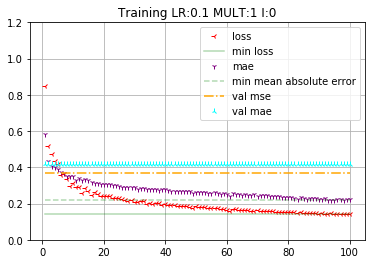

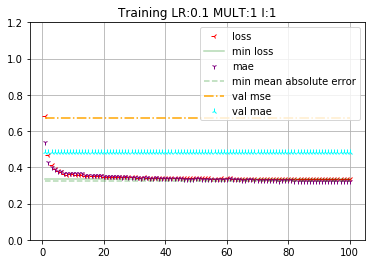

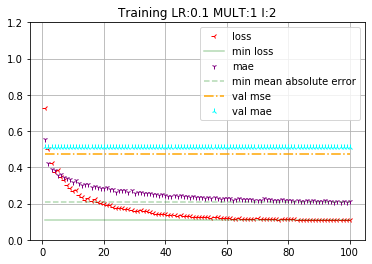

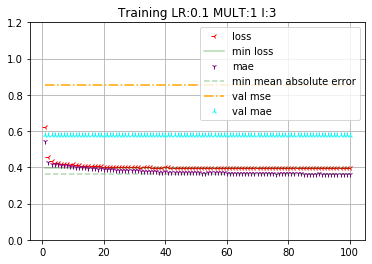

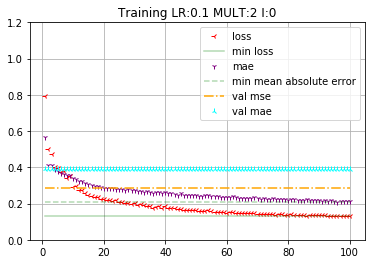

...

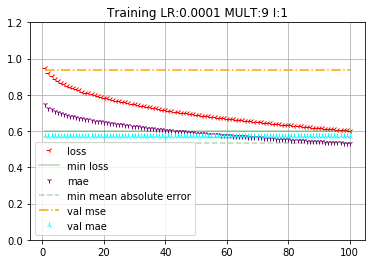

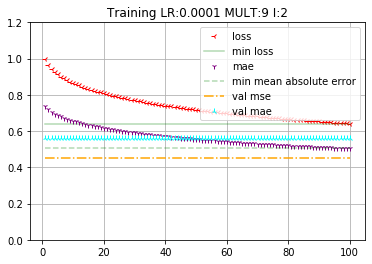

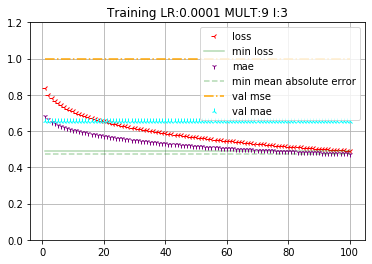

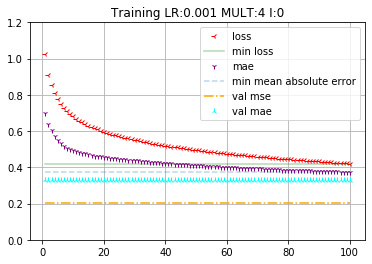

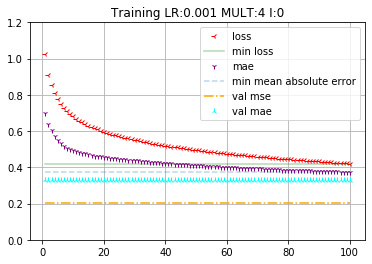

<Figure size 432x288 with 0 Axes>

In [132]:
#val_loss
#val_mean_absolute_error
#loss
#mean_absolute_error
import matplotlib.pyplot as plt
def my_plot(history, color, rec):
    print(rec)
    acc = rec['hist'].history['loss']
    #val_acc = history.history['val_loss']
    loss = rec['hist'].history['mean_absolute_error']
    #val_loss = history.history['val_mean_absolute_error']
    epochs = range(1, len(acc) + 1)
    
    plt.plot(epochs, acc, '3', label='loss', alpha=1, color='red')
    plt.plot(epochs, np.full((100,), rec['min_loss']), '-', label='min loss', alpha=0.3, color='green')
    
    plt.plot(epochs, loss, '1', label='mae', alpha=1, color='purple')
    plt.plot(epochs, np.full((100,), rec['min_mean_absolute_error']), '--', label='min mean absolute error', alpha=0.3, color=color)

    plt.plot(epochs, np.full((100,), rec['val_mse']), '-.', label='val mse', alpha=1, color='orange')
    plt.plot(epochs, np.full((100,), rec['val_mae']), '2', label='val mae', alpha=1, color='cyan')

    #plt.plot(epochs, val_acc, 'b', label='Validation acc', color=color)
    plt.title('Training LR:{0} MULT:{1} I:{2}'.format(rec['lr'],rec['mult'],rec['i']))
    plt.legend()
    plt.grid()
                                                                        
    plt.ylim([0,1.2])  
    plt.figure()


val_mae=100
val_mse=100
for rec in all_scores_hist:
    #print(rec['hist'], dir(rec['hist']))
    #print(rec['hist'].history)
    #print('='*20)
    my_plot(rec['hist'], color, rec)
    
    if val_mae > rec['val_mae']: val_mae = rec['val_mae']
    if val_mse > rec['val_mse']: val_mse = rec['val_mse']
    
print(val_mse, val_mae)    
        
for rec in all_scores_hist:
    if val_mse==rec['val_mse']:
        my_plot(rec['hist'], None, rec)
    if val_mae==rec['val_mae']:
        my_plot(rec['hist'], None, rec)
        

In [171]:
num_epochs = 45
all_mae_histories = []
my_histories=[]
k=1
mult=4
models_list=[]
#for ext_lr in [0.1, 0.03, 0.01, 0.003, 0.001, 0.0003, 0.0001]:
for ext_lr in [0.001]:
    for mult in range(4,5):
        for i in range(0,k):
            print('processing fold #', i)
            val_data = X[i * num_val_samples: (i + 1) * num_val_samples]
            val_targets = y[i * num_val_samples: (i + 1) * num_val_samples]

            partial_train_data = np.concatenate(
                [ X[:i * num_val_samples], X[(i + 1) * num_val_samples:]], 
                axis=0)
            partial_train_targets = np.concatenate(
                [ y[:i * num_val_samples], y[(i + 1) * num_val_samples:]], 
                axis=0)

            # Build the Keras model (already compiled)
            model = build_model(X, mult=mult, inp_lr=ext_lr) 
            # Train the model (in silent mode, verbose=0)
            tbCallBack = keras.callbacks.TensorBoard(log_dir='./GraphCarsLL'+"_"+str(ext_lr)+"_"+str(i)+"_"+str(mult), 
                        histogram_freq=0, write_graph=True, write_images=True)

            history = model.fit(partial_train_data, partial_train_targets,
                                validation_data=(val_data, val_targets),
                                epochs=num_epochs, batch_size=1, verbose=1, callbacks=[tbCallBack])

            mae_history = history.history['val_mean_absolute_error']
            all_mae_histories.append(mae_history)
            
            my_histories.append({
                'hist':history,
                'maehist':mae_history,
                'lr':ext_lr, 
                'i':i, 
                'min_loss':min(history.history['loss']),  
                'min_mean_absolute_error':min(history.history['mean_absolute_error']),
                'min_val_loss': min(history.history['val_loss']),
                'min_val_mean_absolute_error': min(history.history['val_mean_absolute_error'])
                 })
            
            models_list.append(model)

processing fold # 0
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1165 (Dense)           (None, 80)                1600      
_________________________________________________________________
dense_1166 (Dense)           (None, 40)                3240      
_________________________________________________________________
dense_1167 (Dense)           (None, 20)                820       
_________________________________________________________________
dense_1168 (Dense)           (None, 1)                 21        
Total params: 5,681
Trainable params: 5,681
Non-trainable params: 0
_________________________________________________________________
Train on 237 samples, validate on 79 samples
Epoch 1/45
237/237 [==============================] - 5s 23ms/step - loss: 1.0317 - mean_absolute_error: 0.6923 - val_loss: 0.5529 - val_mean_absolute_error: 0.5927
Epoch 2/45
237/237 [======================

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'epoch', 'history', 'model', 'on_batch_begin', 'on_batch_end', 'on_epoch_begin', 'on_epoch_end', 'on_train_begin', 'on_train_end', 'params', 'set_model', 'set_params', 'validation_data']

##params {'batch_size': 1, 'epochs': 45, 'steps': None, 'samples': 237, 'verbose': 1, 'do_validation': True, 'metrics': ['loss', 'mean_absolute_error', 'val_loss', 'val_mean_absolute_error']}



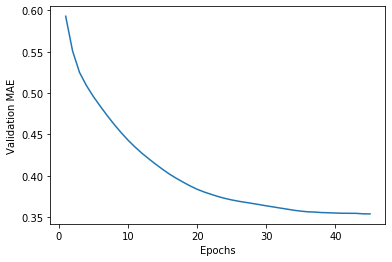

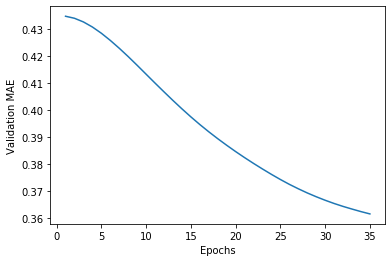

In [173]:
print(dir(my_histories[0]['hist']))
print()
print('##params',my_histories[0]['hist'].params)
print()


average_mae_history = [
    np.mean([x[i] for x in all_mae_histories]) for i in range(num_epochs)]

import matplotlib.pyplot as plt
plt.plot(range(1, len(average_mae_history) + 1), average_mae_history)
plt.xlabel('Epochs')
plt.ylabel('Validation MAE')
plt.show()

def smooth_curve(points, factor=0.9):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

smooth_mae_history = smooth_curve(average_mae_history[10:])
plt.plot(range(1, len(smooth_mae_history) + 1), smooth_mae_history)
plt.xlabel('Epochs')
plt.ylabel('Validation MAE')
plt.show()

In [221]:
for i in range(0,X.shape[0]):
    current_x=X[i:i+1]
    #print('#', i, current_x)
    predicted=models_list[0].predict(current_x)
    predicted_normalised = predicted[0][0]*mean['price']+std['price']
    actual =  y[i:i+1]*std['price']+mean['price']
    print(predicted_normalised, actual)
    print('='*20)

92.71147870552659 0    169.0
Name: price, dtype: float64
111.27066612005201 2    109.0
Name: price, dtype: float64
107.12722185053372 4    108.0
Name: price, dtype: float64
-26.834341167770177 6    50.0
Name: price, dtype: float64
98.42178180613064 8    98.0
Name: price, dtype: float64
-30.894988800272486 11    48.0
Name: price, dtype: float64
96.5514019967933 15    102.0
Name: price, dtype: float64
100.71889941740608 16    104.0
Name: price, dtype: float64
-38.55547281847757 18    44.0
Name: price, dtype: float64
103.87910166634757 22    112.0
Name: price, dtype: float64
27.563107706202413 23    77.0
Name: price, dtype: float64
-36.78393156404769 26    55.0
Name: price, dtype: float64
96.80940372041476 30    175.0
Name: price, dtype: float64
-13.320260513553464 33    42.0
Name: price, dtype: float64
-31.988340122156828 34    65.0
Name: price, dtype: float64
-20.001345568940934 38    45.0
Name: price, dtype: float64
17.085289993497064 40    79.0
Name: price, dtype: float64
-26.86844795

-48.839523169934324 387    52.0
Name: price, dtype: float64
28.17107777643775 394    80.0
Name: price, dtype: float64
116.71198574413195 401    99.0
Name: price, dtype: float64
121.30758257066115 409    199.0
Name: price, dtype: float64
97.8658361230014 412    145.0
Name: price, dtype: float64
89.46788793865606 428    110.0
Name: price, dtype: float64
81.64873259643933 430    120.0
Name: price, dtype: float64
106.61906013069242 436    156.0
Name: price, dtype: float64
22.508361345483962 440    76.0
Name: price, dtype: float64
-61.91968008774778 441    27.0
Name: price, dtype: float64
100.68027154617639 446    94.0
Name: price, dtype: float64
68.39165886130482 447    101.0
Name: price, dtype: float64
-23.533713088126447 477    48.0
Name: price, dtype: float64
96.77916221817804 485    99.0
Name: price, dtype: float64
95.41629389331278 488    115.0
Name: price, dtype: float64
-19.389968709976188 489    31.0
Name: price, dtype: float64
99.97898992167211 491    140.0
Name: price, dtype: flo

-47.28032544531432 893    33.0
Name: price, dtype: float64
-27.337501077078898 917    45.0
Name: price, dtype: float64
85.47796312830084 918    120.0
Name: price, dtype: float64
-19.090471410419696 919    48.0
Name: price, dtype: float64
98.79701485350131 924    88.0
Name: price, dtype: float64
106.54333827679639 926    142.0
Name: price, dtype: float64
95.16633952708152 929    84.0
Name: price, dtype: float64
102.34738611182047 936    114.0
Name: price, dtype: float64
101.94162812628292 941    151.0
Name: price, dtype: float64
-7.602468591068693 943    69.0
Name: price, dtype: float64
105.39628974006114 945    109.0
Name: price, dtype: float64
98.52850377019416 951    100.0
Name: price, dtype: float64
103.05066290297054 954    149.0
Name: price, dtype: float64
95.41629389331278 955    99.0
Name: price, dtype: float64
98.40440051452991 957    140.0
Name: price, dtype: float64
103.43026141942269 959    150.0
Name: price, dtype: float64
121.08499088682673 962    115.0
Name: price, dtype:

In [196]:
mean

allStrs       0.541139
bsns          0.325949
year       2015.202532
stars         4.556962
trips        30.050633
price        93.240506
money      2524.145570
dtype: float64

In [ ]:
N_train, _ = X_train.shape 
N_test,  _ = X_test.shape 
print(N_train, N_test)

from sklearn import ensemble
rf = ensemble.RandomForestRegressor(n_estimators=100, random_state=11)
rf.fit(X_train, y_train)

err_train = np.mean(y_train != rf.predict(X_train))
err_test  = np.mean(y_test  != rf.predict(X_test))
print (err_train, err_test)

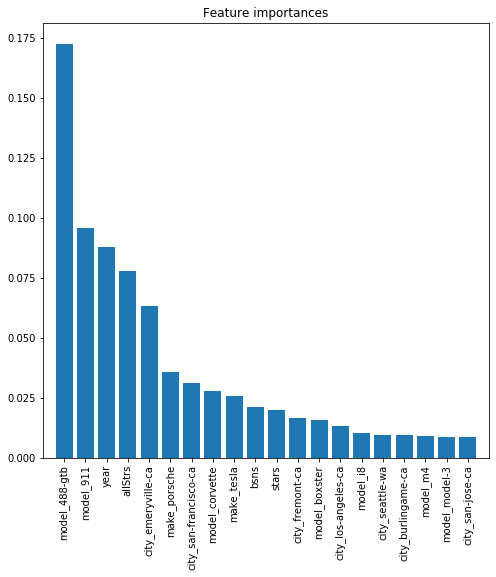

In [509]:
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
feature_names = X.columns
d_first = 20
plt.figure(figsize=(8, 8))
plt.title("Feature importances")
plt.bar(range(d_first), importances[indices[:d_first]], align='center')
plt.xticks(range(d_first), np.array(feature_names)[indices[:d_first]], rotation=90)
plt.xlim([-1, d_first]);